# Importing Libraries

In [1]:
import warnings
warnings.simplefilter("ignore")

import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import numpy as np
import calendar
import dash
from dash import dcc, html, dcc, callback_context
import dash_core_components as dcc
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output
import dash_html_components as html
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.tsa.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from textblob import TextBlob
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
from wordcloud import WordCloud
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer

# 

# Importing Dataset
#### This dataset will be used for complete Data Visualisation task and  for the Question 1 (Time Series) from Machine Learning for Business.

In [2]:
df = pd.read_csv('weather.csv')
df.head(5)

,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,2021-01-01,14.2,10.9,12.6,14.2,10.9,12.6,9.0,79.0,2.747,...,5.5,3,NaN,2021-01-01T08:29:19,2021-01-01T17:46:34,0.58,"Rain, Partially cloudy",Partly cloudy throughout the day with rain in ...,rain,"LTBA,17063099999,17119099999,17061099999,17064..."
1,2021-01-02,15.6,6.2,10.8,15.6,4.8,10.6,6.2,74.5,0.000,...,8.8,4,NaN,2021-01-02T08:29:24,2021-01-02T17:47:25,0.61,Clear,Clear conditions throughout the day.,clear-day,"LTBA,17063099999,17119099999,17061099999,17064..."
2,2021-01-03,14.4,6.9,11.0,14.4,6.1,10.9,5.9,71.4,0.000,...,5.9,4,NaN,2021-01-03T08:29:27,2021-01-03T17:48:19,0.65,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"D8508,LTBA,17063099999,17119099999,17061099999..."
3,2021-01-04,15.8,10.3,13.0,15.8,10.3,13.0,5.2,59.8,0.000,...,7.6,4,NaN,2021-01-04T08:29:27,2021-01-04T17:49:13,0.69,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"LTBA,17063099999,17119099999,17061099999,17064..."
4,2021-01-05,15.3,10.8,13.5,15.3,10.8,13.5,8.5,72.0,1.202,...,9.1,5,NaN,2021-01-05T08:29:26,2021-01-05T17:50:09,0.72,"Rain, Partially cloudy",Clearing in the afternoon with morning rain.,rain,"LTBA,17063099999,17119099999,17061099999,17064..."


#### For better understanding of the dataset, I'm providing terminology explanation, to be aware what each weather parameter represents:

datetime: Date and time of the weather data.

tempmax: Maximum temperature recorded.

tempmin: Minimum temperature recorded.

temp: Current temperature.

feelslikemax: Maximum "feels like" temperature.

feelslikemin: Minimum "feels like" temperature.

feelslike: Current "feels like" temperature.

dew: Dew point temperature.

humidity: Relative humidity percentage.

precip: Precipitation amount.

precipprob: Probability of precipitation.

precipcover: Extent of precipitation coverage.

preciptype: Type of precipitation (e.g., rain, snow).

snow: Snowfall amount.

snowdepth: Snow depth on the ground.

windgust: Maximum wind gust.

windspeed: Current wind speed.

winddir: Wind direction.

sealevelpressure: Atmospheric pressure at sea level.

cloudcover: Percentage of sky covered by clouds.

visibility: Visibility range in meters.

solarradiation: Solar radiation amount.

solarenergy: Solar energy captured or available.

uvindex: UV index.

severerisk: Risk of severe weather conditions.

sunrise: Time of sunrise.

sunset: Time of sunset.

moonphase: Current phase of the moon.

conditions: Summary of weather conditions.

description: Detailed description of weather conditions.

icon: Icon representing weather conditions.

stations: Information about weather monitoring stations or locations.

In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   datetime          2000 non-null   object 
 1   tempmax           2000 non-null   float64
 2   tempmin           2000 non-null   float64
 3   temp              2000 non-null   float64
 4   feelslikemax      2000 non-null   float64
 5   feelslikemin      2000 non-null   float64
 6   feelslike         2000 non-null   float64
 7   dew               2000 non-null   float64
 8   humidity          2000 non-null   float64
 9   precip            2000 non-null   float64
 10  precipprob        2000 non-null   float64
 11  precipcover       2000 non-null   float64
 12  preciptype        997 non-null    object 
 13  snow              2000 non-null   float64
 14  snowdepth         1999 non-null   float64
 15  windgust          1746 non-null   float64
 16  windspeed         2000 non-null   float64


# 

# Data Preparation

In [4]:
columns_with_nan = df.columns[df.isnull().any()].tolist()

nan_count_per_column = df[columns_with_nan].isnull().sum()

print("Columns with NaN values and their respective counts:")
print(nan_count_per_column)

Columns with NaN values and their respective counts:
preciptype          1003
snowdepth              1
windgust             254
sealevelpressure       1
severerisk          1374
stations               6
dtype: int64


In [5]:
columns_with_nan = df.columns[df.isnull().any()].tolist()

for column in columns_with_nan:
    unique_values = df[column].unique()
    print(f"Column '{column}':")
    print(unique_values)
    print("---------------------------------")

Column 'preciptype':
['rain' nan 'rain,snow' 'snow']
---------------------------------
Column 'snowdepth':
[0.  0.6 0.4 1.  1.3 3.2 1.4 2.6 2.5 1.1 nan]
---------------------------------
Column 'windgust':
[25.9 14.6 11.2 16.8 36.6 17.2 52.6 38.1 23.5 21.1 16.6 48.2 20.5 16.3
 30.9 61.2 15.4 12.4 30.5 28.1 33.5 26.3 51.8 64.8 22.9 66.6 24.7 55.4
 30.4 30.2 27.8 12.1 24.  11.3 36.  10.5 55.  68.4 21.9 31.3 46.4 25.6
  nan 21.5 13.9 13.1 21.7 16.7 15.9 14.8 57.6 23.  28.4 16.9 14.5 17.8
 18.4 19.9 25.  14.2 29.2 18.5 28.7 31.7 33.9 24.5 29.  13.3 59.4 23.9
 23.2 21.4 50.  24.1 17.  18.6 44.6 22.3 22.5 25.8 19.5 13.7 20.4 22.7
 15.3 16.  17.3 29.5 22.8 14.  14.7 25.5 26.8 26.5 28.8 18.2 21.3 25.7
 17.4 15.8 14.4 23.1 27.4 24.4 19.8 23.8 17.6 19.4 15.7 15.1 18.1 22.6
 22.  37.1 13.2 20.6 25.3 30.7 40.7 20.8 20.2 42.5 38.  18.7 19.6 53.6
 11.8 26.2 29.8 28.3 22.4 43.8 63.  13.  21.2 25.1 18.9 25.4 33.3 12.7
 18.3 28.6 38.3 30.1 13.5 18.  13.8 12.8 35.6 17.5 32.6 28.9 10.6 10.3
 24.3 83.5 48

# 

I looked for the unique values within columns that contain NaN values, to see if missing value is just matter of mistake or it indicates that value for that column was not available in the moment of recording, since it's weather data. 

1. precitype (Precipitation Type) It has 1003 NaN values. Missing values here suggest that the type of precipitation (rain, snow etc.) is not specified or availabe at the moment of recording. It might happen due to not having rain or snow at that moment at all. However, this column doesn't bring much value for my dataset and will drop it. 


2. snowdepth (Snow Depth): There is only 1 NaN value in this column. Snow depth typically represents the depth of accumulated snow at a specific location or time. One missing value indicates that snow depth data was not added as we have 0 within unique values. I will replace NaN value by using Interpolation.


3. windgust (Wind Gust): This column contains 254 missing values. Wind gust refers to the maximum wind speed observed over a brief period. The absence of values in this column for 254 observations signifies that wind gust data is not available for these instances, so I will replace thos NaN values by using Interpolation. 


4. sealevelpressure (Sea Level Pressure): There is 1 missing value in this column. Sea level pressure represents atmospheric pressure adjusted to sea level. One missing value implies that sea level pressure data was simply not added that day. I will replace NaN value using Interpolation. 


5. severerisk (Risk of Severe Weather Conditions): This column has 1374 missing values. Severerisk represents the risk level associated with severe weather conditions. The high count of missing values (1374) indicates that the risk level for severe weather was not applicable for these recordings, therefore NaN values as there was no risk level. In this situation, I will replace NaN values with 0 by using Imputation. 


6. stations: There are 6 missing values in the 'stations' column. This column might contain identifiers or codes for weather stations. The missing values suggest that the station identifiers are not added for these observations. Since this column doesn't bring any value to my dataset, as there are no longitude and altitude for plotting, I will just remove it from dataset. 

# 

### Removing NaN Values

#### Droppping columns

In [6]:
columns_to_drop = ['precip', 'precipprob', 'precipcover', 'preciptype', 'stations']
df.drop(columns=columns_to_drop, inplace=True)

#### Interpolation

In [7]:
df['sealevelpressure'].interpolate(method='linear', inplace=True)
df['windgust'].interpolate(method='linear', inplace=True)
df['snowdepth'].interpolate(method='linear', inplace=True)

#### Imputation

In [8]:
df['severerisk'].fillna(0, inplace=True)

#### Re-checking dataset

In [9]:
nan_values = df.isnull().sum()
nan_values

datetime            0
tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
snow                0
snowdepth           0
windgust            0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
severerisk          0
sunrise             0
sunset              0
moonphase           0
conditions          0
description         0
icon                0
dtype: int64

In [10]:
df['datetime'] = pd.to_datetime(df['datetime'])
df['sunrise'] = pd.to_datetime(df['sunrise'])
df['sunset'] = pd.to_datetime(df['sunset'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   datetime          2000 non-null   datetime64[ns]
 1   tempmax           2000 non-null   float64       
 2   tempmin           2000 non-null   float64       
 3   temp              2000 non-null   float64       
 4   feelslikemax      2000 non-null   float64       
 5   feelslikemin      2000 non-null   float64       
 6   feelslike         2000 non-null   float64       
 7   dew               2000 non-null   float64       
 8   humidity          2000 non-null   float64       
 9   snow              2000 non-null   float64       
 10  snowdepth         2000 non-null   float64       
 11  windgust          2000 non-null   float64       
 12  windspeed         2000 non-null   float64       
 13  winddir           2000 non-null   float64       
 14  sealevelpressure  2000 n

# 

# EDA

#### Data Distribution

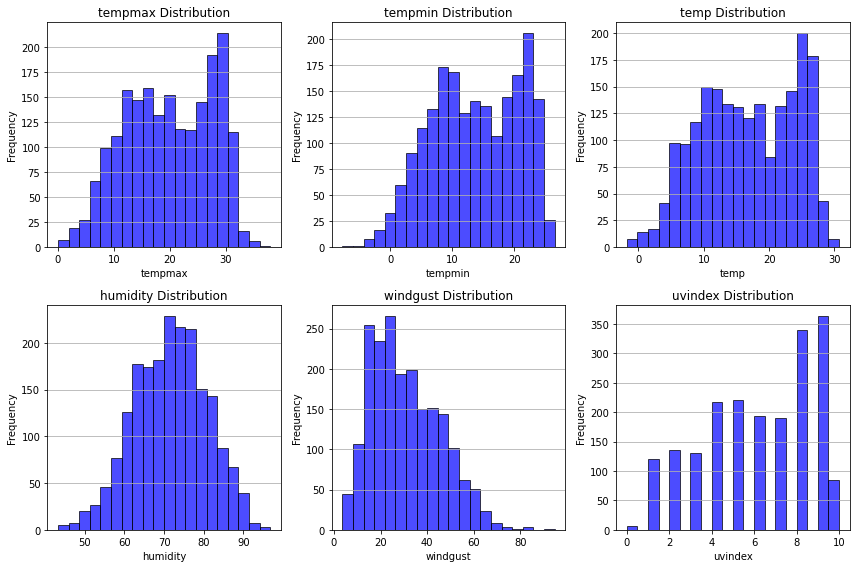

In [11]:
columns_for_histogram = ['tempmax', 'tempmin', 'temp', 'humidity', 'windgust', 'uvindex']

plt.figure(figsize=(12, 8))
for i, col in enumerate(columns_for_histogram, 1):
    plt.subplot(2, 3, i)
    plt.hist(df[col], bins=20, alpha=0.7, color='blue', edgecolor='black')
    plt.title(col + " Distribution")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [12]:
columns_for_histogram = ['tempmax', 'tempmin', 'temp', 'humidity', 'windgust', 'uvindex']
fig = px.histogram(df, x=columns_for_histogram, marginal="rug", title="Distribution of Weather Parameters")
fig.update_layout(bargap=0.3)  
fig.show()

As we can see from the distribution plots, most common 'tempmax' is around 30, which indicates that frequently occurring maximum temperature recorded is around 30 degrees Celsius. Most common minimum temperature is around 22C and most common temperature is around 25.

Most common humidity is in range between 70-75%, most common wind gusts are 15 to 20 km/h and most common UV index values are 8 and 9, which represent quite high exposure. 

Based on these information, weather conditions in this area could be described as moderately warm, with moderate humidity and wind gusts. This would imply comfortable climate with temperatures typically not too hot or cold, along with moderate humidity levels and occasional breezy conditions. We can see on minimum temperature that it barely goes under 0C. Also, due to high UV index, it would be advisable to take precautions when UV index is in most common range (8-9).


About the plot:

I created a histogram to visualise the distributions of numerical variables in my dataset. For this plot, I used probably the most relevant ones: 'tempmax', 'tempmin', 'temp', 'humidity', 'windgust' and 'uvindex'. 

I used 'blue' color for better visibility and aesthetic appeal in visualisations. I also added 'edgecolor=black' to define histogram bars edges for better distinction and readability. Also, as per feedback from CA1, I added Grid Lines for better readability of values and visual interpreting the distribution of data. In the plot under, I created a interactive version of static plot, for dashboard. 

#### Correlation Analysis

In [13]:
continuous_columns = ['temp', 'humidity', 'windgust', 'uvindex', 'severerisk']
pairplot_data = df[continuous_columns]

fig = px.scatter_matrix(pairplot_data, dimensions=continuous_columns, title='Correlation between Continuous Variables')

fig.update_traces(diagonal_visible=False)  
fig.update_layout(width=1000, height=800)  
fig.show()

Correlations between columns:

1. Logic correlation comes between UV index and temperature - higher UV index is noted on higher temperatures, but also, most of the high UV index values are noted between 20 and 30C. Higher severe risk was noted only on higher temperatures. There is no specific correlation really between temperature and wind gust or humidity, except that wind gusts and humidity mostly show up when temperature is above 0C.

2. Humidity doesn't have much impact on UV index, but high UV index appears mostly when humidity is less than 80%. High severity risks are appearing mostly on higher humidity levels. 

3. Wind gusts have no much correlation with other factors. High severe risks usually show up on wind gusts between 25-50 km/h.

#### Categorical Variables Analysis

In [14]:
icon_counts = df['icon'].value_counts().reset_index()
icon_counts.columns = ['Icon', 'Count']
fig = px.bar(
    icon_counts,
    x='Icon',
    y='Count',
    labels={'Icon': 'Icon', 'Count': 'Count'},
    title='Distribution of Weather Icons'
)

fig.update_layout(
    xaxis={'tickangle': 45},
    yaxis={'title': 'Count'},
    height=500,
    width=800
)

fig.show()

In [15]:
df['datetime'] = pd.to_datetime(df['datetime'])

fig = px.scatter(df, x='datetime', y='icon', labels={'icon': 'Icon', 'datetime': 'Date'},
                 title='Type of Weather for Each Day', hover_data={'datetime': '|%Y-%m-%d'})

fig.update_layout(
    xaxis={'title': 'Date'},
    yaxis={'title': 'Icon'},
    height=400, 
    width=700,  
    template='plotly_white',
    margin=dict(l=40, r=40, t=40, b=40), 
    font=dict(family="Arial", size=12), 
)

fig.show()

Categorical variables were 'conditions', 'description' and 'icon'. I decided to plot 'icon' as that column represents how the weather was that day and it represents target variable as well. Description is just explaining weather conditions that day and it contains too much unique text to be plotted. 

As we can see, even though the weather was explained as moderate warm and humid, we can see that most common weather tag was rain.

Again, I picked this plot to be interactive and added another interactive plot (to plot 'icon' against date, to get the type of weather for each day) for dashboard creating and added Grid Lines for better visibility and readbility. 

#### Relationship between Continuous Variables

In [16]:
continuous_columns = ['temp', 'humidity', 'windspeed', 'sealevelpressure', 'uvindex', 'severerisk', 'dew', 'visibility']
corr_matrix = df[continuous_columns].corr()

zmax = max(corr_matrix.values.max(), -corr_matrix.values.min())

heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='RdBu',  
    zmin=-zmax,
    zmax=zmax,
    colorbar=dict(title='Correlation'),
    hoverongaps=False
)

layout = go.Layout(
    title='Correlation Heatmap of Continuous Variables',
    xaxis=dict(title='Variables'),
    yaxis=dict(title='Variables'),
)

fig = go.Figure(data=[heatmap], layout=layout)

fig.show()

As we can see, columns with higher positive correlation are temperature, dew, visibility and UV Index in combination with each other. 


I used coolwarm as color map and I was using cool colors (blue shades) for negative correlations and warm colors (red shades) for positive correlations is intuitive for most people, as it represents contrast in familiar way. Also, the stronger correlation is (or opposite), the color is darker. 

#### Temperature Variation

In [17]:
temperature_columns = ['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike']

box_traces = []
for column in temperature_columns:
    box_trace = go.Box(
        y=df[column],
        name=column,
        boxmean='sd'  
    )
    box_traces.append(box_trace)

layout = go.Layout(
    title='Temperature Variation',
    yaxis=dict(title='Temperature (°C)'),
    xaxis=dict(title='Temperature Columns'),
    showlegend=True
)

fig = go.Figure(data=box_traces, layout=layout)

fig.show()

This plot is showing us how temperatures vary. From what we can see, it looks that "Feels like" temperatures are quite aligned with actual temperatures, especially with max and min temperature ('feelslike' has higher span than 'temp'). 

There are no outliers. 


I picked this plot as it enables to compare temperature-related variables in a single plot. This helps in understanding the range and distribution of different temperature-related measurements. It also provides key statistics which helps assesing central tendency and skewness of the data. 

#### Time-related Analysis

In [18]:
df['datetime'] = pd.to_datetime(df['datetime'])

dropdown_options = [{'label': col, 'value': col} for col in df.columns if col in [
    'tempmax', 'tempmin', 'temp', 'dew', 'humidity', 'snow', 'snowdepth',
    'windgust', 'windspeed', 'sealevelpressure', 'cloudcover', 'visibility',
    'solarradiation', 'solarenergy', 'uvindex', 'severerisk']
]

fig = go.Figure(go.Scatter(x=df['datetime'], y=df['temp'], mode='lines'))

fig.update_layout(
    title='Weather Trends over Time',    
    updatemenus=[
        {
            'buttons': [
                {
                    'label': var,
                    'method': 'update',
                    'args': [{'y': [df[var]]}],
                } for var in df.columns if var in [
                    'tempmax', 'tempmin', 'temp', 'dew', 'humidity', 'snow', 'snowdepth',
                    'windgust', 'windspeed', 'sealevelpressure', 'cloudcover', 'visibility',
                    'solarradiation', 'solarenergy', 'uvindex', 'severerisk']
            ],
            'direction': 'down',
            'showactive': True,
            'x': 0.01,
            'xanchor': 'left',
            'y': 1.1,
            'yanchor': 'top'
        }
    ]
)

fig.show()

I picked interactive plot with zoom funcionality due to large number of inputs, which wouldn't be readable in static plot. Users can zoom in and out for specific areas of interest, for closer examination of patterns or anomalies. 
Also, it provides ability to focus on smaller time intervals without losing the context of the entire dataset. I decided to add dropdown option, to give option to pick between most important weather variables.
Added Grid and blue color for better readability.

#### Mean data per year compared to overall mean

In [19]:
df['datetime'] = pd.to_datetime(df['datetime'])

df['year'] = df['datetime'].dt.year

columns_of_interest = ['temp', 'humidity', 'snow', 'windspeed', 'uvindex']

overall_mean = df[columns_of_interest].mean()

mean_by_year = df.groupby('year')[columns_of_interest].mean()

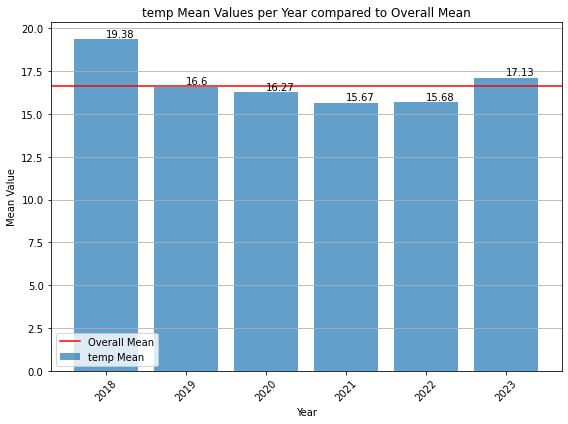

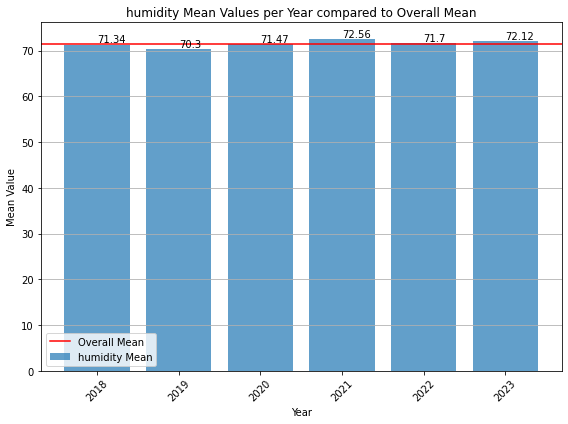

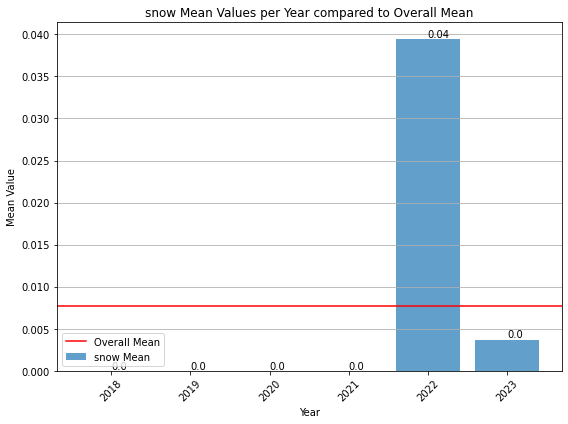

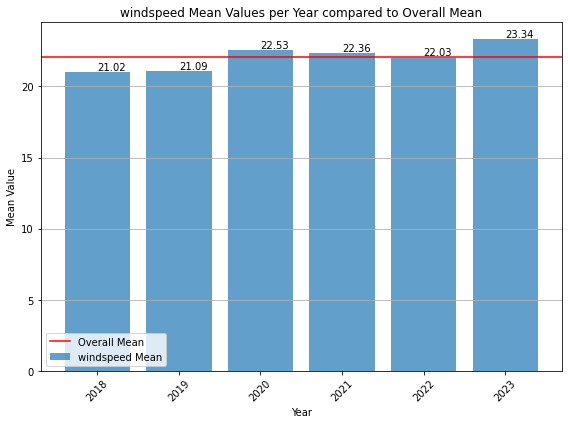

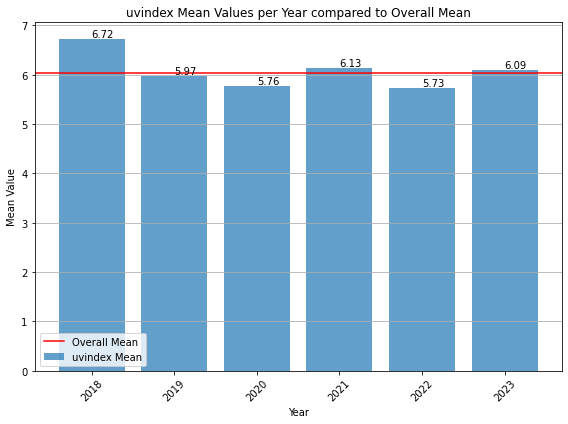

In [20]:
for col in columns_of_interest:
    plt.figure(figsize=(8, 6))

    plt.axhline(y=overall_mean[col], color='red', linestyle='-', label='Overall Mean')

    bars = plt.bar(mean_by_year.index, mean_by_year[col], alpha=0.7, label=f'{col} Mean')
    plt.title(f'{col} Mean Values per Year compared to Overall Mean')
    plt.xlabel('Year')
    plt.ylabel('Mean Value')
    plt.legend(loc='lower left')
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom')

    plt.tight_layout()
    plt.show()

As we can see from these dashboards, temperature was the only one that was showing some sort of jump compared to overall mean. Mean temperature for 2018 was 2C higher than mean and almost 4C higher than mean of 2021 and 2022. 

Other than that, we can see there was no much snow in these years, only in 2022, which was one of the colder years.


I used this plot to compare means values per year to the overall mean. It provides clear visual representation of how each zear's meand value for different variables compares to respective overall mean. It allows an easy comparison between the mean values and overall one. It also helps to identify if certain years were significantly different from others or from overall mean. 

I included Grid Lines and numeric values on top of the bars for better clarity and readability.

In [21]:
df['datetime'] = pd.to_datetime(df['datetime'])

df['month'] = df['datetime'].dt.month

mean_temp = df.groupby(['year', 'month'])['temp'].mean().reset_index()

pivot_mean_temp = mean_temp.pivot(index='month', columns='year', values='temp')
pivot_mean_temp = pivot_mean_temp.rename(index=lambda x: calendar.month_abbr[x])

fig = go.Figure(data=go.Heatmap(
    z=pivot_mean_temp.values.tolist(),
    x=pivot_mean_temp.columns,
    y=pivot_mean_temp.index,
    colorscale='YlOrRd', 
    zmin=pivot_mean_temp.min().min(), 
    zmax=pivot_mean_temp.max().max(), 
    colorbar=dict(title='Mean Temperature'),
    zhoverformat='.1f'
))

fig.update_layout(
    title='Mean Temperature per Month for Each Year',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Month')
)

fig.show()

I created this plot to get more in details temperature data for plot above this one. 

I used this type of plot as it effectively displays a matrix of data using variations in color to represent values. It's excellent for showcasing patterns in matrix-like datasets. By using color gradients, the heatmap makes it easy to interpret and compare mean temperature values. This color scheme helps to quickly grasp the variations in temperature across months and years, it's visible on the first sight which days were warmer than others.

# 

# Creating Interactive Dashboard

### Layout wireframe

Due to having JSON issues, dashboard was returning "Error loading layout" (but also, other parts of the workbook were not working) when I would add layout before dashboard itself. 

Since I lost so much time trying to resolve it, I simply removed layout.

### Dashboard

In [22]:
app = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

app.layout = html.Div([
    html.Div([
        html.Div([
            html.H1("Overview", style={'font-size': '26px','text-align': 'center'}),
            dcc.Markdown('''
            The dataset, sourced from [Kaggle](https://www.kaggle.com/datasets/rukenmissonnier/weather-in-istanbul/data), 
            presents an extensive collection of weather parameters specific to Istanbul, 
            collected between April 7, 2018, and September 27, 2023. 
            With 2000 entries and 32 columns, it covers various weather attributes such as temperature, humidity, precipitation, 
            wind characteristics, and more. Link to local address for better visiblity: http://127.0.0.1:8050/
            (*Open links in new tab!)
            '''),

            html.H3("Insights from Exploratory Data Analysis (EDA)", style={'font-size': '20px', 'text-align': 'center'}),
            dcc.Markdown('''
            ###### Temperature Analysis
            - **tempmax & tempmin**: Most commonly observed maximum temperature is approximately 30°C, while the typical minimum temperature hovers around 22°C. The average temperature observed falls close to 25°C.
            - **temp**: The frequently recorded temperature tends to be around 25°C.
            ###### Humidity and Wind Analysis
            - **humidity**: The prevalent humidity levels are within the range of 70-75%.
            - **windgust & windspeed**: Commonly recorded wind gusts range between 15 to 20 km/h.
            ###### UV Index and Weather Conditions
            - **uvindex**: The predominant UV index values are 8 and 9, indicating substantial exposure to UV radiation.
            - **conditions & description**: The prevailing weather conditions suggest a moderately warm climate, with moderate humidity and occasional breezy conditions. The temperatures typically maintain a comfortable range without extreme hot or cold spells. Notably, the minimum temperature rarely drops below 0°C.
            ###### Precautionary Measures
            Given the fact we have a high count of the higher UV index values (8-10), it is advisable to take precautions against sun exposure during periods when the UV index is at its most common levels.
            ''')
        ], className='section'),
    ], className='col-6'),

        html.Div([
            html.Div([
                html.H1("Distribution of Weather Parameters", style={'font-size': '24px', 'text-align': 'center'}),
                dcc.Dropdown(
                    id='weather-params-dropdown',
                    options=[
                        {'label': 'Temperature', 'value': 'temp'},
                        {'label': 'Humidity', 'value': 'humidity'},
                        {'label': 'Wind Gust', 'value': 'windgust'},
                        {'label': 'UV Index', 'value': 'uvindex'},
                        {'label': 'Max Temperature', 'value': 'tempmax'},
                        {'label': 'Min Temperature', 'value': 'tempmin'}
                ],
                value='temp' 
            ),
            dcc.Graph(id='weather-params-graph')
        ], className='section')
    ], className='col-6'),

    html.Div([
        html.Div([
            html.H1("Mean Temperature per Month for Each Year", style={'font-size': '22px', 'text-align': 'center'}),
            dcc.Dropdown(
                id='year-dropdown',
                options=[{'label': str(year), 'value': year} for year in df['year'].unique()],
                value=df['year'].min(), 
                clearable=False,
                style={'width': '50%'} 
            ),
            dcc.Dropdown(
                id='month-dropdown',
                options=[{'label': calendar.month_abbr[month], 'value': month} for month in range(1, 13)],
                value=8, 
                clearable=False, 
                style={'width': '50%'} 
            ),
            dcc.Graph(id='mean-temp-graph')
        ], className='section')
    ], className='col-6'),

    html.Div([
        html.Div([
            html.H1("Correlation Heatmap of Continuous Variables", style={'font-size': '22px', 'text-align': 'center'}),
            dcc.Dropdown(
                id='corr-vars-dropdown-1',
                options=[{'label': col, 'value': col} for col in df.columns],
                value=['temp', 'humidity', 'snow', 'windspeed'], 
                multi=True 
            ),
            dcc.Graph(id='corr-heatmap-2')
        ], className='section'),
    ], className='col-6'),

    html.Div([
        html.Div([
            html.H1("Weather Trends over Time", style={'font-size': '24px', 'text-align': 'center'}),
            dcc.Dropdown(
                id='weather-params-dropdown2',
                options=[
                    {'label': col, 'value': col} for col in [
                        'tempmax', 'tempmin', 'temp', 'dew', 'humidity', 'snow', 'snowdepth',
                        'windgust', 'windspeed', 'sealevelpressure', 'cloudcover', 'visibility',
                        'solarradiation', 'solarenergy', 'uvindex', 'severerisk']
                ],
                value='temp' 
            ),
            dcc.Graph(id='weather-trends-graph', figure=fig) 
        ], className='section'),
    ], className='col-6'),

    html.Div([
        html.Div([
            html.H1("Type of Weather for Each Day", style={'font-size': '24px', 'text-align': 'center'}),
            dcc.Graph(id='weather-type-graph') 
        ], className='section'),
    ], className='col-6')
], className='row')



@app.callback(
    Output('weather-params-graph', 'figure'),
    [Input('weather-params-dropdown', 'value')]
)
def update_weather_params_graph(selected_param):
    if selected_param is None:
        default_param = 'temp'  
        columns_for_histogram = [default_param]
    else:
        columns_for_histogram = [selected_param]

    fig = px.histogram(df, x=columns_for_histogram, marginal="rug", title=f"Distribution of {columns_for_histogram[0].capitalize()}")
    fig.update_layout(
        bargap=0.3,
        width=800,
        template='plotly_white',
        height=600,
        margin=dict(l=40, r=40, t=40, b=40),
    )
    return fig
    


@app.callback(
    Output('mean-temp-graph', 'figure'), 
    [Input('year-dropdown', 'value'),
     Input('month-dropdown', 'value')]
)
def update_mean_temp_graph(selected_year, selected_month):
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['month'] = df['datetime'].dt.month

    mean_temp = df.groupby(['year', 'month'])['temp'].mean().reset_index()
    pivot_mean_temp = mean_temp.pivot(index='month', columns='year', values='temp')
    pivot_mean_temp = pivot_mean_temp.rename(index=lambda x: calendar.month_abbr[x])

    selected_temp = pivot_mean_temp[selected_year]
    selected_month_str = calendar.month_abbr[selected_month]

    fig = go.Figure(go.Heatmap(
        z=pivot_mean_temp.values.tolist(),
        x=pivot_mean_temp.columns,
        y=pivot_mean_temp.index,
        colorscale='YlOrRd',
        zmin=pivot_mean_temp.min().min(),
        zmax=pivot_mean_temp.max().max(),
        colorbar=dict(title='Mean Temperature'),
        zhoverformat='.1f'
    ))
    fig.update_layout(
        title=f'Mean Temperature for {selected_month_str} {selected_year}',
        template='plotly_white',
        xaxis=dict(title='Year'),
        yaxis=dict(title='Month'),
        annotations=[
            dict(
                x=selected_year,
                y=pivot_mean_temp.index.get_loc(selected_month_str), 
                xref="x",
                yref="y",
                text=f"Mean Temp: {selected_temp.loc[selected_month_str]:.1f}",
                showarrow=True,
                arrowhead=7,
                ax=0,
                ay=-40
            )
        ]
    )
    return fig

@app.callback(
    Output('corr-heatmap-2', 'figure'),  
    [Input('corr-vars-dropdown-1', 'value')]
)
def update_corr_heatmap(selected_variables):
    corr_matrix = df[selected_variables].corr()

    zmax = max(corr_matrix.values.max(), -corr_matrix.values.min())

    heatmap = go.Heatmap(
        z=corr_matrix.values,
        x=corr_matrix.columns,
        y=corr_matrix.columns,
        colorscale='RdBu',
        zmin=-zmax,
        zmax=zmax,
        colorbar=dict(title='Correlation'),
        hoverongaps=False
    )

    layout = go.Layout(
        template='plotly_white',
        xaxis=dict(title='Variables'),
        yaxis=dict(title='Variables'),
    )

    fig = go.Figure(data=[heatmap], layout=layout)

    return fig


@app.callback(
    Output('weather-trends-graph', 'figure'),
    [Input('weather-params-dropdown2', 'value')]
)
def update_weather_trends_graph(selected_param):

    updated_fig = go.Figure(go.Scatter(x=df['datetime'], y=df[selected_param], mode='lines'))

    updated_fig.update_layout(
        title=f"Weather Trends for {selected_param}",
        template='plotly_white',
        xaxis=dict(title='Date'),
        yaxis=dict(title=selected_param)
    )

    return updated_fig

@app.callback(
    Output('weather-type-graph', 'figure'),
    [Input('weather-params-dropdown2', 'value')]
)
def update_weather_type_graph(selected_param):
    
    df['datetime'] = pd.to_datetime(df['datetime'])
    fig = px.scatter(df, x='datetime', y='icon', labels={'icon': 'Icon', 'datetime': 'Date'})
    
    fig.update_layout(
        xaxis={'title': 'Date'},
        yaxis={'title': 'Icon'},
        height=400,
        width=700,
        template='plotly_white',
        margin=dict(l=40, r=40, t=40, b=40),
        font=dict(family="Arial", size=12),
    )

    return fig

if __name__ == '__main__':
    app.run_server(debug=True, dev_tools_ui=True)

As per assignment, we were supposed to create a interactive dashboard which will include 3 rows and 2 columns, making total of 6 sections. When it comes to visualisation compontents, in my workbook, I used Heatmap, Line Chart, Histograms, Bar Chart, Stacked Bar Chart, Boxplot and Scatter plots to visualise my dataset. Also, I used Interactive features like dropdowns and interactive plots.

My dashboard followed those instructions, it consist of 6 sections (3 rows and 2 columns). First section is overview of the dataset (text section), while other 5 are interactive plots (4 of them with dropdowns, one without.)

1. "Overview" is a text section, it's giving all the relevant information on the dataset I picked, as well as, link to it's source. Also, sums up all the conclusions I made by performing the EDA. 


2. "Distribution of Weather Parameters" is histogram, created to give insights on distribution of the weather parameters. I used this type of the plot as it's ideal to display the frequency of weather variables like temperature, humidity etc and it helps to recognise patterns and which values are most frequent. It also helps to understand ranges of weather conditions. I also included dropdown with variables, so users can pick variables that interest them.


3. "Mean Temperature per Month for Each Year" is a heatmap type of plot and it displays mean temperature variations across on month level, for 5 years. I picked this type of plot as it's perfect for illustrating how mean temperature varies over time, helping to identify seasonal patterns. It also shows variations effectively, allowing viewer to compare temperatures across different time period. I used colorscale='YlOrRd' as it makes visible to bare eye which periods were warmer and which ones were cooloer by the darker and lighter colors. This plot is also interactive, with dropdown allowing audience to pick a year and month of the interest.


4. "Correlation Heatmap of Continuous Variables" is a Heatmap (Correlation Matrix) type of plot. I picked this type of plot as it shows relationship between continuous variables in simple and understandable way. It's ideal for understanding the strengt of correlations between weather parameters like temperature, humidity, wind speed etc. Also, it helps to identify which variables are strongly correlated and by that, impacting each other. By having this plot, audience will be able, for example, to see strong correlation between temperature and UVIndex. I picked this colorscale as it clearly visible that variables with darker colors are in stronger correlation than ones in lighter colors. Stronger correlation is, the color is darker and vice-versa. Also, I made this plot interactive and added dropdown as well, with list of most important variables so audience can pick variables of their interest. 


5. "Weather Trends over Time" is time-series plot, Line Chart type. Purpose of this plot is to show trends or patterns over a continuous time period. It's really useful for visualising how weather parameters (eg. temperature, humidity etc) change or trend over time. It also helps audience to identify patterns, seasonality or long-term trends in the weather data. This plot is interactive as well, so audience can zoom in specific period of interest, but also they can pick from dropdown parameter of their interest, to see it's continous sequence and to percieve trends and changes more intuitively. 


6. "Type of Weather for Each Day" is categorical time series plot. I picked this plot to give audience more insights on what kind of weather was recorded each day, in case they want to compare other weather parameters with actual weather for that specific day. I used this type of plot as it's great for presenting categorical data like weather conditions (e.g. sunny, rainy, cloudy etc.) observed daily. It also helps to understand the distribution and frequency of each weather condition over the time. This plot was also interactive, due to high number of inputs, to make it readable. 


These plots together offer a comprehensive view of the weather dataset, covering distribution, trends over time, relationships between variables and correlations among continuous variables, ensuring a holistic understanding for audience. The selection of plots still effectively covers various asprects of the weather dataset, providing audience with multiple perspectives to explore and understand the data's nuances.


Choice of colors: I used blue color for bars, dots and lines as it's percieved as calm color, it's easy on eyes and can create sense of comfort for viewers, making it pleasant to look at for extended periods. In cases I had more options to pick at same time, I had to bring in other colors as well, for better visibility, but blue was main color in dashboard plots. Also, I was adding Grid Lines, as per instructions from previous assignment again, for better visibility, as well as using white background. 

# 

# Machine Learning for Business

## Time series analysis


Times series analysis involves analyzing data points collected or recorded at specific time intervals. It is used for forecasting, understanding underlying patterns and making predictions based on the time-dependent data. In machine learning, various models like ARMA, ARIMA, SARIMA etc. are applied to time series for prediction. 


Time series used on my specific dataset: 

Temporal Patterns and Trends:
Time series helps in uncovering patterns, trends, and seasonality within the data. It allows us to understand how weather attributes like temperature, humidity, wind characteristics, etc. change over time. 

Forecasting and Predictions:
Time series models are used to forecast future values based on historical patterns. For instance, predicting future temperature trends or the likelihood of certain weather conditions occurring based on past data.

Detecting Anomalies or Outliers:
Analyzing time series data helps in identifying unusual or anomalous events. Sudden spikes in temperature, unexpected weather patterns, or irregularities can be detected through time series analysis.

### 

In [23]:
df['datetime'] = pd.to_datetime(df['datetime'])

<Axes: >

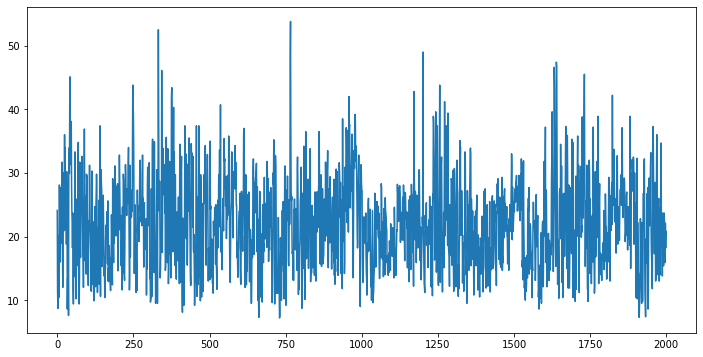

In [24]:
plt.figure(figsize=(12, 6))
df["windspeed"].plot()

### ADF Test

##### Purpose of Augmented Dickey-Fuller Test:
The ADF test is used to determine wheather a given time series is stationary or not. 
Stationarity is a crucial assumption in time series analysis, and the ADF test helps in confirming or rejecting the presence of a unit root in the data. A unit root suggests non-stationarity. 

Stationarity refers to a time series where statistical properties, like mean, variance, and autocorrelation, remain constant over time. In simpler terms, it doesn't exhibit long-term trends, and its statistical properties don't change with time.

Stationarity is vital in time series analysis because many forecasting models assume it. It simplifies analysis, making predictions more reliable. Non-stationary data might give misleading insights or forecasts, making modeling more challenging.


I will perform ADF test on 'windspeed' column.

In [25]:
result = adfuller(df['windspeed'], autolag='AIC')

print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'   {key}: {value}')

ADF Statistic: -16.030958107811855
p-value: 6.058032590027584e-29
Critical Values:
   1%: -3.4336320721769433
   5%: -2.862989840784964
   10%: -2.56754183359401


#### Results Analysis: 

ADF Statistic: The ADF Statistic value is -16.03. This value is significantly lower (more negative) than the critical values at 1%, 5%, and 10% levels, indicating strong evidence against the null hypothesis. This suggests that the 'windspeed' time series is stationary.

p-value: The p-value of approximately 6.06e-29 is well below the typical significance levels (e.g., 0.05), providing further evidence against the null hypothesis of non-stationarity. The low p-value indicates a high level of confidence in rejecting the null hypothesis in favor of stationarity.

Critical Values: All critical values at 1%, 5%, and 10% levels are more negative than the ADF Statistic, confirming the statistical significance of the test results and supporting the stationarity of the 'windspeed' time series.

With the ADF test indicating that the 'windspeed' time series is stationary, it suggests that there might not be a need for differencing or other transformations to make the data stationary before proceeding with time series modeling or analysis. This stationary characteristic simplifies the modeling process and makes it more suitable for various time series modeling techniques without requiring additional adjustments for stationarity.

### EDA 

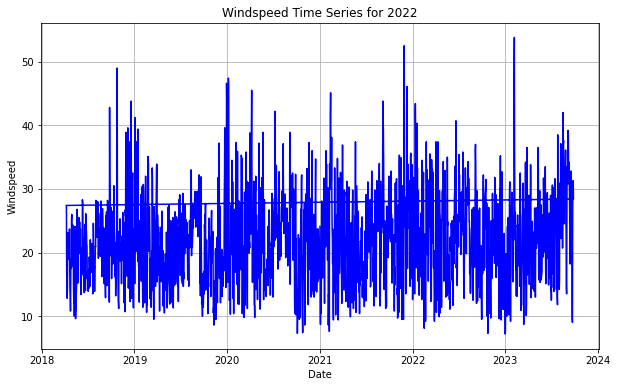

In [26]:
plt.figure(figsize=(10, 6))
plt.plot(df['datetime'], df['windspeed'], color='blue')
plt.title('Windspeed Time Series for 2022')
plt.xlabel('Date')
plt.ylabel('Windspeed')
plt.grid(True)
plt.show()

### Identification of Parameters

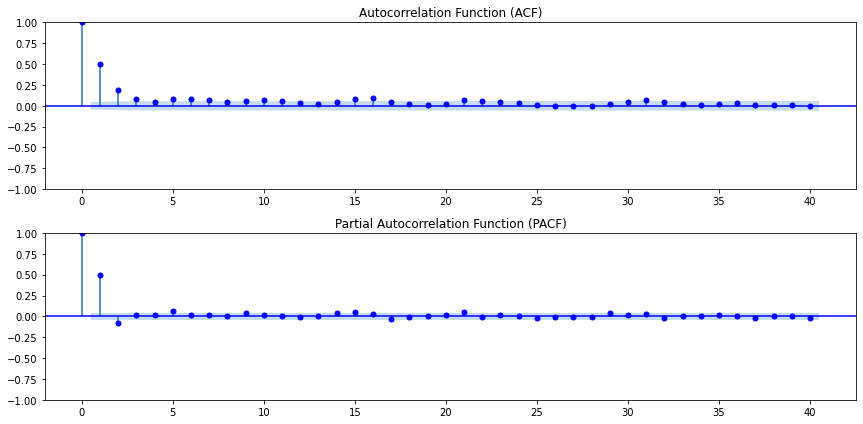

In [27]:
plt.figure(figsize=(12, 6))

plt.subplot(211)
plot_acf(df['windspeed'], lags=40, ax=plt.gca(), color='blue')
plt.title('Autocorrelation Function (ACF)')

plt.subplot(212)
plot_pacf(df['windspeed'], lags=40, ax=plt.gca(), color='blue')
plt.title('Partial Autocorrelation Function (PACF)')

plt.tight_layout()
plt.show()

### Model Selection


I decided to go with ARIMA based on observed characteristics of the windspeed time series data, particulary from ACF and PACF plot, along with some previous assumptions:

1. ACF and PACF Patterns: The significant spikes observed in the PACF plot at the first two lags and the ACF plot indicating a slow decay in autocorrelation suggest a potential autoregressive (AR) behavior at these lags. This pattern aligns with the characteristics that ARIMA models aim to capture.

2. Stationarity: As per the earlier analysis using the Augmented Dickey-Fuller (ADF) test, the 'windspeed' series was found to be stationary. ARIMA models are applicable to stationary time series data, and stationary series tend to exhibit consistent behavior over time, making them suitable for ARIMA modeling.

3. Time Dependency: ARIMA models are designed to capture time dependencies in data, especially those with observed autocorrelation patterns (as seen in ACF and PACF plots).

4. Forecasting: Since assignment requires one-step-ahead forecasting, ARIMA is used in short forcastings. 

### Finding the Best Parameters


As my dataset is already stationary, I might not need to include differencing in the model. 

In [28]:
aic_vals = []
for p in range(5):
    for q in range(5):
        model = sm.ARIMA(df['windspeed'], order=(p, 0, q))
        try:
            fitted_model = model.fit()
            aic = fitted_model.aic
            aic_vals.append([aic, p, q])
        except:
            continue

aic_vals.sort()

print(aic_vals)

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



[[12922.870791748675, 4, 4], [12923.58680985277, 3, 4], [12924.026399477283, 4, 1], [12924.068561918799, 4, 2], [12924.408540340293, 1, 4], [12925.673438723104, 1, 3], [12925.797373966172, 3, 3], [12925.85247369068, 2, 3], [12926.476531055105, 4, 3], [12929.61358108786, 2, 4], [12931.905736224646, 1, 1], [12932.280237776718, 2, 0], [12932.933773132165, 0, 3], [12933.818428647142, 3, 0], [12933.884874621326, 2, 1], [12933.885870607854, 1, 2], [12934.790500585337, 0, 4], [12934.971209712714, 3, 1], [12935.240332052148, 4, 0], [12935.870439780316, 2, 2], [12936.971266524735, 3, 2], [12941.127960574553, 1, 0], [12943.055834948493, 0, 2], [12997.963666930731, 0, 1], [13506.292880700092, 0, 0]]


C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



### Splitting the Dataset

In [29]:
train_size = int(len(df) * 0.8)

In [30]:
train_data, validation_data = df.iloc[:train_size], df.iloc[train_size:]

print("Training set size:", len(train_data))
print("Validation set size:", len(validation_data))

Training set size: 1600
Validation set size: 400


In [31]:
adfuller(train_data["windspeed"])

(-21.640029923718185,
 0.0,
 1,
 1598,
 {'1%': -3.4344487706424953,
  '5%': -2.8633503662338877,
  '10%': -2.567733803393165},
 10114.871839042296)

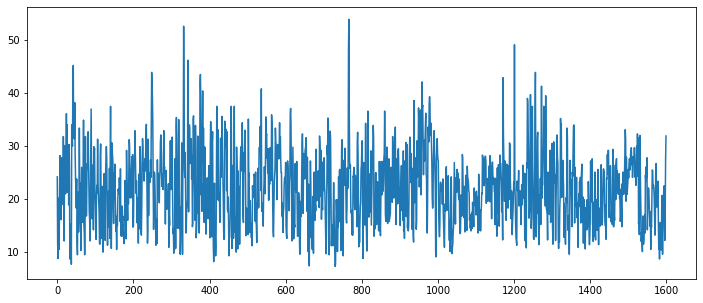

In [32]:
plt.figure(figsize= [12, 5])
plt.plot(train_data["windspeed"])

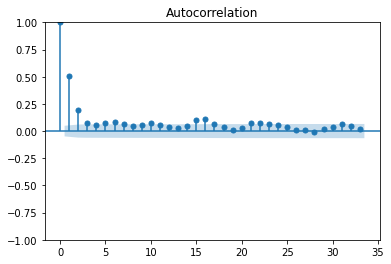

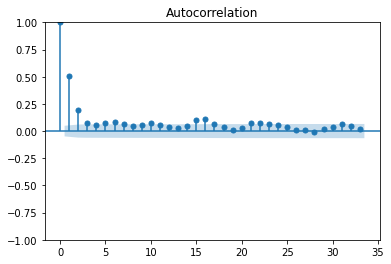

In [33]:
plot_acf(train_data["windspeed"])

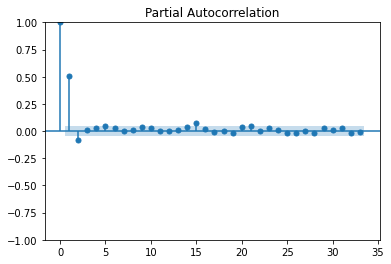

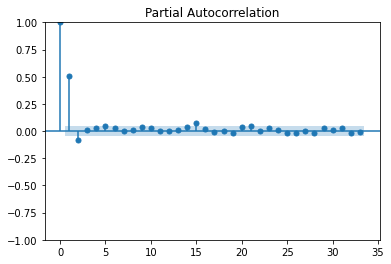

In [34]:
plot_pacf(train_data["windspeed"])

### Fitting ARIMA model

#### Parameters: p, d, q = 2, 0, 0

In [35]:
p, d, q = 4, 0, 4  
arima_model = sm.ARIMA(train_data['windspeed'], order=(p, d, q))
fitted_model = arima_model.fit()
fitted_model.summary()

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              windspeed   No. Observations:                 1600
Model:                 ARIMA(4, 0, 4)   Log Likelihood               -5135.821
Date:                Sun, 26 Nov 2023   AIC                          10291.642
Time:                        19:58:21   BIC                          10345.419
Sample:                             0   HQIC                         10311.611
                               - 1600                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.9690      0.359     61.258      0.000      21.266      22.672
ar.L1          0.0138      0.143      0.097      0.923      -0.266       0.294
ar.L2          0.5626      0.145      3.869      0.000       0.278       0.848
ar.L3          0.7624      0.163      4.689      0.000       0.444       1.081
ar.L4         -0.3411      0.082     -4.154      0.000      -0.502      -0.180
ma.L1          0.5354      0.251      2.134      0.033       0.044       1.027
ma.L2         -0.3593      0.340     -1.057      0.290      -1.025       0.307
ma.L3         -1.0026      0.282     -3.557      0.000      -1.555      -0.450
ma.L4         -0.1735      0.062     -2.797      0.005      -0.295      -0.052
sigma2        35.9382      7.454      4.822      0.000      21.329      50.547
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               122.48
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.65   Skew:                             0.52
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Further Investigation

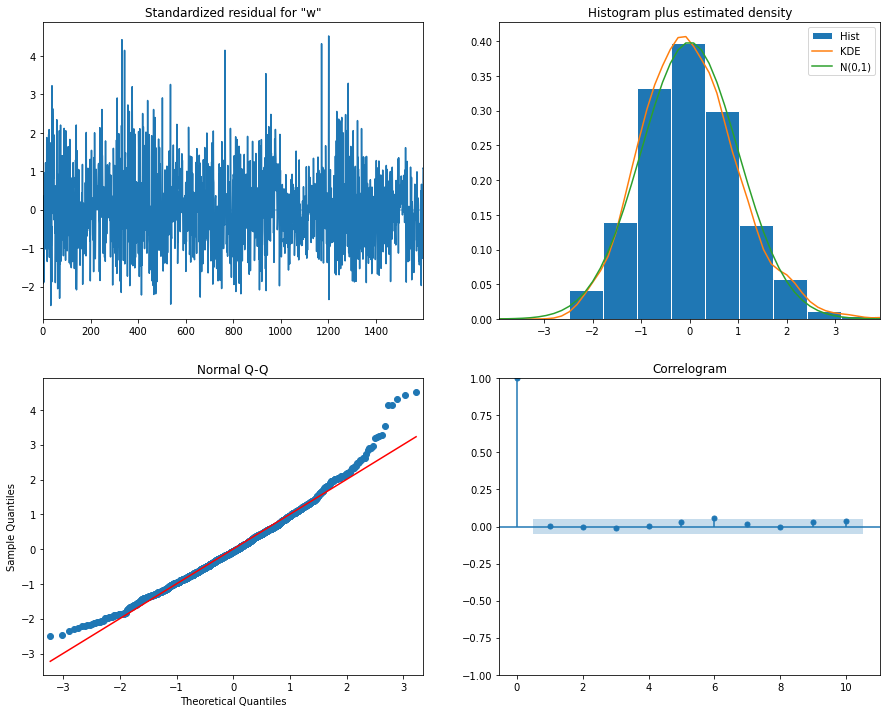

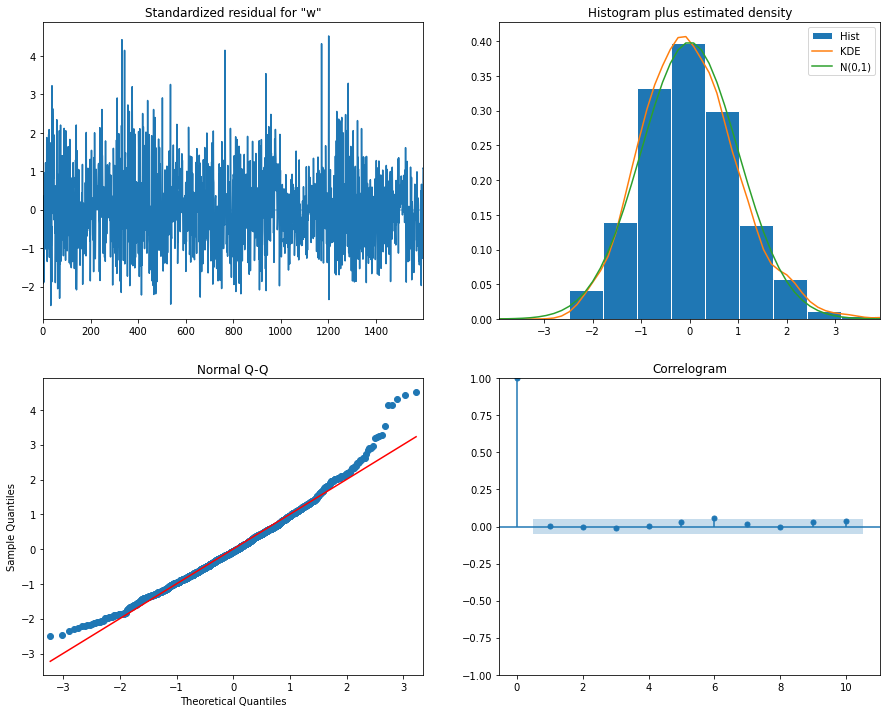

In [36]:
fitted_model.plot_diagnostics(figsize=(15, 12))

#### Parameters: p, d, q = 1, 0, 4

In [37]:
p, d, q = 1, 0, 4  
arima_model = sm.ARIMA(train_data['windspeed'], order=(p, d, q))
fitted_model2 = arima_model.fit()
fitted_model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              windspeed   No. Observations:                 1600
Model:                 ARIMA(1, 0, 4)   Log Likelihood               -5130.651
Date:                Sun, 26 Nov 2023   AIC                          10275.303
Time:                        19:58:24   BIC                          10312.947
Sample:                             0   HQIC                         10289.281
                               - 1600                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.9033      0.463     47.284      0.000      20.995      22.811
ar.L1          0.9623      0.030     31.639      0.000       0.903       1.022
ma.L1         -0.4190      0.037    -11.234      0.000      -0.492      -0.346
ma.L2         -0.3177      0.032     -9.994      0.000      -0.380      -0.255
ma.L3         -0.1289      0.027     -4.720      0.000      -0.182      -0.075
ma.L4         -0.0238      0.026     -0.919      0.358      -0.075       0.027
sigma2        35.6944      1.118     31.931      0.000      33.503      37.885
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               120.22
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.64   Skew:                             0.50
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Further Investigation

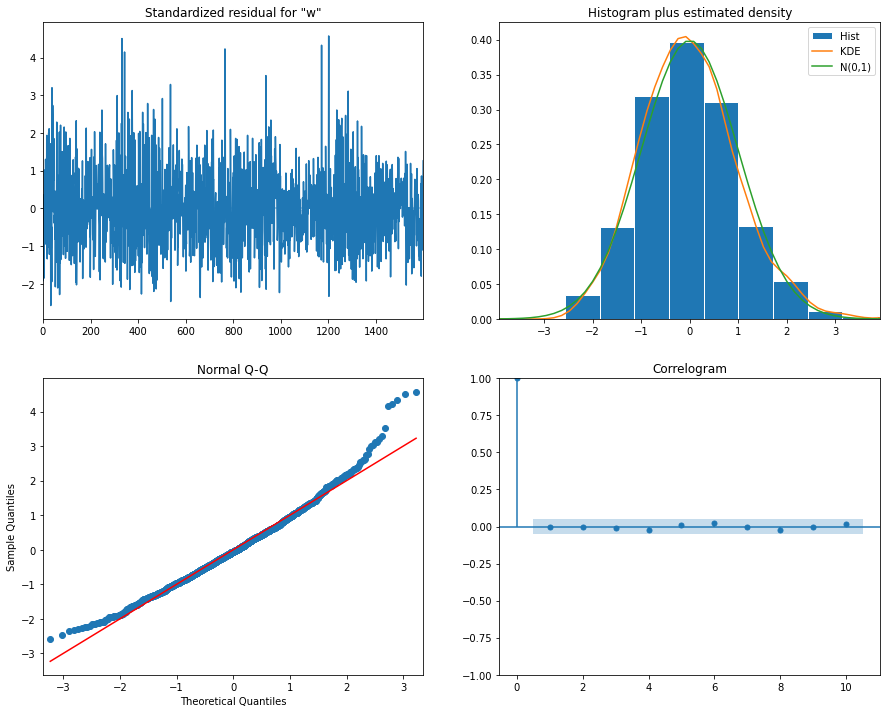

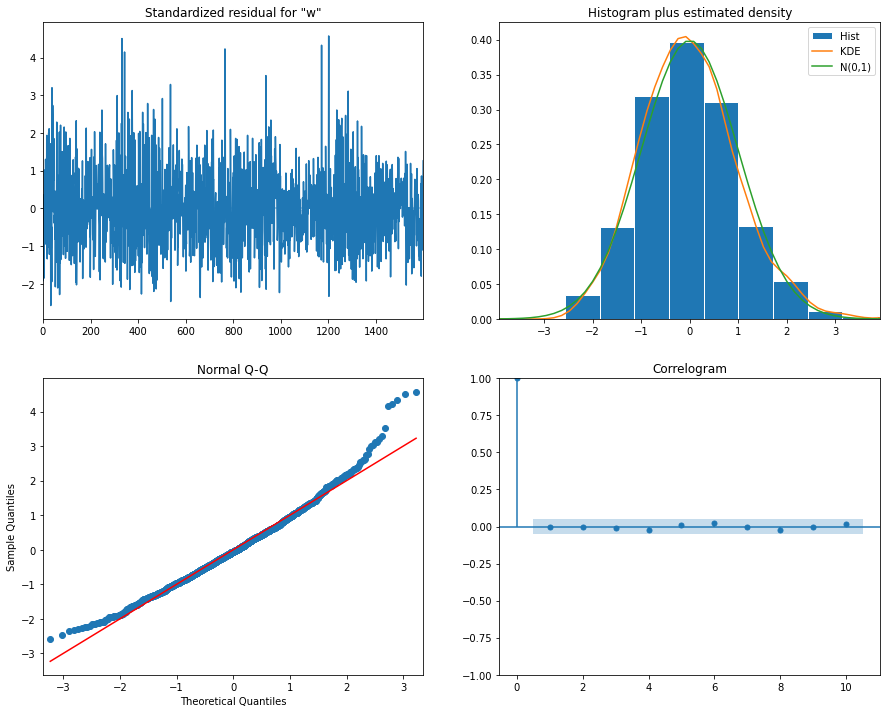

In [38]:
fitted_model2.plot_diagnostics(figsize=(15, 12))

### Forecast

In [39]:
actual_values = df['windspeed'].tail(10)

forecasted_values_df = pd.DataFrame()

for i in range(10):
    fitted_model = sm.ARIMA(pd.concat([df['windspeed'].head(len(df) - 10 + i), actual_values.head(i + 1)]), order=(4, 0, 4)).fit()
    
    next10_values = fitted_model.forecast(steps=10)
    
    next10_values.index = range(actual_values.index[-1] + 1, actual_values.index[-1] + 11)
    
    forecasted_values_df = pd.concat([forecasted_values_df, next10_values])

forecasted_values_df.reset_index(drop=True, inplace=True)

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Python\lib\site-packag

In [40]:
last_value = df['windspeed'].tail(1)

fitted_model = sm.ARIMA(df['windspeed'], order=(4, 0, 4)).fit() 

forecast_value = fitted_model.forecast(steps=1)
forecast_value.index = [actual_values.index[-1] + 1]

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



### Forcasted values

In [41]:
print("Last 10 actual values:")
print(actual_values.to_string)
print("-" * 30)  
print("Next 10 forecasted windspeed values:")
print(next10_values.to_string)
print("-" * 30)  

print("Last actual value:")
print(last_value.to_string)
print("-" * 30)  

print("Next forecasted value:")
print(forecast_value.to_string)

Last 10 actual values:
<bound method Series.to_string of 1990    19.8
1991    15.4
1992    22.2
1993    23.7
1994    22.5
1995    16.6
1996    15.9
1997    22.1
1998    18.2
1999    20.8
Name: windspeed, dtype: float64>
------------------------------
Next 10 forecasted windspeed values:
<bound method Series.to_string of 2000    21.384223
2001    21.032687
2002    20.990293
2003    21.391461
2004    21.718775
2005    21.615060
2006    21.322917
2007    21.280097
2008    21.532782
2009    21.743411
Name: predicted_mean, dtype: float64>
------------------------------
Last actual value:
<bound method Series.to_string of 1999    20.8
Name: windspeed, dtype: float64>
------------------------------
Next forecasted value:
<bound method Series.to_string of 2000    21.30511
dtype: float64>


The difference in the single forecasted value compared to the subsequent ten forecasted values may arise due to the model's estimation. When requesting only the next value, the model is making a prediction solely for that immediate step, whereas when requesting the next ten values, the model might consider longer-term trends and patterns, resulting in potentially different forecasts.
Adjusting the model parameters or training it with different configurations might influence these variations. 

### Forecast Errors

In [42]:
forecast_errors = []

for i in range(10):
    forecast = fitted_model.forecast(steps=1)
    
    forecast_errors.append(actual_values.values[i] - forecast)
    
    fitted_model = sm.ARIMA(pd.concat([df['windspeed'].head(len(df) - 10 + i), actual_values.head(i)]), order=(4, 0, 4)).fit()

print("Forecast Errors:")
print(forecast_errors)

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Python\lib\site-packag

Forecast Errors:
[2000   -1.50511
dtype: float64, 1990   -7.47737
dtype: float64, 1992    1.621399
dtype: float64, 1994    4.742794
dtype: float64, 1996    0.665079
dtype: float64, 1998   -6.715858
dtype: float64, 2000   -6.187444
dtype: float64, 2002    3.561517
dtype: float64, 2004   -0.927327
dtype: float64, 2006   -1.488254
dtype: float64]


C:\Python\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



### Model Evaluating

In [43]:
mae = mean_absolute_error(actual_values, next10_values)

rmse = mean_squared_error(actual_values, next10_values, squared=False)

r_squared = r2_score(actual_values, next10_values)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r_squared}")

Mean Absolute Error (MAE): 2.705045408840871
Root Mean Squared Error (RMSE): 3.2995232069395555
R-squared (R²): -0.33000065885612373


### Forecast on different parameters

In [44]:
p_new = 1 
d_new = 0 
q_new = 4

forecasted_values_df_2 = pd.DataFrame()

for i in range(10):
    fitted_model2 = sm.ARIMA(pd.concat([df['windspeed'].head(len(df) - 10 + i), actual_values.head(i + 1)]), order=(p_new, d_new, q_new)).fit()
    
    next10_values_2 = fitted_model2.forecast(steps=10)
    
    next10_values_2.index = range(actual_values.index[-1] + 1, actual_values.index[-1] + 11)
    
    forecasted_values_df_2 = pd.concat([forecasted_values_df_2, next10_values_2])

forecasted_values_df_2.reset_index(drop=True, inplace=True)

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Pyth

In [45]:
last_value = df['windspeed'].tail(1)

fitted_model2 = sm.ARIMA(df['windspeed'], order=(p_new, d_new, q_new)).fit() 

forecast_value_new = fitted_model2.forecast(steps=1)
forecast_value_new.index = [actual_values.index[-1] + 1]

In [46]:
print("Last 10 actual values:")
print(actual_values.to_string())
print("-" * 30)

print("Next 10 forecasted windspeed values:")
print(next10_values_2.to_string())
print("-" * 30)

print("Last actual value:")
print(last_value.to_string())
print("-" * 30)

print("Next forecasted value:")
print(forecast_value_new.to_string())

Last 10 actual values:
1990    19.8
1991    15.4
1992    22.2
1993    23.7
1994    22.5
1995    16.6
1996    15.9
1997    22.1
1998    18.2
1999    20.8
------------------------------
Next 10 forecasted windspeed values:
2000    21.349053
2001    21.312462
2002    21.384271
2003    21.363957
2004    21.393287
2005    21.421323
2006    21.448122
2007    21.473737
2008    21.498223
2009    21.521627
------------------------------
Last actual value:
1999    20.8
------------------------------
Next forecasted value:
2000    21.437274


In [47]:
forecast_errors = []

for i in range(10):
    forecast = fitted_model2.forecast(steps=1)
    
    forecast_errors.append(actual_values.values[i] - forecast)
    
    fitted_model2 = sm.ARIMA(pd.concat([df['windspeed'].head(len(df) - 10 + i), actual_values.head(i)]), order=(p_new, d_new, q_new)).fit() 

print("Forecast Errors:")
print(forecast_errors) 

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Pyth

Forecast Errors:
[2000   -1.637274
dtype: float64, 1990   -7.446826
dtype: float64, 1992    1.361283
dtype: float64, 1994    5.276556
dtype: float64, 1996    0.177379
dtype: float64, 1998   -6.004749
dtype: float64, 2000   -6.075708
dtype: float64, 2002    3.274563
dtype: float64, 2004   -0.741455
dtype: float64, 2006   -1.406805
dtype: float64]


In [48]:
mae = mean_absolute_error(actual_values, next10_values_2)
rmse = mean_squared_error(actual_values, next10_values_2, squared=False)
r_squared = r2_score(actual_values, next10_values_2)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r_squared}")

Mean Absolute Error (MAE): 2.6735556807935397
Root Mean Squared Error (RMSE): 3.3244868895502346
R-squared (R²): -0.35020194961779105


### Visualisation

#### Last 10 values vs one-step-ahead value

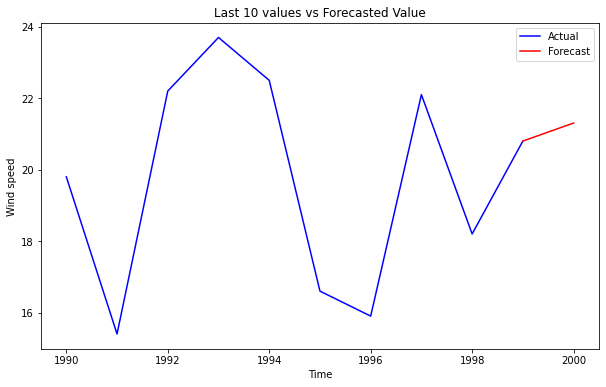

In [49]:
plt.figure(figsize=(10, 6))
forecast_index = actual_values.index[-1] + 1

plt.plot(actual_values.index, actual_values, label='Actual', color='blue') 

plt.plot([actual_values.index[-1], forecast_index], [actual_values.iloc[-1], forecast_value.iloc[0]], label='Forecast', color='red')

plt.xlabel('Time')
plt.ylabel('Wind speed')
plt.title('Last 10 values vs Forecasted Value')
plt.legend()

plt.show()

#### Last 10 values vs forecasted 10 values

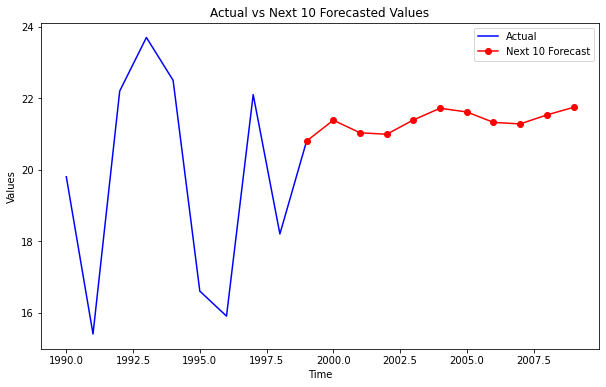

In [50]:
plt.figure(figsize=(10, 6))

plt.plot(actual_values.index, actual_values, label='Actual', color='blue')

forecast_index = actual_values.index[-1] + 1

forecast_values_index = [actual_values.index[-1]] + list(range(forecast_index, forecast_index + 10))
forecast_values = [actual_values.iloc[-1]] + list(next10_values)

plt.plot(forecast_values_index, forecast_values, label='Next 10 Forecast', color='red', marker='o')

plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Actual vs Next 10 Forecasted Values')
plt.legend()

plt.show()

# 

### Conclusion

The Mean Absolute Error (2.62) and Root Mean Squared Error (3.22) values suggest the model's predictive accuracy in terms of absolute and squared errors, but it still show that the model's performance might have room for improvement.

Lower values for MAE and RMSE are better, indicating smaller prediction errors. For R², a value closer to 1 is better, as it suggests the model explains a larger portion of the variability in windspeed. However, in my case, the negative R² indicates that my model might not be a great fit for this specific data, possibly due to the inadequacy of the model or the complexity of the underlying patterns in the data.


Nature of the variable I used for the predicting can significantly impact the model's performance. Wind speed data often exhibits high variability and can be influenced by various complex factors like weather patterns, geography, and seasonal variations. The inherent variability in wind speed data can make it challenging to capture precise patterns, impacting the model's predictive accuracy. considering the complexities in wind data, advanced modeling techniques should be explored, potentialy incorporating additional relevant features. 

I was testing this model with different parameters, scores were pretty much the same, even worse than these.

I did different approaches, changed size of dataset few times (tried with dataset based on weekly average for all the years, then with dataset for one year only due to computational requirements just to finish with complete dataset, for all the years to make model better on training.)

Also, I was testing different models and different features: I was working on temperature feature where I was using SARIMA, but had to give up due to computational requirements and seasonality of temperature dataset (I tried reducing datasets but it was still taking too long). 

At the end, I downloaded new dataset completely and was considering to try in that way, by bringing stock values dataset and performing ARMA model, but decided to stay with this one and not to change dataset for every task.


Even though my model provides some predictive capability, the scores suggest considering alternative modeling techniques to better capture complexities in the data. 

# 

# Text Analytics


Text analytics is a branch of natural language processing (NLP) that involves the extraction of valuable information and insights from unstructured textual data. It encompasses several techniques, including text categorization, topic modeling, and document summarization, each serving distinct purposes in handling and analyzing textual information.

### Importing dataset

In [51]:
df = pd.read_csv('climate_change_tweets.csv')
df.head(5)

,UserScreenName,UserName,Timestamp,Text,Embedded_text,Emojis,Comments,Likes,Retweets,Image link,Tweet URL
0,Lauren Boebert,@laurenboebert,2022-01-17T23:32:38.000Z,Lauren Boebert\n@laurenboebert\n·\nJan 18,The only solution I’ve ever heard the Left pro...,NaN,"1,683","2,259",11.7K,[],https://twitter.com/laurenboebert/status/14832...
1,Catherine,@catherine___c,2022-01-17T22:54:02.000Z,Catherine\n@catherine___c\n·\nJan 17,Climate change doesn’t cause volcanic eruption...,NaN,158,64,762,[],https://twitter.com/catherine___c/status/14832...
2,king Keith,@KaConfessor,2022-01-17T23:51:41.000Z,king Keith\n@KaConfessor\n·\nJan 18,Vaccinated tennis ball boy collapses in the te...,NaN,24,118,159,['https://pbs.twimg.com/ext_tw_video_thumb/148...,https://twitter.com/KaConfessor/status/1483225...
3,PETRIFIED CLIMATE PARENT,@climate_parent,2022-01-17T21:42:04.000Z,PETRIFIED CLIMATE PARENT\n@climate_parent\n·\n...,North America has experienced an average winte...,NaN,15,50,158,[],https://twitter.com/climate_parent/status/1483...
4,Thomas Speight,@Thomas_Sp8,2022-01-17T21:10:40.000Z,Thomas Speight\n@Thomas_Sp8\n·\nJan 17,They're gonna do the same with Climate Change ...,🅾,4,24,127,['https://pbs.twimg.com/profile_images/1544171...,https://twitter.com/Thomas_Sp8/status/14831850...


In [52]:
df. info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9050 entries, 0 to 9049
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   UserScreenName  9037 non-null   object
 1   UserName        9050 non-null   object
 2   Timestamp       9050 non-null   object
 3   Text            9050 non-null   object
 4   Embedded_text   9050 non-null   object
 5   Emojis          2026 non-null   object
 6   Comments        6278 non-null   object
 7   Likes           8431 non-null   object
 8   Retweets        8877 non-null   object
 9   Image link      9050 non-null   object
 10  Tweet URL       9050 non-null   object
dtypes: object(11)
memory usage: 777.9+ KB


### Text Preprocessing

#### Converting text to lowercase

In [53]:
df['Lowercase_Text'] = df['Embedded_text'].apply(lambda x: x.lower())

print("Lowercase Text:")
print(df['Lowercase_Text'].head())
print("---------------------------------------------")

Lowercase Text:
0    the only solution i’ve ever heard the left pro...
1    climate change doesn’t cause volcanic eruption...
2    vaccinated tennis ball boy collapses in the te...
3    north america has experienced an average winte...
4    they're gonna do the same with climate change ...
Name: Lowercase_Text, dtype: object
---------------------------------------------


#### Removing special characters

In [54]:
def remove_special_chars(text):
    text = re.sub(r'http\S+|www\S+|@[^\s]+', '', text)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

df['No_Special_Chars_Text'] = df['Lowercase_Text'].apply(remove_special_chars)

print("Text without Special Characters, URLs, and Usernames:")
print(df['No_Special_Chars_Text'].head())
print("---------------------------------------------")

Text without Special Characters, URLs, and Usernames:
0    the only solution ive ever heard the left prop...
1    climate change doesnt cause volcanic eruptions...
2    vaccinated tennis ball boy collapses in the te...
3    north america has experienced an average winte...
4    theyre gonna do the same with climate change w...
Name: No_Special_Chars_Text, dtype: object
---------------------------------------------


#### Tokenising text

In [55]:
df['Tokenized_Text'] = df['No_Special_Chars_Text'].apply(word_tokenize)

print("Tokenized Text:")
print(df['Tokenized_Text'].head(10))
print("---------------------------------------------")

Tokenized Text:
0    [the, only, solution, ive, ever, heard, the, l...
1    [climate, change, doesnt, cause, volcanic, eru...
2    [vaccinated, tennis, ball, boy, collapses, in,...
3    [north, america, has, experienced, an, average...
4    [theyre, gon, na, do, the, same, with, climate...
5    [hello, america, who, would, have, ever, thoug...
6    [fucking, hell, this, weather, makes, me, real...
7    [great, to, finally, have, this, important, un...
8    [climate, change, is, one, of, the, worlds, mo...
9    [can, people, start, questioning, the, johnson...
Name: Tokenized_Text, dtype: object
---------------------------------------------


#### Removing stopwords

In [56]:
stop_words = set(stopwords.words('english'))
df['Without_Stopwords_Text'] = df['Tokenized_Text'].apply(lambda tokens: [token for token in tokens if token not in stop_words])

print("Text without Stopwords:")
print(df['Without_Stopwords_Text'].head(10))
print("---------------------------------------------")

Text without Stopwords:
0    [solution, ive, ever, heard, left, propose, cl...
1    [climate, change, doesnt, cause, volcanic, eru...
2    [vaccinated, tennis, ball, boy, collapses, ten...
3    [north, america, experienced, average, winter,...
4    [theyre, gon, na, climate, change, starts, get...
5    [hello, america, would, ever, thought, world, ...
6    [fucking, hell, weather, makes, really, fuckin...
7    [great, finally, important, unescoscor, public...
8    [climate, change, one, worlds, pressing, probl...
9    [people, start, questioning, johnson, got, big...
Name: Without_Stopwords_Text, dtype: object
---------------------------------------------


### Text Categorisation / Sentiment Analysis

#### Data Labeling

In order not to do manual labeling or importing external labeled datasets, I will use Unsupervise Sentiment Analyisis. More precisely, I will use TextBlob to calculate sentiment polarity scores for each tweet text. The 'Sentiment_TextBlob' column will contain the polarity scores ranging from -1 (negative) to 1 (positive), indicating the sentiment polarity of the text.

In [57]:
df['Sentiment_TextBlob'] = df['Embedded_text'].apply(lambda x: TextBlob(x).sentiment.polarity)

def map_sentiment(score):
    if score > 0.1:
        return 'positive'
    elif score < -0.1:
        return 'negative'
    else:
        return 'neutral'
    
print(df[['Embedded_text', 'Sentiment_TextBlob']].head(10))

                                       Embedded_text  Sentiment_TextBlob
0  The only solution I’ve ever heard the Left pro...            0.037415
1  Climate change doesn’t cause volcanic eruption...            0.000000
2  Vaccinated tennis ball boy collapses in the te...           -0.125000
3  North America has experienced an average winte...            0.216667
4  They're gonna do the same with Climate Change ...           -0.090909
5  HELLO AMERICA,\n\nWho would have ever thought ...           -0.450000
6  fucking hell this weather makes me really fuck...           -0.308333
7  Great to finally have this important UNESCO/SC...            0.480000
8  Climate change is one of the world's most pres...            0.233333
9  Can people start questioning the "Johnson got ...           -0.335714


I will create discrete categorical labels directly from the sentiment polarity scores.

In [58]:
df['Sentiment'] = df['Sentiment_TextBlob'].apply(map_sentiment)
print(df[['Embedded_text', 'Sentiment']].head(10))

                                       Embedded_text Sentiment
0  The only solution I’ve ever heard the Left pro...   neutral
1  Climate change doesn’t cause volcanic eruption...   neutral
2  Vaccinated tennis ball boy collapses in the te...  negative
3  North America has experienced an average winte...  positive
4  They're gonna do the same with Climate Change ...   neutral
5  HELLO AMERICA,\n\nWho would have ever thought ...  negative
6  fucking hell this weather makes me really fuck...  negative
7  Great to finally have this important UNESCO/SC...  positive
8  Climate change is one of the world's most pres...  positive
9  Can people start questioning the "Johnson got ...  negative


#### Feature Extraction

After I have obtained the labeled dataset with sentiment scores assigned to the tweets, the next step would be feature extraction from the preprocessed text data. This step involves transforming the textual data into numerical features that machine learning models can understand and utilise for training. I will use TF-IDF method.

In [59]:
df['Processed_Text'] = df['Without_Stopwords_Text'].apply(lambda x: ' '.join(x))

In [60]:
tfidf_vectorizer = TfidfVectorizer()

In [61]:
tfidf_features = tfidf_vectorizer.fit_transform(df['Processed_Text'])
print("TF-IDF Matrix Shape:", tfidf_features.shape)

TF-IDF Matrix Shape: (9050, 26126)


#### Model Training


For this step, I'll use the Multinomial Naive Bayes classifier, a common choice for text classification tasks.

In [62]:
X = tfidf_features
y = df['Sentiment']

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [64]:
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

MultinomialNB()

#### Predictions and Evaluations

In [65]:
predictions = nb_classifier.predict(X_test)

In [66]:
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

Accuracy: 0.5961325966850829

Classification Report:
              precision    recall  f1-score   support

    negative       1.00      0.01      0.02       234
     neutral       0.55      0.80      0.66       837
    positive       0.68      0.55      0.61       739

    accuracy                           0.60      1810
   macro avg       0.75      0.45      0.43      1810
weighted avg       0.66      0.60      0.55      1810



The model's accuracy of approximately 59.61% suggests that it correctly predicts the sentiment for around 59.61% of the tweets in the test set. However, the classification report reveals that the model's performance varies across different sentiment classes.

It appears that the model has challenges distinguishing 'negative' sentiments, as it has very low recall and F1-score for this class, indicating that it correctly identifies very few 'negative' sentiments compared to the actual instances present in the test set.

#### Improving model scores

Since dataset suffers from significant class imbalance (fewer 'negative' sentiments), addressing this issue could be beneficial and I will do it by using Oversampling technique, to help balance the representation of different sentiment classes, potentially improving the model's ability to learn from underrepresented classes.

In [67]:
oversample = RandomOverSampler(sampling_strategy='minority')
X_train_oversampled, y_train_oversampled = oversample.fit_resample(X_train, y_train)

#### Retraining the model

In [68]:
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_oversampled, y_train_oversampled)

MultinomialNB()

In [69]:
predictions = nb_classifier.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

Accuracy: 0.549171270718232

Classification Report:
              precision    recall  f1-score   support

    negative       0.28      0.56      0.38       234
     neutral       0.59      0.60      0.59       837
    positive       0.73      0.49      0.59       739

    accuracy                           0.55      1810
   macro avg       0.53      0.55      0.52      1810
weighted avg       0.61      0.55      0.56      1810



The drop in accuracy might indicate that the model, after oversampling, struggles to generalize well to unseen data or that the approach to balancing the classes did not sufficiently improve the model's overall performance.

I will try with Fine-tuning Hyperparameters.

#### Fine-tuning Hyperparameters

In [70]:
nb_classifier = MultinomialNB()

In [71]:
alpha_values = [0.1, 0.5, 1.0, 1.5, 2.0]

In [72]:
param_grid = {'alpha': alpha_values}

In [73]:
grid_search = GridSearchCV(nb_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_oversampled, y_train_oversampled)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0, 1.5, 2.0]},
             scoring='accuracy')

In [74]:
best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_

In [75]:
best_model.fit(X_train_oversampled, y_train_oversampled)

MultinomialNB(alpha=0.1)

In [76]:
predictions = best_model.predict(X_test)

print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

Accuracy: 0.549171270718232

Classification Report:
              precision    recall  f1-score   support

    negative       0.31      0.34      0.33       234
     neutral       0.56      0.58      0.57       837
    positive       0.62      0.58      0.60       739

    accuracy                           0.55      1810
   macro avg       0.50      0.50      0.50      1810
weighted avg       0.55      0.55      0.55      1810



#### Exploring Advanced Models


Advanced models might capture more complex relationships within the text data, allowing for better representation of sentiments. I will try to improve scores with SVM Model.

In [77]:
svm_classifier = SVC(kernel='linear', C=1.0)

In [78]:
svm_classifier.fit(X_train_oversampled, y_train_oversampled)

SVC(kernel='linear')

In [79]:
predictions_svm = svm_classifier.predict(X_test)

In [80]:
accuracy_svm = accuracy_score(y_test, predictions_svm)
report_svm = classification_report(y_test, predictions_svm)

print(f"Accuracy (SVM): {accuracy_svm}")
print("Classification Report (SVM):")
print(report_svm)

Accuracy (SVM): 0.6397790055248619
Classification Report (SVM):
              precision    recall  f1-score   support

    negative       0.48      0.40      0.43       234
     neutral       0.62      0.72      0.66       837
    positive       0.73      0.63      0.67       739

    accuracy                           0.64      1810
   macro avg       0.61      0.58      0.59      1810
weighted avg       0.64      0.64      0.64      1810



The SVM model's overall performance, as indicated by accuracy and F1-scores, has shown significant enhancement compared to the previous model attempts.

#### Hyperparameter Tuning for SVM

In [81]:
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'], 
}

In [82]:
svm_classifier = SVC()

In [83]:
grid_search = GridSearchCV(svm_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_oversampled, y_train_oversampled)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [84]:
best_params = grid_search.best_params_
best_model_svm = grid_search.best_estimator_

In [85]:
best_model_svm.fit(X_train_oversampled, y_train_oversampled)

SVC(C=10)

In [86]:
predictions_svm_tuned = best_model_svm.predict(X_test)
accuracy_svm_tuned = accuracy_score(y_test, predictions_svm_tuned)
report_svm_tuned = classification_report(y_test, predictions_svm_tuned)

print(f"Best Hyperparameters: {best_params}")
print(f"Accuracy (Tuned SVM): {accuracy_svm_tuned}")
print("Classification Report (Tuned SVM):")
print(report_svm_tuned)

Best Hyperparameters: {'C': 10, 'kernel': 'rbf'}
Accuracy (Tuned SVM): 0.6414364640883978
Classification Report (Tuned SVM):
              precision    recall  f1-score   support

    negative       0.71      0.15      0.25       234
     neutral       0.60      0.78      0.68       837
    positive       0.71      0.64      0.67       739

    accuracy                           0.64      1810
   macro avg       0.67      0.52      0.53      1810
weighted avg       0.66      0.64      0.62      1810



The overall performance of the tuned SVM model, as indicated by accuracy and F1-scores, shows some improvement compared to the default SVM model without hyperparameter tuning but it seems that's the best accuracy can go.

# 

### Topic Modeling

Topic modeling is a technique used to discover abstract topics present in a collection of documents. One popular algorithm for topic modeling is Latent Dirichlet Allocation (LDA).

In [87]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

#### Preprocessing Data

In [88]:
def preprocess_text(text):
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    tokens = word_tokenize(text.lower())
    
    tokens = [lemmatizer.lemmatize(token) for token in tokens 
              if token not in stop_words and token not in string.punctuation]

    return ' '.join(tokens) if tokens else ''

In [89]:
df['Processed_Text'] = df['Embedded_text'].fillna('').apply(preprocess_text)

In [90]:
vectorizer = CountVectorizer(max_features=5000) 
doc_term_matrix = vectorizer.fit_transform(df['Processed_Text'])
print(f"Shape of Document-Term Matrix: {doc_term_matrix.shape}")

Shape of Document-Term Matrix: (9050, 5000)


#### Applying Latent Dirichlet Allocation (LDA) for Topic Modeling

In [91]:
num_topics = 5

In [92]:
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)

In [93]:
lda.fit(doc_term_matrix)

LatentDirichletAllocation(n_components=5, random_state=42)

#### Extracting Topics and Associated Words

In [94]:
def display_topics(model, feature_names, num_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        print(", ".join([feature_names[i] for i in topic.argsort()[:-num_top_words - 1:-1]]))
        print()

In [95]:
num_top_words = 10 
feature_names = vectorizer.get_feature_names_out()
print(f"Top {num_top_words} words for each topic:")
display_topics(lda, feature_names, num_top_words)

Top 10 words for each topic:
Topic 1:
climate, change, com, australia, uk, http, replying, flood, election, news

Topic 2:
climate, change, replying, fuel, fossil, gas, would, oil, people, war

Topic 3:
climate, change, com, new, org, http, energy, help, carbon, impact

Topic 4:
climate, change, tweet, quote, replying, year, people, show, http, thread

Topic 5:
climate, change, http, com, action, right, org, impact, pacific, need



#### Visualisation

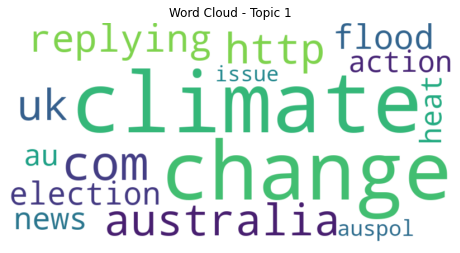

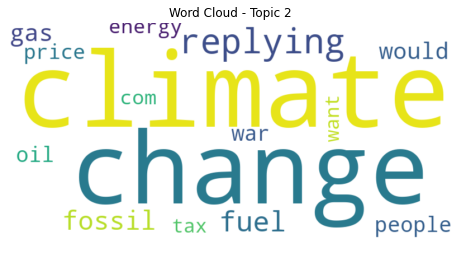

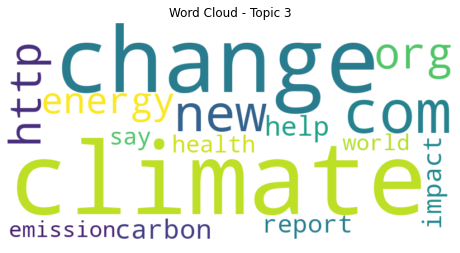

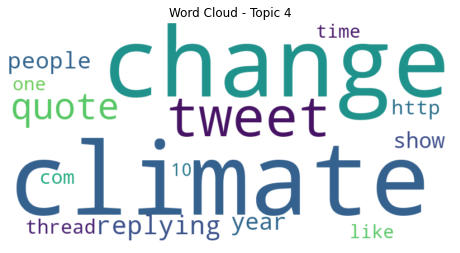

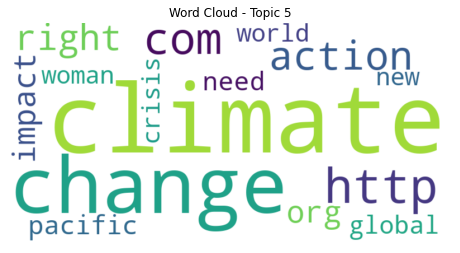

In [96]:
def generate_wordclouds(model, feature_names):
    num_topics = len(model.components_)
    for topic_idx, topic in enumerate(model.components_):
        word_freq = {feature_names[i]: topic[i] for i in topic.argsort()[:-15 - 1:-1]} 
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        plt.figure(figsize=(8, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Word Cloud - Topic {topic_idx + 1}")
        plt.show()

generate_wordclouds(lda, feature_names)

#### Topic-based Analysis

In [97]:
def assign_dominant_topic(model, doc_term_matrix):
    dominant_topics = model.transform(doc_term_matrix)
    return dominant_topics.argmax(axis=1) + 1  

df['Dominant_Topic'] = assign_dominant_topic(lda, doc_term_matrix)

topic_counts = df['Dominant_Topic'].value_counts().sort_index()
print("Tweet Count in Each Dominant Topic:")
print(topic_counts)

Tweet Count in Each Dominant Topic:
Dominant_Topic
1    1225
2    1610
3    1696
4    2702
5    1817
Name: count, dtype: int64


In [98]:
fig = px.bar(topic_counts, x=topic_counts.index, y=topic_counts.values, labels={'x': 'Dominant Topic', 'y': 'Tweet Count'},
             title='Tweet Count in Each Dominant Topic')
fig.update_traces(marker_color='skyblue')
fig.show()

#### Sentiment Analysis

In [99]:
def analyze_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'Positive'
    elif analysis.sentiment.polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'

In [100]:
for topic in range(1, 6):
    topic_tweets = df[df['Dominant_Topic'] == topic]['Embedded_text']
    df[f'Topic_{topic}_Sentiment'] = topic_tweets.apply(analyze_sentiment)

In [101]:
for topic in range(1, 6):
    print(f"Sentiment Distribution in Topic {topic}:")
    print(df[f'Topic_{topic}_Sentiment'].value_counts())
    print()

Sentiment Distribution in Topic 1:
Topic_1_Sentiment
Positive    679
Negative    334
Neutral     212
Name: count, dtype: int64

Sentiment Distribution in Topic 2:
Topic_2_Sentiment
Positive    901
Negative    419
Neutral     290
Name: count, dtype: int64

Sentiment Distribution in Topic 3:
Topic_3_Sentiment
Positive    1160
Negative     345
Neutral      191
Name: count, dtype: int64

Sentiment Distribution in Topic 4:
Topic_4_Sentiment
Positive    1458
Negative     833
Neutral      411
Name: count, dtype: int64

Sentiment Distribution in Topic 5:
Topic_5_Sentiment
Positive    1139
Neutral      354
Negative     324
Name: count, dtype: int64



Topics 4 and 5 predominantly exhibited a higher volume of positive sentiments compared to negative sentiments, with Topic 4 displaying the highest positive sentiment count. Conversely, Topic 4 also had a notable count of negative sentiments, showcasing a more balanced sentiment distribution. Topics 1, 2, and 3 showcased varying degrees of positive, negative, and neutral sentiments, with Topic 3 displaying a higher count of positive sentiments. Overall, the sentiment distributions indicate a mixed sentiment landscape surrounding climate change discussions, encompassing positive, negative, and neutral expressions across the identified topics.

#### Temporal Trends

In [102]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

In [103]:
df.set_index('Timestamp', inplace=True)

In [104]:
resampled_data = df['Text'].resample('D').count().reset_index()

In [105]:
fig = px.line(resampled_data, x='Timestamp', y='Text', title='Tweet Volume Related to Climate Change Over Time')
fig.update_xaxes(title='Time')
fig.update_yaxes(title='Tweet Count')
fig.show()

As we can see from the plot, there was significant spike in tweets on July 12th, 2022 with 175 tweets. 

# 

### Document Summarisation


Document summarization involves condensing a document's main points or content into a shorter representation while preserving its essence. I tried to use TextRank Algorithm, but I was facing many issues with gensim.summarization module and couldn't run it, even though I installed multiple needed libraries.

#### Summarisation with Term Frequency-Inverse Document Frequency (TF-IDF) scoring

In [106]:
documents = df['Without_Stopwords_Text'].tolist()
documents.extend(df['Without_Stopwords_Text'].tolist())
print(documents[:5])

[['solution', 'ive', 'ever', 'heard', 'left', 'propose', 'climate', 'change', 'taxes', 'control', 'less', 'freedom', 'one', 'playbook', 'fails', 'every', 'single', 'time', 'k'], ['climate', 'change', 'doesnt', 'cause', 'volcanic', 'eruptions'], ['vaccinated', 'tennis', 'ball', 'boy', 'collapses', 'tennis', 'court', 'due', 'climate', 'change'], ['north', 'america', 'experienced', 'average', 'winter', 'temperatures', 'snowfall', 'totals', 'line', 'historical', 'trends', 'fooled', 'phenomenon', 'known', 'asymptomatic', 'climate', 'change'], ['theyre', 'gon', 'na', 'climate', 'change', 'starts', 'get', 'really', 'bad', 'quote', 'tweet', 'rec', 'jan', 'really', 'want', 'fucking', 'live', 'covid']]


In [107]:
documents_str = [' '.join(tweet) for tweet in documents]

In [108]:
vectorizer = TfidfVectorizer()

In [109]:
tfidf_matrix = vectorizer.fit_transform(documents_str)

In [110]:
feature_names = vectorizer.get_feature_names_out()

In [111]:
doc_index = 0
feature_index = tfidf_matrix[doc_index].nonzero()[1]
tfidf_scores = zip(feature_index, [tfidf_matrix[doc_index, x] for x in feature_index])

In [112]:
sorted_tfidf_scores = sorted(tfidf_scores, key=lambda x: x[1], reverse=True)

In [113]:
top_words_count = 10
top_words = [feature_names[i] for i, _ in sorted_tfidf_scores[:top_words_count]]
print("Top words for summary:", top_words)

Top words for summary: ['propose', 'playbook', 'fails', 'freedom', 'heard', 'taxes', 'single', 'ive', 'solution', 'control']


#### Sumarising Top Words for all the tweets in the dataset

In [114]:
for doc_index in range(len(documents)):
    feature_index = tfidf_matrix[doc_index].nonzero()[1]
    tfidf_scores = zip(feature_index, [tfidf_matrix[doc_index, x] for x in feature_index])
    sorted_tfidf_scores = sorted(tfidf_scores, key=lambda x: x[1], reverse=True)
    top_words = [feature_names[i] for i, _ in sorted_tfidf_scores[:top_words_count]]
    print(f"Top words for tweet {doc_index + 1}: {top_words}")

Top words for tweet 1: ['propose', 'playbook', 'fails', 'freedom', 'heard', 'taxes', 'single', 'ive', 'solution', 'control']
Top words for tweet 2: ['eruptions', 'volcanic', 'cause', 'doesnt', 'change', 'climate']
Top words for tweet 3: ['tennis', 'ball', 'collapses', 'vaccinated', 'boy', 'court', 'due', 'change', 'climate']
Top words for tweet 4: ['asymptomatic', 'totals', 'fooled', 'snowfall', 'phenomenon', 'historical', 'trends', 'experienced', 'average', 'line']
Top words for tweet 5: ['really', 'rec', 'fucking', 'starts', 'gon', 'na', 'bad', 'jan', 'theyre', 'live']
Top words for tweet 6: ['fearing', 'flu', 'hello', 'cold', 'taken', 'common', 'thought', 'america', 'ever', 'could']
Top words for tweet 7: ['fucking', 'worse', 'anxious', 'couple', 'god', 'hell', 'bc', 'dead', 'within', 'makes']
Top words for tweet 8: ['techniques', 'unescoscor', 'chapters', 'outlining', 'algal', 'finished', 'publication', 'bloom', 'authors', 'harmful']
Top words for tweet 9: ['frontpage', 'msmfail', 

Top words for tweet 95: ['toxic', 'body', 'accept', 'propaganda', 'intergovernmental', 'destroy', 'scam', 'dioxide', 'force', 'place']
Top words for tweet 96: ['chilly', 'sweater', 'jews', 'controlled', 'later', 'wouldnt', 'degrees', 'gets', 'case', 'bring']
Top words for tweet 97: ['blurting', 'wed', 'known', 'morrison', 'see', 'change', 'climate']
Top words for tweet 98: ['burrows', 'marmot', 'ant', 'resurvey', 'biotic', 'hiking', 'interactions', 'dm', 'hills', 'alps']
Top words for tweet 99: ['something', 'year', 'think', 'pool', 'hill', 'need', 'included', 'crop', 'farm', 'insurance']
Top words for tweet 100: ['gif', 'alt', 'covid', 'change', 'climate']
Top words for tweet 101: ['cockroaches', 'roaches', 'unfazed', 'adaptable', 'cockroach', 'popscicom', 'reversed', 'wtpearth', 'planet', 'dominant']
Top words for tweet 102: ['scum', 'relax', 'arrival', 'dictatorship', 'aliens', 'restrictions', 'removing', 'supposed', 'several', 'plans']
Top words for tweet 103: ['whatcha', 'variant'

Top words for tweet 178: ['alt', 'changeaccelerating', 'uaw', 'lockport', 'worldclass', 'gm', 'expanded', 'manufacturing', 'ny', 'vehicle']
Top words for tweet 179: ['wolf', 'little', 'suppressed', 'cried', 'chicken', 'taught', 'lesson', 'boy', 'playbook', 'childrens']
Top words for tweet 180: ['ill', 'scififri', 'orb', 'rwo', 'nestled', 'well', 'vss', 'stars', 'liars', 'names']
Top words for tweet 181: ['trace', 'postdoctoral', 'modeling', 'ecosystem', 'fulltime', 'tropicalforest', 'michigan', 'scholar', 'postdoc', 'researcher']
Top words for tweet 182: ['reallocate', 'cad', 'cdnecon', 'speculation', 'import', 'aggressively', 'truckers', 'boost', 'rates', 'border']
Top words for tweet 183: ['meatloaf', 'vaccinations', 'mandates', 'passed', 'forget', 'away', 'lets', 'covid', 'people', 'change']
Top words for tweet 184: ['nbc', 'path', 'talked', 'steps', 'legislation', 'forward', 'got', 'next', 'change', 'climate']
Top words for tweet 185: ['tangible', 'mankind', 'societal', 'chaos', 'i

Top words for tweet 278: ['temperature', 'cape', 'record', 'town', 'hottest', 'destroyed', 'saturday', 'hectic', 'thesouthafricancom', 'cf']
Top words for tweet 279: ['better', 'unclear', 'coasts', 'estate', 'central', 'north', 'away', 'best', 'warming', 'still']
Top words for tweet 280: ['psychopaths', 'malthusian', 'romea', 'changeclub', 'resetclimate', 'schwabthe', 'outstrip', 'klaus', 'assume', 'belief']
Top words for tweet 281: ['bulbs', 'fiercely', 'attenboroughs', 'seeds', 'millennia', 'sad', 'survive', 'hotter', 'soil', 'die']
Top words for tweet 282: ['seasons', 'reliably', 'irregular', 'predictable', 'sequoias', 'fairly', 'thousand', 'arrived', 'attenborough', 'melt']
Top words for tweet 283: ['arizona', 'arewelldifferent', 'gogreen', 'normally', 'spring', 'ready', 'video', 'climateemergency', 'found', 'trees']
Top words for tweet 284: ['twerking', 'thunberg', 'greta', 'got', 'change', 'climate']
Top words for tweet 285: ['boom', 'biz', 'accord', 'hidden', 'paris', 'truth', '

Top words for tweet 376: ['climatesolutionsnow', 'mdenvirosummit', 'public', 'mdpolitics', 'paradigm', 'chairman', 'need', 'grateful', 'bold', 'truly']
Top words for tweet 377: ['unions', 'built', 'accelerate', 'reverse', 'rate', 'needed', 'transition', 'sustainable', 'energy', 'replying']
Top words for tweet 378: ['cooling', 'core', 'expected', 'earths', 'faster', 'lifeless', 'wasteland', 'msncom', 'scientists', 'sooner']
Top words for tweet 379: ['frequent', 'early', 'heatwaves', 'seeing', 'become', 'events', 'already', 'extreme', 'impacts', 'like']
Top words for tweet 380: ['inflicting', 'pissed', 'pockets', 'pain', 'guess', 'taxes', 'canadians', 'person', 'fix', 'blame']
Top words for tweet 381: ['represent', 'supposed', 'accept', 'canadians', 'protest', 'please', 'say', 'show', 'people', 'replying']
Top words for tweet 382: ['baddies', 'monsanto', 'intellectual', 'explanation', 'posted', 'availability', 'property', 'basic', 'agricultural', 'link']
Top words for tweet 383: ['soluti

Top words for tweet 470: ['transit', 'fund', 'help', 'systems', 'canada', 'across', 'headsup', 'leblanc', 'commute', 'tailored']
Top words for tweet 471: ['inuit', 'nunangat', 'itks', 'videographer', 'itk', 'kanatami', 'tapiriit', 'advancement', 'collaborate', 'informative']
Top words for tweet 472: ['signatory', 'framework', 'action', 'sports', 'sustainability', 'olympicscomau', 'denialst', 'hancocks', 'plan', 'aocs']
Top words for tweet 473: ['disappeared', 'atlantic', 'damn', 'mostly', 'waters', 'replying', 'change', 'climate']
Top words for tweet 474: ['stoves', 'emit', 'gas', 'harmful', 'previously', 'methane', 'thought', 'new', 'natural', 'oxides']
Top words for tweet 475: ['hancock', 'changemaking', 'prospecting', 'sportswashing', 'petroleum', 'disappointing', 'undermine', 'beef', 'industries', 'active']
Top words for tweet 476: ['destroy', 'cleanse', 'planet', 'juice', 'equivalent', 'planets', 'fine', 'probably', 'though', 'billions']
Top words for tweet 477: ['interviewing', '

Top words for tweet 562: ['everything', 'thecoven', 'tnx', 'ambasador', 'commercials', 'scripts', 'whiles', 'manages', 'dad', 'finances']
Top words for tweet 563: ['oil', 'remediated', 'ecuadors', 'donziger', 'thisto', 'updespite', 'remedy', 'mockery', 'exposing', 'bin']
Top words for tweet 564: ['executives', 'survey', 'affecting', 'top', 'companies', 'shows', 'theyre', 'via', 'change', 'climate']
Top words for tweet 565: ['indigenous', 'teach', 'people', 'fighting', 'noisecat', 'practiced', 'fishery', 'returning', 'julian', 'brave']
Top words for tweet 566: ['health', 'vulnerable', 'communities', 'hfmmagazinecom', 'continuity', 'skivington', 'issue', 'public', 'effects', 'care']
Top words for tweet 567: ['moore', 'spokesman', 'denial', 'greenpeace', 'patrick', 'nuclear', 'masqueraded', 'latching', 'fuelintensive', 'power']
Top words for tweet 568: ['hoax', 'change', 'climate']
Top words for tweet 569: ['milk', 'foods', 'generate', 'selling', 'buying', 'scam', 'billions', 'sign', 'who

Top words for tweet 645: ['rnlifematters', 'copious', 'energy', 'efficiency', 'amounts', 'contributes', 'forced', 'low', 'australians', 'costs']
Top words for tweet 646: ['hehe', 'bacchanal', 'nihilistic', 'descend', 'pssssst', 'drastic', 'lifestyle', 'sad', 'joke', 'required']
Top words for tweet 647: ['paradise', 'uluru', 'turns', 'consistent', 'rivers', 'tropical', 'benefit', 'became', 'rainfall', 'running']
Top words for tweet 648: ['burin', 'turrs', 'cuz', 'messing', 'mom', 'tho', 'shore', 'unrelated', 'temps', 'fish']
Top words for tweet 649: ['children', 'kids', 'thinker', 'socialpoliticalmoral', 'geoffrey', 'reproducing', 'cease', 'sexually', 'thinkers', 'miller']
Top words for tweet 650: ['redundancy', 'income', 'cooke', 'humane', 'acc', 'someones', 'employers', 'grapple', 'proposing', 'henry']
Top words for tweet 651: ['cpc', 'party', 'reform', 'holdouts', 'shardparties', 'poilievres', 'split', 'bunch', 'burn', 'bs']
Top words for tweet 652: ['transcend', 'inequities', 'sahel

Top words for tweet 717: ['community', 'grant', 'canberra', 'launched', 'emissions', 'zero', 'empowers', 'canberraweeklycomau', 'innovatorswho', 'act']
Top words for tweet 718: ['corporatist', 'payor', 'elitist', 'manufactured', 'distracted', 'wages', 'happens', 'culture', 'wars', 'class']
Top words for tweet 719: ['shipping', 'global', 'revamping', 'unfoundationorg', 'climatechampions', 'sectorsincluding', 'transforming', 'unpack', 'advisor', 'highlevel']
Top words for tweet 720: ['iisd', 'brest', 'sdgiisdorg', 'pad', 'oneoceansummit', 'wishes', 'hub', 'guest', 'sdg', 'addressed']
Top words for tweet 721: ['market', 'offsets', 'carbon', 'forests', 'microsofts', 'decimate', 'microsoft', 'bp', 'offset', 'bought']
Top words for tweet 722: ['bad', 'replying', 'change', 'climate']
Top words for tweet 723: ['abrahamic', 'religions', 'noah', 'proportions', 'christians', 'eh', 'irony', 'lifetime', 'figure', 'disastrous']
Top words for tweet 724: ['wewantourfuture', 'policiesnotposturing', 're

Top words for tweet 801: ['auction', 'floating', 'scotland', 'offshore', 'wind', 'ardnacrusha', 'policymaking', 'seabed', 'courageous', 'neglecting']
Top words for tweet 802: ['dehydrating', 'koalas', 'petition', 'signatures', 'thepetitionsitecom', 'hardened', 'parched', 'koala', 'absorb', 'precious']
Top words for tweet 803: ['subdued', 'starring', 'ceremony', 'snowflakes', 'olympics', 'although', 'grave', 'played', 'opening', 'implications']
Top words for tweet 804: ['indistinguishable', 'unproven', 'perpetrators', 'functionally', 'magical', 'nonexistent', 'rely', 'fix', 'technology', 'saying']
Top words for tweet 805: ['innovations', 'speed', 'necessary', 'innovation', 'price', 'takes', 'development', 'learn', 'combat', 'carbon']
Top words for tweet 806: ['niger', 'mauritania', 'chad', 'mali', 'eritrea', 'djibouti', 'faso', 'burkina', 'senegal', 'construct']
Top words for tweet 807: ['coach', 'coffees', 'airpods', 'breweries', 'cricketers', 'drinks', 'coincidence', 'accounts', 'exac

Top words for tweet 889: ['material', 'campaign', 'reality', 'worthy', 'carpetbagger', 'johnsons', 'hypocritical', 'tories', 'sex', 'greens']
Top words for tweet 890: ['deane', 'nuclear', 'options', 'paul', 'openness', 'irishexaminercom', 'credibly', 'generating', 'emerge', 'expectations']
Top words for tweet 891: ['winning', 'slowly', 'exists', 'losing', 'technology', 'leaders', 'combat', 'act', 'mckibben', 'rollingstonecom']
Top words for tweet 892: ['highrisk', 'metereology', 'csiro', 'bushfire', 'bureau', 'seasons', 'average', 'piece', 'led', 'climateemergency']
Top words for tweet 893: ['epidemics', 'preindustrial', 'wellbeing', 'europe', 'economic', 'examining', 'sciencedirectcom', 'impactful', 'shaping', 'academic']
Top words for tweet 894: ['receive', 'understandablean', 'bulletins', 'newsletterwe', 'thebulletinorg', 'confronts', 'authoritative', 'disruptive', 'atomic', 'influential']
Top words for tweet 895: ['outdoor', 'workers', 'dizziness', 'secondfloor', 'nicaraguanborn', 

Top words for tweet 981: ['sit', 'parliament', 'discuss', 'could', 'change', 'climate']
Top words for tweet 982: ['night', 'recall', 'wedge', 'dreamed', 'anticorruption', 'debated', 'sits', 'unnecessary', 'rarely', 'sitting']
Top words for tweet 983: ['pose', 'friends', 'question', 'america', 'china', 'tax', 'heres', 'reduce', 'carbon', 'emissions']
Top words for tweet 984: ['warmest', 'regards', 'eliminating', 'oil', 'gas', 'fight', 'team', 'companies', 'thebeavertoncom', 'emails']
Top words for tweet 985: ['ecosystem', 'total', 'collapse', 'australias', 'landmass', 'mainland', 'vanished', 'annihilation', 'colonisation', 'horror']
Top words for tweet 986: ['beaverton', 'warmest', 'regards', 'eliminating', 'fixed', 'pleased', 'announce', 'team', 'companies', 'feb']
Top words for tweet 987: ['estate', 'rescomm', 'longshot', 'undergrad', 'real', 'professional', 'connections', 'ask', 'effect', 'class']
Top words for tweet 988: ['sometime', 'words', 'dead', 'politicians', 'start', 'event',

Top words for tweet 1101: ['everglades', 'unprecedented', 'infrastructure', 'billion', 'lagoon', 'aquamarine', 'inkcolored', 'flawhen', 'fortify', 'startling']
Top words for tweet 1102: ['humantrafficking', 'est', 'displacement', 'info', 'attend', 'driver', 'webinar', 'dollars', 'projects', 'funding']
Top words for tweet 1103: ['jobs', 'cornell', 'climatejobsnyorg', 'nyc', 'urge', 'initiative', 'union', 'program', 'wait', 'york']
Top words for tweet 1104: ['org', 'uprose', 'uproseorg', 'rad', 'hired', 'brooklyn', 'intersection', 'communications', 'activism', 'fellow']
Top words for tweet 1105: ['wildlife', 'nh', 'fish', 'funding', 'shaheen', 'jeanne', 'shaheensenategov', 'delegation', 'hampshire', 'welcomes']
Top words for tweet 1106: ['swallows', 'thru', 'ur', 'millennials', 'gen', 'difference', 'unprecedented', 'times', 'house', 'live']
Top words for tweet 1107: ['midfebruary', 'totally', 'worried', 'even', 'also', 'change', 'climate']
Top words for tweet 1108: ['weaker', 'armys', 't

Top words for tweet 1241: ['megadrought', 'matters', 'researchers', 'american', 'west', 'worst', 'heres', 'worse', 'making', 'say']
Top words for tweet 1242: ['driest', 'megadrought', 'least', 'baking', 'deepened', 'worstcase', 'wests', 'years', 'scenario', 'southwest']
Top words for tweet 1243: ['speaking', 'turnouts', 'bordoff', 'campus', 'betting', 'distinguished', 'greatly', 'visiting', 'catherine', 'newest']
Top words for tweet 1244: ['aires', 'buenos', 'productive', 'strategic', 'mayor', 'cooperation', 'combatting', 'discussed', 'met', 'interest']
Top words for tweet 1245: ['middle', 'east', 'endowment', 'carnegie', 'easts', 'carnegieendowmentorg', 'alam', 'mayesha', 'jeopardize', 'cascading']
Top words for tweet 1246: ['cried', 'brave', 'bought', 'stunning', 'tesla', 'six', 'went', 'old', 'others', 'year']
Top words for tweet 1247: ['wet', 'wife', 'hasnt', 'decades', 'something', 'change', 'climate']
Top words for tweet 1248: ['says', 'doug', 'ford', 'hes', 'pandemic', 'covid', 

Top words for tweet 1339: ['theyre', 'hassle', 'riot', 'respecting', 'extend', 'protestors', 'protests', 'grateful', 'narrative', 'guess']
Top words for tweet 1340: ['areas', 'lorikeet', 'rainbow', 'populated', 'suburban', 'sharks', 'forcing', 'migration', 'birds', 'slow']
Top words for tweet 1341: ['debate', 'lance', 'overwhelmingly', 'agreed', 'waiting', 'realities', 'discussion', 'happen', 'scientific', 'past']
Top words for tweet 1342: ['wealthcare', 'purple', 'insufficient', 'cheaper', 'smart', 'remains', 'progressive', 'expensive', 'effective', 'road']
Top words for tweet 1343: ['attached', 'strings', 'independents', 'candidates', 'comes', 'contesting', 'incumbents', 'highprofile', 'chest', 'oppose']
Top words for tweet 1344: ['canteen', 'lunchboxes', 'headteacher', 'banned', 'primary', 'meat', 'school', 'tomlinson', 'lancashire', 'barrowford']
Top words for tweet 1345: ['weaponise', 'ascension', 'cynically', 'tony', 'abbott', 'truly', 'reform', 'greatest', 'writes', 'coalition']

Top words for tweet 1453: ['invasive', 'species', 'hospitable', 'lifeline', 'sierracluborg', 'landscapes', 'search', 'forcing', 'struggling', 'guys']
Top words for tweet 1454: ['laboratory', 'openair', 'studying', 'launch', 'park', 'central', 'gothamist', 'gothamistcom', 'iconic', 'parks']
Top words for tweet 1455: ['tired', 'im', 'going', 'screwed', 'confronting', 'learned', 'able', 'weve', 'reality', 'talking']
Top words for tweet 1456: ['replying', 'change', 'climate']
Top words for tweet 1457: ['hundred', 'rise', 'sea', 'previous', 'warns', 'levels', 'study', 'much', 'nearterm', 'newsskycom']
Top words for tweet 1458: ['whistling', 'deterred', 'cambo', 'sturgeons', 'populist', 'signalling', 'investor', 'risking', 'undermines', 'dog']
Top words for tweet 1459: ['norm', 'reaction', 'summers', 'test', 'canadian', 'quality', 'run', 'thinking', 'western', 'fires']
Top words for tweet 1460: ['keira', 'ballgame', 'bell', 'antivax', 'youve', 'recently', 'trust', 'agree', 'sure', 'fact']
To

Top words for tweet 1582: ['prioritizes', 'generational', 'preserve', 'slash', 'hundreds', 'programs', 'investments', 'announced', 'republicans', 'senate']
Top words for tweet 1583: ['resolving', 'disqualified', 'still', 'biased', 'grounds', 'reminded', 'guests', 'favour', 'widespread', 'sometimes']
Top words for tweet 1584: ['lithium', 'bs', 'twittercompotusstatus', 'utilizing', 'changer', 'ion', 'idiots', 'clowns', 'batteries', 'diesel']
Top words for tweet 1585: ['dissecting', 'nexus', 'thoughts', 'bay', 'race', 'ideas', 'area', 'anyone', 'research', 'change']
Top words for tweet 1586: ['beach', 'defi', 'metaverse', 'circulareconomy', 'circular', 'bluecarbon', 'tackles', 'framework', 'nfts', 'crypto']
Top words for tweet 1587: ['cop', 'roadtocop', 'pican', 'battling', 'remote', 'asks', 'everyday', 'discussions', 'member', 'family']
Top words for tweet 1588: ['rain', 'marrickville', 'darren', 'disrupt', 'meant', 'street', 'minutes', 'sydney', 'climateactionnow', 'took']
Top words for

Top words for tweet 1687: ['northward', 'coldest', 'forests', 'earths', 'shifting', 'mounting', 'sciencedailycom', 'raising', 'concerns', 'shift']
Top words for tweet 1688: ['nursingknows', 'nursing', 'implementing', 'nurses', 'advocating', 'choices', 'greener', 'preparing', 'sustainability', 'actions']
Top words for tweet 1689: ['maui', 'honoapiilani', 'highway', 'west', 'hinews', 'artery', 'hugs', 'scenic', 'roadways', 'honolulu']
Top words for tweet 1690: ['newsnight', 'properly', 'energy', 'grown', 'buried', 'sand', 'invested', 'heads', 'home', 'green']
Top words for tweet 1691: ['phd', 'better', 'bren', 'fri', 'mechanisms', 'pt', 'symposium', 'presents', 'hall', 'online']
Top words for tweet 1692: ['gas', 'flared', 'cubic', 'operators', 'steep', 'emissions', 'deadliest', 'dozen', 'pbsorg', 'burned']
Top words for tweet 1693: ['wont', 'protectionwar', 'deceit', 'yeh', 'indue', 'troops', 'rape', 'pensions', 'card', 'rorts']
Top words for tweet 1694: ['learning', 'kids', 'go', 'nepc'

Top words for tweet 1834: ['researchers', 'york', 'hyperventilation', 'icy', 'submersion', 'myths', 'universitys', 'thestarcom', 'investigating', 'breathing']
Top words for tweet 1835: ['warning', 'inequality', 'spooking', 'template', 'selfdiscoveryone', 'voyage', 'unparalleled', 'embarked', 'reinvent', 'chiles']
Top words for tweet 1836: ['aag', 'minoritized', 'sooner', 'marginalized', 'particularly', 'expected', 'creating', 'happening', 'public', 'impacts']
Top words for tweet 1837: ['pentecostal', 'burnt', 'holiday', 'beliefs', 'chat', 'hawaii', 'ignore', 'australia', 'replying', 'change']
Top words for tweet 1838: ['african', 'billions', 'greenhousegas', 'ethiopia', 'countries', 'dealing', 'contribute', 'spending', 'least', 'already']
Top words for tweet 1839: ['covid', 'change', 'climate']
Top words for tweet 1840: ['thickie', 'genxer', 'keller', 'presume', 'amanda', 'politician', 'grew', 'predicted', 'saw', 'shit']
Top words for tweet 1841: ['cancelling', 'referring', 'civilizati

Top words for tweet 1995: ['fishes', 'acidification', 'fisheries', 'seminar', 'awesome', 'learning', 'ocean', 'species', 'impact', 'effects']
Top words for tweet 1996: ['higgins', 'missy', 'endlessly', 'disappointed', 'men', 'running', 'women', 'minialbum', 'mirrored', 'brittany']
Top words for tweet 1997: ['implemented', 'assistance', 'transfer', 'technical', 'strengthen', 'producers', 'technologies', 'pleased', 'smart', 'recovery']
Top words for tweet 1998: ['bat', 'species', 'wwd', 'alteration', 'speciesmaking', 'nonmigratory', 'bonneted', 'ranges', 'urbanization', 'restricted']
Top words for tweet 1999: ['assure', 'struggled', 'groceries', 'rent', 'elitist', 'somewhere', 'struggle', 'buying', 'paying', 'wouldnt']
Top words for tweet 2000: ['hilarious', 'permanently', 'amongst', 'dutton', 'thinks', 'beautiful', 'culture', 'raising', 'lose', 'peter']
Top words for tweet 2001: ['ridder', 'boiling', 'pot', 'unusual', 'floods', 'combination', 'highly', 'east', 'devastating', 'dr']
Top w

Top words for tweet 2152: ['act', 'volcanos', 'chat', 'ok', 'phase', 'afford', 'lies', 'second', 'told', 'remember']
Top words for tweet 2153: ['veto', 'repressive', 'regimes', 'repair', 'dependence', 'relations', 'break', 'rather', 'love', 'together']
Top words for tweet 2154: ['oil', 'iranian', 'venezuelan', 'contributes', 'independent', 'american', 'ago', 'come', 'doesnt', 'energy']
Top words for tweet 2155: ['book', 'club', 'best', 'join', 'dawson', 'scroll', 'focuses', 'zoom', 'word', 'books']
Top words for tweet 2156: ['austria', 'video', 'bag', 'shows', 'ukraine', 'war', 'body', 'coverage', 'false', 'moving']
Top words for tweet 2157: ['extinction', 'event', 'thumb', 'predates', 'terrified', 'scary', 'rule', 'modern', 'obvious', 'considered']
Top words for tweet 2158: ['greater', 'unify', 'quancy', 'inexorable', 'advancement', 'grandchildren', 'busy', 'rapidly', 'happens', 'none']
Top words for tweet 2159: ['outdoors', 'inequitable', 'input', 'seeks', 'comment', 'goal', 'conserv

Top words for tweet 2304: ['silent', 'river', 'film', 'moseley', 'frankoff', 'swimmer', 'premiering', 'wrenching', 'mineral', 'southwestern']
Top words for tweet 2305: ['anxiety', 'spiritual', 'response', 'mprnewsorg', 'seventy', 'diagnosis', 'involves', 'choosing', 'guests', 'millennials']
Top words for tweet 2306: ['largest', 'climatepeace', 'providers', 'amb', 'adverse', 'donors', 'statement', 'finance', 'responsibility', 'takes']
Top words for tweet 2307: ['band', 'corp', 'billionaires', 'buy', 'fix', 'course', 'western', 'together', 'best', 'thing']
Top words for tweet 2308: ['cates', 'release', 'podcast', 'days', 'change', 'climate']
Top words for tweet 2309: ['coal', 'high', 'predate', 'invaded', 'alltime', 'pretend', 'heading', 'consumption', 'changed', 'alone']
Top words for tweet 2310: ['precipitates', 'fuel', 'designing', 'attitude', 'availability', 'apparently', 'transport', 'destroying', 'price', 'hope']
Top words for tweet 2311: ['clock', 'doomsday', 'midnight', 'closer',

Top words for tweet 2473: ['edible', 'leverage', 'mix', 'incredible', 'feels', 'choose', 'native', 'interesting', 'explain', 'production']
Top words for tweet 2474: ['backyard', 'playing', 'result', 'catastrophic', 'health', 'op', 'makers', 'settled', 'thenewdailycomau', 'passionate']
Top words for tweet 2475: ['planet', 'adapt', 'un', 'countries', 'reinforces', 'protect', 'report', 'overwhelm', 'concludes', 'mounting']
Top words for tweet 2476: ['frisky', 'offerings', 'mint', 'oven', 'barbecue', 'supplying', 'burnt', 'charcoal', 'ought', 'admit']
Top words for tweet 2477: ['anti', 'know', 'leave', 'voted', 'net', 'zero', 'cant', 'many', 'say', 'take']
Top words for tweet 2478: ['federal', 'establishing', 'bench', 'overturned', 'duty', 'breaking', 'case', 'full', 'kids', 'young']
Top words for tweet 2479: ['doa', 'nutcase', 'saves', 'phony', 'nominee', 'fed', 'radical', 'manchin', 'senate', 'joe']
Top words for tweet 2480: ['vpk', 'waitlist', 'chronically', 'underfunded', 'fl', 'foster

Top words for tweet 2652: ['eastwick', 'neighborhood', 'register', 'floodprone', 'philadelphia', 'majorityblack', 'moderating', 'grassroots', 'square', 'dealt']
Top words for tweet 2653: ['encoded', 'comingwe', 'hopefully', 'basin', 'discusses', 'values', 'law', 'different', 'opportunity', 'rise']
Top words for tweet 2654: ['defence', 'bullying', 'allegations', 'kitching', 'investigation', 'dutton', 'peter', 'towards', 'crikeycomau', 'kimberley']
Top words for tweet 2655: ['rebellious', 'emerges', 'panellists', 'applauded', 'audiences', 'tame', 'gendered', 'overwhelm', 'grace', 'speakers']
Top words for tweet 2656: ['risks', 'including', 'smear', 'stranglehold', 'adler', 'jerome', 'nomination', 'raskin', 'acknowledging', 'stability']
Top words for tweet 2657: ['obviously', 'mix', 'removal', 'panels', 'wind', 'shift', 'towards', 'solar', 'forward', 'man']
Top words for tweet 2658: ['wwiii', 'happily', 'substantive', 'bernie', 'plague', 'murder', 'gave', 'profit', 'hasnt', 'effective']
T

Top words for tweet 2842: ['violin', 'stashing', 'delayers', 'tantrum', 'exxonknew', 'fossil', 'gas', 'predictably', 'help', 'households']
Top words for tweet 2843: ['betterwithforests', 'intlforestday', 'fornature', 'prosperity', 'wellbeing', 'contributing', 'combating', 'generations', 'management', 'post']
Top words for tweet 2844: ['history', 'tolerated', 'policytalking', 'sovereign', 'genocide', 'widening', 'require', 'points', 'view', 'currently']
Top words for tweet 2845: ['stacey', 'abrams', 'profession', 'chosen', 'lane', 'profile', 'speak', 'stay', 'platform', 'affects']
Top words for tweet 2846: ['negotiators', 'river', 'colorado', 'lower', 'share', 'loomis', 'brandon', 'water', 'droughtstricken', 'tribal']
Top words for tweet 2847: ['sunk', 'levels', 'reality', 'sea', 'long', 'optic', 'hail', 'well', 'fiber', 'scalawagmagazineorg']
Top words for tweet 2848: ['lane', 'everyones', 'term', 'absolutely', 'affect', 'short', 'rich', 'wont', 'right', 'people']
Top words for tweet 2

Top words for tweet 3015: ['shelf', 'stable', 'size', 'antarctica', 'east', 'york', 'ice', 'city', 'collapsed', 'area']
Top words for tweet 3016: ['pai', 'madhu', 'grade', 'md', 'boy', 'adults', 'whos', 'dealing', 'phd', 'thinks']
Top words for tweet 3017: ['manchin', 'slimmeddown', 'restarting', 'interested', 'talks', 'hes', 'told', 'activists', 'build', 'better']
Top words for tweet 3018: ['cyclical', 'proportion', 'blown', 'donating', 'regularly', 'reminded', 'proven', 'joke', 'manmade', 'stopped']
Top words for tweet 3019: ['ammo', 'revelations', 'left', 'political', 'edifices', 'ammunition', 'constrained', 'deficits', 'superior', 'tingle']
Top words for tweet 3020: ['detailed', 'emissions', 'wasted', 'programs', 'dollars', 'reduction', 'expert', 'fund', 'analysis', 'projects']
Top words for tweet 3021: ['example', 'warning', 'clear', 'experts', 'decades', 'security', 'threat', 'must', 'see', 'replying']
Top words for tweet 3022: ['mussels', 'atlanticaquafarms', 'research', 'recipi

Top words for tweet 3231: ['pg', 'believers', 'note', 'trillion', 'billionaires', 'created', 'mark', 'happened', 'worldwide', 'spent']
Top words for tweet 3232: ['politics', 'show', 'mock', 'stooges', 'blast', 'pervasive', 'epidemic', 'rex', 'signaling', 'hardly']
Top words for tweet 3233: ['santas', 'pole', 'failing', 'breaking', 'existential', 'despite', 'north', 'risk', 'act', 'change']
Top words for tweet 3234: ['untold', 'dictatorships', 'misery', 'fairy', 'strength', 'alarmists', 'cancelled', 'everywhere', 'deaths', 'pushing']
Top words for tweet 3235: ['wilbur', 'shelby', 'yelling', 'jack', 'disappearing', 'bees', 'alarming', 'room', 'birds', 'rate']
Top words for tweet 3236: ['apparent', 'overcome', 'capitalism', 'else', 'anyone', 'challenges', 'live', 'never', 'well', 'still']
Top words for tweet 3237: ['information', 'farmers', 'somalis', 'wishing', 'somali', 'climatereport', 'easy', 'idea', 'share', 'going']
Top words for tweet 3238: ['dioxide', 'temperature', 'co', 'concent

Top words for tweet 3451: ['shortsighted', 'ridiculously', 'westerners', 'signaling', 'begging', 'virtue', 'rhetoric', 'vegan', 'amounts', 'beef']
Top words for tweet 3452: ['taxing', 'taxes', 'poor', 'increasing', 'experts', 'best', 'combat', 'say', 'way', 'replying']
Top words for tweet 3453: ['selling', 'continuing', 'accelerating', 'remains', 'mining', 'rapid', 'lie', 'burning', 'evidence', 'else']
Top words for tweet 3454: ['presidential', 'nutrition', 'bets', 'aspects', 'nine', 'present', 'different', 'renewable', 'discuss', 'including']
Top words for tweet 3455: ['avoid', 'nightmare', 'degrowth', 'aggressive', 'needed', 'generosity', 'contentment', 'prioritising', 'measuring', 'irishtimescom']
Top words for tweet 3456: ['event', 'gphw', 'ramifications', 'nd', 'info', 'inaction', 'join', 'day', 'australia', 'change']
Top words for tweet 3457: ['hurt', 'debt', 'canada', 'lot', 'ghgs', 'minor', 'elsewhere', 'limited', 'difference', 'canadians']
Top words for tweet 3458: ['agricultu

Top words for tweet 3613: ['chaos', 'insecurity', 'warlord', 'capitalists', 'exploit', 'insecure', 'manipulate', 'workforce', 'prefer', 'consumers']
Top words for tweet 3614: ['induction', 'chefs', 'culinary', 'stoves', 'endeavours', 'advantages', 'tout', 'longdistance', 'stove', 'collect']
Top words for tweet 3615: ['weathered', 'delves', 'unusually', 'colleague', 'exploring', 'shifting', 'falling', 'drivers', 'seasons', 'rains']
Top words for tweet 3616: ['exciting', 'delivery', 'min', 'strengthening', 'hill', 'highlight', 'lots', 'innovation', 'cdnpoli', 'finance']
Top words for tweet 3617: ['kitneys', 'zombies', 'tvwatching', 'insulted', 'omitted', 'geoff', 'gideon', 'rozner', 'ipa', 'denier']
Top words for tweet 3618: ['problem', 'extinctionlevel', 'waste', 'nuclear', 'better', 'replying', 'change', 'climate']
Top words for tweet 3619: ['coastal', 'wetlands', 'carbon', 'blue', 'states', 'bedsplay', 'ecosystemsincluding', 'carbonsocalled', 'forested', 'marshes']
Top words for tweet

Top words for tweet 3805: ['farmers', 'bioprocessing', 'cafos', 'toured', 'biofuel', 'poet', 'wean', 'toilet', 'iowa', 'ethanol']
Top words for tweet 3806: ['rwot', 'factsonrwanda', 'kagame', 'rwandan', 'jamaica', 'arrival', 'observation', 'chogm', 'phone', 'charles']
Top words for tweet 3807: ['proposals', 'americans', 'greenhouse', 'datawrapperde', 'support', 'gas', 'emissions', 'overwhelming', 'favor', 'oppose']
Top words for tweet 3808: ['arrested', 'spreading', 'protesting', 'irreversible', 'awareness', 'damage', 'talking', 'enough', 'got', 'earth']
Top words for tweet 3809: ['fellows', 'efjourney', 'eisenhower', 'borders', 'introduce', 'bridges', 'combatting', 'seven', 'network', 'excited']
Top words for tweet 3810: ['ods', 'heroin', 'raville', 'pills', 'criminalization', 'decrease', 'lisa', 'stay', 'gone', 'folks']
Top words for tweet 3811: ['vivid', 'setup', 'wonderfully', 'insight', 'writer', 'newest', 'passionate', 'fascinating', 'adapting', 'episode']
Top words for tweet 381

Top words for tweet 3997: ['tonys', 'viewsmaybe', 'policy', 'officially', 'reduction', 'climateactionnow', 'questions', 'explains', 'targets', 'share']
Top words for tweet 3998: ['feminism', 'vilify', 'leftliberal', 'brouhaha', 'baird', 'deves', 'julia', 'female', 'column', 'katharine']
Top words for tweet 3999: ['community', 'continue', 'pksnp', 'macpherson', 'iain', 'mccole', 'sheila', 'serving', 'delivery', 'career']
Top words for tweet 4000: ['cashless', 'trudeaumustgo', 'cbdc', 'earned', 'tyranny', 'dystopian', 'totally', 'digital', 'medical', 'id']
Top words for tweet 4001: ['degrees', 'nett', 'johnny', 'unilateral', 'brawl', 'muddy', 'achievable', 'dates', 'maximum', 'fahrenheit']
Top words for tweet 4002: ['moca', 'swansons', 'installation', 'mourning', 'marc', 'scary', 'beautiful', 'mass', 'effects', 'change']
Top words for tweet 4003: ['redwoods', 'disappear', 'wan', 'forever', 'na', 'makes', 'go', 'see', 'change', 'climate']
Top words for tweet 4004: ['problem', 'imagine', '

Top words for tweet 4176: ['insect', 'cent', 'decline', 'numbers', 'intense', 'per', 'agriculture', 'areas', 'halved', 'worsthit']
Top words for tweet 4177: ['environmentaljustice', 'hbcu', 'dscej', 'hbcucc', 'filled', 'showed', 'grateful', 'annual', 'came', 'commitment']
Top words for tweet 4178: ['savethearth', 'letearthbreathe', 'heal', 'pets', 'arrested', 'raise', 'speaking', 'awareness', 'recently', 'attention']
Top words for tweet 4179: ['linden', 'beaten', 'factually', 'eugene', 'punished', 'cigarette', 'succeed', 'slowing', 'denialists', 'playbook']
Top words for tweet 4180: ['kickstarted', 'ggs', 'postgrad', 'certificate', 'framers', 'appointing', 'sit', 'accounting', 'min', 'assistant']
Top words for tweet 4181: ['youre', 'lansing', 'mplp', 'pollster', 'dinner', 'arguing', 'minority', 'deny', 'speaking', 'majority']
Top words for tweet 4182: ['investinourplanet', 'wholeofgovernment', 'battery', 'charging', 'ev', 'chains', 'industrial', 'network', 'developing', 'domestic']
Top

Top words for tweet 4361: ['united', 'nations', 'combat', 'never', 'theowporg', 'report', 'says', 'organization', 'rapid', 'intergovernmental']
Top words for tweet 4362: ['hctreatyourshelves', 'bookfest', 'latimesfestivalofbooks', 'mclinn', 'claudette', 'dilloway', 'mglit', 'moderated', 'margaret', 'fantastic']
Top words for tweet 4363: ['cuts', 'shall', 'ndis', 'blames', 'action', 'matt', 'youll', 'anti', 'medicare', 'commission']
Top words for tweet 4364: ['gates', 'elon', 'told', 'lost', 'bill', 'serious', 'catalog', 'shorting', 'mars', 'tsla']
Top words for tweet 4365: ['demanding', 'action', 'white', 'activists', 'house', 'amass', 'morefor', 'yearclimate', 'demonstrators', 'scores']
Top words for tweet 4366: ['wynnbruce', 'attention', 'twittercomstevesilberman', 'piecing', 'sangha', 'meditated', 'kritee', 'act', 'atleast', 'immolated']
Top words for tweet 4367: ['ipcc', 'massondelmotte', 'valrie', 'undisputed', 'inherited', 'next', 'owe', 'cochair', 'aug', 'ipccs']
Top words for t

Top words for tweet 4569: ['fte', 'collections', 'curating', 'arc', 'linkage', 'museum', 'programme', 'fellow', 'institute', 'hours']
Top words for tweet 4570: ['sids', 'urban', 'resilience', 'address', 'participated', 'organised', 'roundtable', 'noted', 'financing', 'reduction']
Top words for tweet 4571: ['spanned', 'holy', 'intern', 'hr', 'interviews', 'organizing', 'application', 'advocacy', 'organization', 'fights']
Top words for tweet 4572: ['everything', 'mescal', 'bridgers', 'phoebe', 'unpopular', 'engaged', 'world', 'feels', 'paul', 'hunger']
Top words for tweet 4573: ['pressing', 'corruption', 'thats', 'issue', 'australia', 'stalling', 'mind', 'changed', 'ive', 'used']
Top words for tweet 4574: ['aocloveselon', 'doodling', 'dreaming', 'blowing', 'alexandria', 'yelling', 'disposal', 'aoc', 'garbage', 'taxpayer']
Top words for tweet 4575: ['right', 'blacks', 'gays', 'cartoons', 'hates', 'brainwashed', 'musk', 'hate', 'propaganda', 'love']
Top words for tweet 4576: ['dems', 'lets

Top words for tweet 4781: ['lowcarbonbirding', 'fairly', 'irrelevant', 'anyway', 'disproportionately', 'contribute', 'rest', 'faces', 'problems', 'least']
Top words for tweet 4782: ['votegreens', 'nationals', 'choice', 'liberals', 'voting', 'labor', 'isnt', 'right', 'want', 'action']
Top words for tweet 4783: ['lake', 'mead', 'mob', 'nn', 'iteam', 'charns', 'houseboat', 'graveyard', 'toured', 'recedes']
Top words for tweet 4784: ['twittercomthedailyshows', 'arrestbillgates', 'greetings', 'daszak', 'know', 'thoughtful', 'hilarious', 'freaking', 'jokes', 'sends']
Top words for tweet 4785: ['morano', 'marc', 'regard', 'assume', 'links', 'pandemics', 'god', 'taken', 'place', 'american']
Top words for tweet 4786: ['christian', 'deny', 'attention', 'sargents', 'teddy', 'nationalism', 'minimize', 'curious', 'academics', 'usage']
Top words for tweet 4787: ['rmamci', 'ucl', 'ambassadors', 'knocked', 'league', 'clubs', 'champions', 'madrid', 'season', 'money']
Top words for tweet 4788: ['hilo', 

Top words for tweet 4984: ['telemedicine', 'abortion', 'abortions', 'draft', 'opinion', 'discreetly', 'mailed', 'robotics', 'alito', 'adopts']
Top words for tweet 4985: ['cattle', 'chowing', 'burping', 'plumes', 'joaquin', 'shedding', 'detected', 'satellites', 'generated', 'san']
Top words for tweet 4986: ['sciencebased', 'party', 'narrators', 'built', 'facts', 'voice', 'platform', 'ausvotes', 'whole', 'fact']
Top words for tweet 4987: ['format', 'cursed', 'pity', 'absurd', 'voters', 'trainwreck', 'superficial', 'agonisingly', 'hectoring', 'yelled']
Top words for tweet 4988: ['comedy', 'coast', 'boykoffspecia', 'osnes', 'bybeth', 'endreshosted', 'bysean', 'foundationproduced', 'argosy', 'coasttocoast']
Top words for tweet 4989: ['stepfather', 'gill', 'jacquelyn', 'uplifting', 'knowledgeable', 'optimists', 'infertility', 'struggled', 'inevitably', 'myriad']
Top words for tweet 4990: ['postwar', 'order', 'united', 'states', 'constraints', 'cyber', 'foreignaffairscom', 'defending', 'rethi

Top words for tweet 5172: ['rather', 'mmmmmgo', 'reelect', 'crusade', 'treasurer', 'useless', 'kooyong', 'figure', 'except', 'teal']
Top words for tweet 5173: ['obsessed', 'lgbtqi', 'youve', 'woke', 'racism', 'order', 'politicians', 'australian', 'got', 'youre']
Top words for tweet 5174: ['thankfully', 'care', 'morrisons', 'eyes', 'rest', 'womens', 'aged', 'australians', 'integrity', 'opportunity']
Top words for tweet 5175: ['ausvotes', 'labor', 'heres', 'act', 'government', 'change', 'climate']
Top words for tweet 5176: ['game', 'tool', 'means', 'end', 'many', 'one', 'change', 'climate']
Top words for tweet 5177: ['kitchen', 'table', 'liberal', 'banished', 'brisbane', 'floating', 'pursuit', 'queensland', 'partys', 'desert']
Top words for tweet 5178: ['joyce', 'barnaby', 'settings', 'sensitive', 'content', 'progressive', 'potentially', 'includes', 'view', 'following']
Top words for tweet 5179: ['destined', 'bilby', 'determinism', 'nominative', 'darn', 'jack', 'graduate', 'heard', 'mome

Top words for tweet 5368: ['million', 'secretaries', 'governorships', 'midterm', 'plows', 'moveon', 'protrump', 'betting', 'maga', 'politicocom']
Top words for tweet 5369: ['exist', 'realize', 'gop', 'cars', 'electric', 'wants', 'doesnt', 'nothing', 'act', 'like']
Top words for tweet 5370: ['misinformation', 'scienceeducation', 'guidance', 'examples', 'appreciate', 'included', 'colleagues', 'excellent', 'age', 'education']
Top words for tweet 5371: ['offsets', 'carbon', 'emissions', 'forest', 'companies', 'protect', 'nrdcorg', 'slashing', 'substitute', 'purchase']
Top words for tweet 5372: ['assumption', 'implement', 'doubt', 'false', 'measures', 'pandemics', 'used', 'control', 'replying', 'change']
Top words for tweet 5373: ['abrupt', 'induced', 'cherry', 'anomaly', 'pointing', 'proves', 'exception', 'picking', 'specific', 'rule']
Top words for tweet 5374: ['shortly', 'waders', 'waist', 'outwoke', 'buggered', 'hammering', 'christopher', 'luxon', 'pull', 'deeper']
Top words for tweet 5

Top words for tweet 5561: ['pronto', 'swearing', 'retrospective', 'uluru', 'introducing', 'royal', 'onto', 'murdoch', 'congratulations', 'statement']
Top words for tweet 5562: ['mastriano', 'christian', 'fake', 'real', 'replying', 'change', 'climate']
Top words for tweet 5563: ['spoken', 'labor', 'teal', 'election', 'greensland', 'unfold', 'winners', 'independents', 'people', 'went']
Top words for tweet 5564: ['huber', 'pan', 'centralized', 'jen', 'utilities', 'matt', 'spoke', 'class', 'book', 'fighting']
Top words for tweet 5565: ['kon', 'asrc', 'legend', 'spotlight', 'dan', 'powerful', 'thanks', 'put', 'election', 'support']
Top words for tweet 5566: ['compass', 'important', 'australians', 'according', 'election', 'vote', 'issues', 'nominate', 'fore', 'catastrophes']
Top words for tweet 5567: ['inflation', 'facing', 'newey', 'terminology', 'food', 'draught', 'implying', 'knock', 'horn', 'weapon']
Top words for tweet 5568: ['ontario', 'onted', 'jake', 'thankful', 'votethemallout', 'ot

Top words for tweet 5752: ['conception', 'explicitly', 'solely', 'extraordinary', 'gdp', 'accelerating', 'ignored', 'intergovernmental', 'corporate', 'slow']
Top words for tweet 5753: ['blocks', 'rip', 'tens', 'saved', 'rhetoric', 'banned', 'attempt', 'mandates', 'shootings', 'pushed']
Top words for tweet 5754: ['antistandardized', 'rsc', 'antiimmigration', 'samesex', 'aca', 'prolife', 'restrictions', 'eliminate', 'marriage', 'tim']
Top words for tweet 5755: ['dutton', 'facing', 'pacific', 'wannabe', 'exprime', 'quips', 'quipping', 'overheard', 'peaches', 'plight']
Top words for tweet 5756: ['ultra', 'phony', 'maga', 'babies', 'gallon', 'amendment', 'gasoline', 'nd', 'democrat', 'november']
Top words for tweet 5757: ['subsidise', 'simpletons', 'power', 'laughs', 'signalling', 'virtue', 'useless', 'whilst', 'wish', 'investors']
Top words for tweet 5758: ['tribulation', 'deception', 'ways', 'agenda', 'coming', 'cause', 'great', 'could', 'change', 'climate']
Top words for tweet 5759: ['re

Top words for tweet 5961: ['sides', 'phrase', 'agreed', 'equal', 'clearly', 'heard', 'though', 'driving', 'mean', 'weve']
Top words for tweet 5962: ['hard', 'see', 'say', 'replying', 'change', 'climate']
Top words for tweet 5963: ['engineering', 'episode', 'series', 'sustainabl', 'botta', 'embraerstories', 'weareembraer', 'embraer', 'johanna', 'first']
Top words for tweet 5964: ['gist', 'catastrophize', 'catastrophe', 'pesca', 'scicomm', 'openspotifycom', 'mann', 'spotify', 'simultaneously', 'mike']
Top words for tweet 5965: ['paclimateconvergence', 'harrisburg', 'june', 'demand', 'across', 'pennsylvanians', 'pennsylvaniaclimateconvergenceorg', 'state', 'converge', 'substantive']
Top words for tweet 5966: ['au', 'africans', 'mandatory', 'chairman', 'terrorism', 'displaced', 'agency', 'set', 'meet', 'challenges']
Top words for tweet 5967: ['boe', 'zerocarbon', 'britains', 'comprehensive', 'cope', 'test', 'stress', 'lower', 'financial', 'shift']
Top words for tweet 5968: ['adaptation', '

Top words for tweet 6131: ['loudest', 'extremist', 'embracing', 'embrace', 'evs', 'advocate', 'supports', 'elon', 'none', 'deny']
Top words for tweet 6132: ['connecticut', 'hawaii', 'writes', 'metering', 'utilitydivecom', 'pse', 'afoul', 'resiliencesized', 'persist', 'contentious']
Top words for tweet 6133: ['gasled', 'receiverships', 'regrets', 'littleproud', 'learnt', 'nine', 'recovery', 'david', 'seeing', 'inaction']
Top words for tweet 6134: ['schellnhuber', 'joachim', 'hans', 'endgame', 'accepting', 'reaching', 'choose', 'bear', 'unprecedented', 'late']
Top words for tweet 6135: ['littleproud', 'symbolic', 'parl', 'lighrweight', 'blustering', 'spluttering', 'abcinsiders', 'weapon', 'awful', 'ideology']
Top words for tweet 6136: ['anwering', 'littleproud', 'promoting', 'peace', 'questions', 'putin', 'insiders', 'like', 'change', 'climate']
Top words for tweet 6137: ['jetssmh', 'hopping', 'hilarious', 'whilst', 'watching', 'talking', 'still', 'change', 'climate']
Top words for tweet

Top words for tweet 6317: ['typhoons', 'commonwealthmagazine', 'taiwans', 'nikkei', 'archipelagos', 'afloat', 'unitednations', 'asianikkeicom', 'staying', 'defenses']
Top words for tweet 6318: ['ha', 'conversation', 'refraining', 'halfserious', 'inextricable', 'politely', 'twenty', 'anxious', 'mentioning', 'form']
Top words for tweet 6319: ['panels', 'production', 'solar', 'technologies', 'defense', 'energy', 'using', 'clean', 'biden', 'defenseproductionact']
Top words for tweet 6320: ['minion', 'demonstrate', 'fallen', 'alex', 'tweets', 'climatebrawl', 'propaganda', 'understanding', 'becoming', 'climateemergency']
Top words for tweet 6321: ['cause', 'fireclimate', 'firesif', 'fixation', 'primary', 'root', 'ignoring', 'attention', 'pay', 'theres']
Top words for tweet 6322: ['truman', 'echarte', 'gabriel', 'scholarship', 'scholar', 'battles', 'application', 'miami', 'erosion', 'wage']
Top words for tweet 6323: ['kids', 'inherit', 'noticeable', 'noble', 'time', 'years', 'apocalypse', 'wr

Top words for tweet 6518: ['workers', 'cleavage', 'socialists', 'green', 'avert', 'fuel', 'industries', 'fossil', 'created', 'catastrophe']
Top words for tweet 6519: ['kenya', 'drought', 'somaliais', 'ravaging', 'situationalso', 'endured', 'asal', 'unochaexposureco', 'kenyas', 'semiarid']
Top words for tweet 6520: ['require', 'jobs', 'reimagining', 'ghgs', 'emissions', 'structural', 'systemic', 'individual', 'cutting', 'society']
Top words for tweet 6521: ['property', 'safa', 'mohamad', 'refor', 'gunweedhealthcare', 'seniors', 'mechanisms', 'forgiveness', 'agrees', 'thousand']
Top words for tweet 6522: ['slips', 'ration', 'rug', 'obscene', 'usage', 'accessible', 'obviously', 'billionaires', 'order', 'poor']
Top words for tweet 6523: ['reforming', 'kumars', 'shashank', 'ciwf', 'likewise', 'informs', 'editor', 'enhance', 'assistant', 'england']
Top words for tweet 6524: ['inquiries', 'pedagogical', 'diss', 'disciplinary', 'ci', 'ciwf', 'bipoc', 'theoretical', 'associate', 'welcomes']
Top

Top words for tweet 6694: ['mtwx', 'criswell', 'deanne', 'helena', 'arin', 'fema', 'mtpol', 'administrator', 'peters', 'ironic']
Top words for tweet 6695: ['subsequently', 'betrayed', 'maximum', 'lesson', 'plot', 'ride', 'fun', 'shit', 'turning', 'else']
Top words for tweet 6696: ['lowering', 'reporter', 'priority', 'families', 'lower', 'bidens', 'costs', 'american', 'trying', 'addressing']
Top words for tweet 6697: ['northern', 'infrastructure', 'firsthand', 'dramatically', 'roads', 'buildings', 'new', 'canadas', 'danger', 'impacting']
Top words for tweet 6698: ['entropy', 'cohesion', 'antagonism', 'disorders', 'eroding', 'exponential', 'amplified', 'diminishing', 'metaphor', 'noting']
Top words for tweet 6699: ['egypt', 'mps', 'meet', 'discuss', 'young', 'change', 'climate']
Top words for tweet 6700: ['demonstration', 'curriculum', 'awesome', 'providing', 'thank', 'change', 'climate']
Top words for tweet 6701: ['bubbles', 'space', 'worst', 'propose', 'mit', 'reverse', 'gizmodo', 'sci

Top words for tweet 6890: ['recorded', 'presolstice', 'frightened', 'stormwatch', 'slightest', 'soared', 'scorching', 'uninhabitable', 'iran', 'teach']
Top words for tweet 6891: ['book', 'questions', 'nature', 'states', 'minerva', 'duck', 'summarize', 'publish', 'finish', 'argument']
Top words for tweet 6892: ['richer', 'scam', 'investments', 'call', 'since', 'green', 'making', 'really', 'people', 'replying']
Top words for tweet 6893: ['spokes', 'locate', 'wheel', 'minimal', 'predators', 'nearby', 'grazing', 'enforce', 'sue', 'alert']
Top words for tweet 6894: ['disassemble', 'ai', 'center', 'control', 'research', 'every', 'get', 'need', 'change', 'climate']
Top words for tweet 6895: ['needles', 'sas', 'porters', 'cooking', 'transparency', 'diplomacy', 'blind', 'rorts', 'fucking', 'respect']
Top words for tweet 6896: ['plants', 'fire', 'coal', 'supplies', 'germanys', 'hypocrisy', 'german', 'sad', 'reduced', 'germany']
Top words for tweet 6897: ['hairdressers', 'trends', 'australiab', '

Top words for tweet 7115: ['cooperation', 'iad', 'quisqueya', 'consolidating', 'chavez', 'participatory', 'rebecca', 'dynamic', 'governance', 'director']
Top words for tweet 7116: ['stopeacop', 'restore', 'collective', 'dear', 'prevent', 'humans', 'lost', 'climateaction', 'together', 'needs']
Top words for tweet 7117: ['arisen', 'tears', 'pushers', 'wade', 'roe', 'vs', 'sorry', 'wanted', 'account', 'welcome']
Top words for tweet 7118: ['doudna', 'crispr', 'crops', 'jennifer', 'carbonsucking', 'edited', 'gene', 'coinventor', 'igi', 'geneticliteracyprojectorg']
Top words for tweet 7119: ['activates', 'perils', 'silly', 'mode', 'drink', 'buy', 'goes', 'degrees', 'temperature', 'every']
Top words for tweet 7120: ['iccdu', 'talk', 'plenary', 'speaker', 'individuals', 'organizations', 'starts', 'prof', 'decisions', 'excited']
Top words for tweet 7121: ['buses', 'school', 'electrific', 'districts', 'insider', 'diesel', 'beginning', 'invest', 'however', 'benefits']
Top words for tweet 7122: ['

Top words for tweet 7324: ['fireworks', 'breathe', 'metals', 'fourth', 'approaching', 'fill', 'heavy', 'directly', 'whatever', 'gases']
Top words for tweet 7325: ['valid', 'representation', 'retweet', 'votes', 'final', 'results', 'threatening', 'destroy', 'man', 'yes']
Top words for tweet 7326: ['decision', 'loss', 'portraying', 'hurts', 'societal', 'tired', 'headlines', 'courts', 'gases', 'us']
Top words for tweet 7327: ['dissented', 'uptickan', 'veering', 'strips', 'power', 'justices', 'unlivable', 'restrict', 'dangerously', 'contributor']
Top words for tweet 7328: ['climatechampion', 'mdlcvendorsed', 'undermined', 'severely', 'polluters', 'ag', 'accountable', 'bay', 'corporate', 'hold']
Top words for tweet 7329: ['bill', 'separated', 'bbb', 'passing', 'legislation', 'chance', 'healthcare', 'remember', 'democrats', 'infrastructure']
Top words for tweet 7330: ['epa', 'creep', 'congresss', 'fud', 'fda', 'scotuss', 'wv', 'overturn', 'odd', 'restrict']
Top words for tweet 7331: ['mustard

Top words for tweet 7554: ['agencys', 'regulate', 'supreme', 'restricted', 'court', 'power', 'carbon', 'emissions', 'protection', 'damage']
Top words for tweet 7555: ['addon', 'verified', 'swears', 'mildly', 'matthias', 'liking', 'cormann', 'ooh', 'challenger', 'posted']
Top words for tweet 7556: ['marylands', 'conductor', 'birthplace', 'fearless', 'historian', 'memories', 'washing', 'underground', 'shore', 'ultimate']
Top words for tweet 7557: ['dunedin', 'retreat', 'suburbs', 'managed', 'south', 'liquefaction', 'nzheraldconz', 'converted', 'surges', 'lowlying']
Top words for tweet 7558: ['compensation', 'feeding', 'allowed', 'world', 'priority', 'grow', 'takes', 'order', 'farmers', 'needs']
Top words for tweet 7559: ['wish', 'school', 'week', 'really', 'disciplines', 'institution', 'env', 'citizen', 'faculty', 'yale']
Top words for tweet 7560: ['proverb', 'tide', 'modern', 'none', 'wait', 'time', 'change', 'climate']
Top words for tweet 7561: ['unconscionable', 'name', 'farmers', 'go

Top words for tweet 7760: ['awesome', 'ai', 'sharing', 'post', 'creating', 'based', 'data', 'thanks', 'solutions', 'others']
Top words for tweet 7761: ['vanuatu', 'highest', 'worlds', 'court', 'taking', 'vila', 'interpreter', 'palace', 'lowyinstituteorg', 'australia']
Top words for tweet 7762: ['electrification', 'prepare', 'present', 'future', 'clean', 'edison', 'energizededisoncom', 'uncertain', 'gathered', 'energy']
Top words for tweet 7763: ['pennlivecom', 'dimmer', 'mat', 'wolfs', 'prospects', 'rggi', 'signature', 'challenged', 'blocks', 'mines']
Top words for tweet 7764: ['nerves', 'hoax', 'getting', 'really', 'change', 'climate']
Top words for tweet 7765: ['insidersabc', 'zone', 'feeding', 'mentioning', 'baby', 'factor', 'miss', 'talked', 'bit', 'significant']
Top words for tweet 7766: ['bullshit', 'replying', 'change', 'climate']
Top words for tweet 7767: ['sovereign', 'default', 'tougher', 'lanka', 'sri', 'debt', 'avoid', 'might', 'flashback', 'nordeas']
Top words for tweet 77

Top words for tweet 7967: ['drought', 'bake', 'heat', 'thank', 'means', 'farmlands', 'withered', 'gallop', 'ottenberg', 'counterpunchorg']
Top words for tweet 7968: ['bubbles', 'radiation', 'space', 'solar', 'deflect', 'ease', 'propose', 'mit', 'thinfilm', 'slashdot']
Top words for tweet 7969: ['worlds', 'important', 'public', 'general', 'lomberg', 'rationalist', 'americanthinkercom', 'linkedin', 'bjorn', 'chart']
Top words for tweet 7970: ['nasa', 'space', 'changes', 'goldsmith', 'destroyers', 'sottnet', 'aeronautics', 'occurs', 'admits', 'occurring']
Top words for tweet 7971: ['every', 'impacts', 'lives', 'worldpopulationday', 'halve', 'climatechange', 'fraction', 'adverse', 'climatereport', 'felt']
Top words for tweet 7972: ['citizens', 'advanced', 'alter', 'economies', 'willing', 'response', 'live', 'pewresearchorg', 'gendergap', 'efficacy']
Top words for tweet 7973: ['summer', 'uk', 'common', 'temperatures', 'centurys', 'bare', 'could', 'lays', 'average', 'expect']
Top words for t

Top words for tweet 8157: ['retrofit', 'lga', 'officers', 'programme', 'training', 'localgovuk', 'fuelpoverty', 'tasked', 'lucy', 'steering']
Top words for tweet 8158: ['fintech', 'resilience', 'inclusive', 'digital', 'summit', 'bfaglobalcom', 'fr', 'underserved', 'catalyst', 'gathering']
Top words for tweet 8159: ['soccer', 'matches', 'renders', 'attending', 'experiences', 'digital', 'impossible', 'playing', 'summer', 'solution']
Top words for tweet 8160: ['amarnath', 'cloudbursts', 'cloudburst', 'thequintcom', 'amarnathyatra', 'mountainous', 'caves', 'tragedy', 'flash', 'resulted']
Top words for tweet 8161: ['forcing', 'radiative', 'reanalysis', 'composition', 'copernicus', 'atmospheric', 'independently', 'quantification', 'essdcopernicusorg', 'avumulative']
Top words for tweet 8162: ['calstrs', 'raoglobalorg', 'proxy', 'advances', 'capital', 'management', 'progress', 'net', 'zero', 'educatoronly']
Top words for tweet 8163: ['un', 'spain', 'bbc', 'europe', 'warningsportugal', 'news',

Top words for tweet 8355: ['breathing', 'goals', 'hit', 'stop', 'change', 'climate']
Top words for tweet 8356: ['free', 'greenlight', 'recommendation', 'log', 'rats', 'checks', 'scrap', 'notes', 'mines', 'welfare']
Top words for tweet 8357: ['livelihood', 'seasons', 'matter', 'economy', 'talk', 'well', 'change', 'climate']
Top words for tweet 8358: ['ohh', 'supposed', 'stupid', 'responsible', 'biden', 'making', 'change', 'climate']
Top words for tweet 8359: ['dumb', 'bullshit', 'supports', 'became', 'term', 'behind', 'theres', 'warming', 'weather', 'science']
Top words for tweet 8360: ['everywhere', 'trudeaulibs', 'globalism', 'crumbling', 'openly', 'fertilizer', 'mess', 'proof', 'govts', 'farm']
Top words for tweet 8361: ['twittercombastyhytstatu', 'fungus', 'toenail', 'pedos', 'luigi', 'roost', 'macron', 'warren', 'rating', 'ruin']
Top words for tweet 8362: ['nationally', 'eritrea', 'undertaking', 'prioritizing', 'transformative', 'owned', 'equitable', 'inclusive', 'brunt', 'girls']


Top words for tweet 8564: ['nonviolent', 'direct', 'action', 'moralfusion', 'gporg', 'convergence', 'diguilio', 'christina', 'gubernatorial', 'toolbox']
Top words for tweet 8565: ['hot', 'roasting', 'folk', 'clouds', 'panic', 'tank', 'fish', 'tropical', 'rain', 'months']
Top words for tweet 8566: ['bainimarama', 'fijian', 'frank', 'addiction', 'require', 'thursday', 'ask', 'sustainability', 'prime', 'urgent']
Top words for tweet 8567: ['red', 'warning', 'declared', 'heat', 'extreme', 'heatwave', 'hit', 'emergency', 'temperatures', 'national']
Top words for tweet 8568: ['package', 'spending', 'senate', 'joe', 'democrats', 'president', 'faltered', 'evenly', 'divided', 'rejects']
Top words for tweet 8569: ['else', 'children', 'awfulness', 'protonsforbreakfastwordpresscom', 'teenagers', 'slides', 'retweet', 'aware', 'writing', 'became']
Top words for tweet 8570: ['coast', 'chinawhere', 'heat', 'exceed', 'spots', 'alltime', 'outlook', 'remarkable', 'temps', 'records']
Top words for tweet 85

Top words for tweet 8786: ['african', 'intricate', 'impoverishing', 'subsaharan', 'understood', 'marginalized', 'fragile', 'settings', 'relationship', 'rural']
Top words for tweet 8787: ['haircut', 'eager', 'pundits', 'conservatives', 'imagine', 'discuss', 'time', 'change', 'climate']
Top words for tweet 8788: ['heat', 'visualization', 'distribution', 'anytime', 'afraid', 'headlines', 'humancaused', 'hotter', 'waves', 'soon']
Top words for tweet 8789: ['properties', 'bought', 'scared', 'front', 'warning', 'ocean', 'arent', 'leaders', 'years', 'world']
Top words for tweet 8790: ['namaste', 'mvmt', 'requesting', 'amt', 'conscious', 'sequester', 'savesoil', 'brink', 'soils', 'avert']
Top words for tweet 8791: ['inhabitants', 'greenland', 'snowy', 'snowflakes', 'unusually', 'spare', 'melt', 'england', 'threatening', 'ground']
Top words for tweet 8792: ['politiciansscientistsregulatory', 'humankind', 'restrictions', 'freedoms', 'censorship', 'viruses', 'agencies', 'basic', 'bigger', 'corrup

Top words for tweet 8991: ['leaderss', 'cancelled', 'third', 'tory', 'debate', 'hear', 'discuss', 'wont', 'change', 'climate']
Top words for tweet 8992: ['workplaces', 'credentials', 'crisis', 'politically', 'immense', 'bringing', 'account', 'speak', 'personal', 'hold']
Top words for tweet 8993: ['mandela', 'clunky', 'harrys', 'spectator', 'prince', 'markles', 'rumours', 'beamed', 'arriving', 'duchess']
Top words for tweet 8994: ['munjali', 'plant', 'lots', 'lets', 'green', 'munawarfaruqui', 'anjaliarora', 'plantsaving', 'naturewhich', 'life']
Top words for tweet 8995: ['videogames', 'portraying', 'surrounding', 'attempts', 'themes', 'shame', 'practices', 'contributing', 'towards', 'rather']
Top words for tweet 8996: ['peteranthony', 'purchasing', 'oil', 'cleanest', 'producer', 'silent', 'majority', 'responsible', 'listen', 'activists']
Top words for tweet 8997: ['inclusivity', 'attn', 'contributors', 'italy', 'formula', 'blm', 'gdp', 'pro', 'lgbtq', 'larger']
Top words for tweet 8998:

Top words for tweet 9173: ['archaeohistories', 'extract', 'perfectlypreserved', 'archaeo', 'liquid', 'histories', 'blood', 'siberia', 'condition', 'horse']
Top words for tweet 9174: ['copglasgow', 'decorating', 'snoopy', 'sculpture', 'designing', 'complete', 'incredibly', 'worked', 'learning', 'finally']
Top words for tweet 9175: ['act', 'burying', 'compel', 'must', 'costly', 'buildbackbetter', 'resulted', 'recover', 'beneath', 'thehillcom']
Top words for tweet 9176: ['wildfire', 'live', 'vicenewstonight', 'hourlong', 'rethinking', 'suburban', 'expands', 'tonights', 'boulder', 'vice']
Top words for tweet 9177: ['temperature', 'increase', 'pursuing', 'recognizing', 'preindustrial', 'significantly', 'holding', 'average', 'limit', 'risks']
Top words for tweet 9178: ['urging', 'mandates', 'pino', 'raul', 'restriction', 'orlando', 'prohibiting', 'slippery', 'coronavirus', 'vaccination']
Top words for tweet 9179: ['chains', 'supply', 'freak', 'shocks', 'hurt', 'recovering', 'map', 'bloomberg

Top words for tweet 9347: ['crust', 'level', 'sea', 'shelves', 'collapsing', 'earths', 'ice', 'ways', 'boosts', 'threat']
Top words for tweet 9348: ['enabling', 'documentary', 'review', 'systems', 'trying', 'lears', 'end', 'followup', 'varietycom', 'prominent']
Top words for tweet 9349: ['polar', 'rifle', 'nonce', 'yeeted', 'randomly', 'wtf', 'bears', 'existence', 'argument', 'bear']
Top words for tweet 9350: ['arundel', 'anne', 'plants', 'oil', 'plans', 'coal', 'coalburning', 'commendable', 'baltimoresuncom', 'fossil']
Top words for tweet 9351: ['ecosuicide', 'ecofascist', 'observing', 'label', 'math', 'accurately', 'applied', 'results', 'people', 'ongoing']
Top words for tweet 9352: ['colonialism', 'michael', 'system', 'quota', 'allots', 'repay', 'franczak', 'pwhs', 'reimagined', 'sdr']
Top words for tweet 9353: ['sport', 'level', 'australian', 'grassroots', 'fans', 'games', 'rains', 'impacting', 'impacted', 'council']
Top words for tweet 9354: ['enset', 'lifesaver', 'superfood', 'ba

Top words for tweet 9520: ['transit', 'fund', 'help', 'systems', 'canada', 'across', 'headsup', 'leblanc', 'commute', 'tailored']
Top words for tweet 9521: ['inuit', 'nunangat', 'itks', 'videographer', 'itk', 'kanatami', 'tapiriit', 'advancement', 'collaborate', 'informative']
Top words for tweet 9522: ['signatory', 'framework', 'action', 'sports', 'sustainability', 'olympicscomau', 'denialst', 'hancocks', 'plan', 'aocs']
Top words for tweet 9523: ['disappeared', 'atlantic', 'damn', 'mostly', 'waters', 'replying', 'change', 'climate']
Top words for tweet 9524: ['stoves', 'emit', 'gas', 'harmful', 'previously', 'methane', 'thought', 'new', 'natural', 'oxides']
Top words for tweet 9525: ['hancock', 'changemaking', 'prospecting', 'sportswashing', 'petroleum', 'disappointing', 'undermine', 'beef', 'industries', 'active']
Top words for tweet 9526: ['destroy', 'cleanse', 'planet', 'juice', 'equivalent', 'planets', 'fine', 'probably', 'though', 'billions']
Top words for tweet 9527: ['intervie

Top words for tweet 9697: ['paradise', 'uluru', 'turns', 'consistent', 'rivers', 'tropical', 'benefit', 'became', 'rainfall', 'running']
Top words for tweet 9698: ['burin', 'turrs', 'cuz', 'messing', 'mom', 'tho', 'shore', 'unrelated', 'temps', 'fish']
Top words for tweet 9699: ['children', 'kids', 'thinker', 'socialpoliticalmoral', 'geoffrey', 'reproducing', 'cease', 'sexually', 'thinkers', 'miller']
Top words for tweet 9700: ['redundancy', 'income', 'cooke', 'humane', 'acc', 'someones', 'employers', 'grapple', 'proposing', 'henry']
Top words for tweet 9701: ['cpc', 'party', 'reform', 'holdouts', 'shardparties', 'poilievres', 'split', 'bunch', 'burn', 'bs']
Top words for tweet 9702: ['transcend', 'inequities', 'sahel', 'punch', 'colonial', 'inability', 'relationships', 'conflicts', 'deep', 'services']
Top words for tweet 9703: ['straightforward', 'painfully', 'obvious', 'reef', 'saving', 'trying', 'addressing', 'australia', 'even', 'change']
Top words for tweet 9704: ['leases', 'revok

Top words for tweet 9893: ['alaska', 'fastwarming', 'tomatoes', 'food', 'homegrown', 'lining', 'corn', 'norm', 'could', 'silver']
Top words for tweet 9894: ['pivot', 'classic', 'corporate', 'media', 'covid', 'going', 'like', 'replying', 'change', 'climate']
Top words for tweet 9895: ['ive', 'memes', 'jp', 'definition', 'measured', 'listened', 'lol', 'average', 'imagine', 'temperature']
Top words for tweet 9896: ['identifying', 'cares', 'stopped', 'party', 'environment', 'take', 'replying', 'change', 'climate']
Top words for tweet 9897: ['greenflation', 'chainits', 'climatechangedriven', 'uncertainty', 'soaring', 'theatlanticcom', 'sending', 'ready', 'inflation', 'supply']
Top words for tweet 9898: ['responsibilities', 'reporter', 'light', 'reporting', 'different', 'come', 'work', 'see', 'says', 'energy']
Top words for tweet 9899: ['ghost', 'forests', 'killed', 'methane', 'soil', 'coastal', 'shows', 'study', 'rising', 'farts']
Top words for tweet 9900: ['philosophically', 'meatsoaked', 

Top words for tweet 10090: ['military', 'adaptation', 'problem', 'federal', 'capitalistic', 'warisnotgreen', 'militarism', 'equipment', 'itll', 'truck']
Top words for tweet 10091: ['vehicles', 'electric', 'powering', 'owner', 'spends', 'maintaining', 'switching', 'petition', 'vehicle', 'average']
Top words for tweet 10092: ['border', 'originates', 'exisiting', 'straining', 'transformations', 'water', 'institutional', 'variability', 'supplies', 'capacity']
Top words for tweet 10093: ['dissemination', 'bullet', 'patient', 'tremendous', 'silver', 'dream', 'everyday', 'african', 'slow', 'knowledge']
Top words for tweet 10094: ['queens', 'ida', 'sandy', 'tragic', 'broad', 'familiar', 'channel', 'like', 'resiliency', 'importance']
Top words for tweet 10095: ['impacts', 'wisconsin', 'outlines', 'initiative', 'assessment', 'led', 'released', 'learn', 'latest', 'solutions']
Top words for tweet 10096: ['methinks', 'laced', 'unseasonable', 'sadness', 'whenever', 'metaphor', 'doom', 'looming', 'ni

Top words for tweet 10302: ['grift', 'steal', 'hole', 'announcing', 'goodpaying', 'ozone', 'code', 'fuck', 'industrial', 'union']
Top words for tweet 10303: ['weekly', 'happen', 'find', 'pollution', 'solutions', 'still', 'must', 'news', 'climatechange', 'show']
Top words for tweet 10304: ['dnp', 'pediatric', 'stroke', 'kelly', 'hospital', 'sink', 'minute', 'freedom', 'family', 'god']
Top words for tweet 10305: ['paxton', 'victory', 'illegal', 'bidens', 'order', 'agenda', 'another', 'texasattorneygeneralgov', 'justly', 'secures']
Top words for tweet 10306: ['hysteriamongers', 'bojo', 'checking', 'resigned', 'ww', 'crying', 'predictions', 'ended', 'world', 'mr']
Top words for tweet 10307: ['biden', 'peacefully', 'jeanine', 'rightslow', 'rightsgender', 'crazymust', 'guysgals', 'acyn', 'fixated', 'womans']
Top words for tweet 10308: ['click', 'idea', 'finally', 'massive', 'start', 'something', 'problem', 'first', 'change', 'climate']
Top words for tweet 10309: ['rid', 'politico', 'stove', 

Top words for tweet 10488: ['deepened', 'worstcase', 'driest', 'megadrought', 'scenario', 'playing', 'finds', 'least', 'study', 'live']
Top words for tweet 10489: ['northsydneyvotes', 'independentsday', 'pics', 'popping', 'canberra', 'stream', 'launch', 'morning', 'along', 'insiders']
Top words for tweet 10490: ['jobs', 'jobsacuk', 'job', 'search', 'managerial', 'phdopportunities', 'vacancies', 'anchorage', 'birmingham', 'universities']
Top words for tweet 10491: ['reservations', 'cso', 'structured', 'ect', 'ratify', 'dialogues', 'humanrights', 'gaps', 'uganda', 'charter']
Top words for tweet 10492: ['feasibility', 'climateadaptation', 'consideration', 'observed', 'ii', 'mid', 'summary', 'policymakers', 'ended', 'options']
Top words for tweet 10493: ['nowarinukraine', 'setback', 'address', 'cooperation', 'suffer', 'pandemics', 'hope', 'likely', 'international', 'major']
Top words for tweet 10494: ['wait', 'years', 'ps', 'sleep', 'worry', 'dead', 'ago', 'cause', 'said', 'know']
Top word

Top words for tweet 10692: ['retention', 'legitems', 'caleg', 'teacher', 'assembly', 'update', 'college', 'final', 'excited', 'bills']
Top words for tweet 10693: ['blogpost', 'checkout', 'strengths', 'bcpoli', 'strengthen', 'highlights', 'prepare', 'opportunities', 'services', 'tomorrow']
Top words for tweet 10694: ['amiright', 'unseasonably', 'ny', 'county', 'la', 'snow', 'hot', 'lets', 'temperatures', 'nothing']
Top words for tweet 10695: ['dangerous', 'real', 'replying', 'change', 'climate']
Top words for tweet 10696: ['drowning', 'sindall', 'becky', 'drown', 'openaccess', 'thread', 'linking', 'show', 'text', 'summary']
Top words for tweet 10697: ['lifesaving', 'displacement', 'displaced', 'implement', 'works', 'prevent', 'provide', 'region', 'development', 'sustainable']
Top words for tweet 10698: ['club', 'book', 'books', 'solutions', 'subscribers', 'zoom', 'joining', 'newsletter', 'reading', 'friends']
Top words for tweet 10699: ['woke', 'lawmaker', 'weapon', 'incorporate', 'agen

Top words for tweet 10881: ['boundaries', 'breaking', 'brisbanefloods', 'qldfloods', 'attenborough', 'presents', 'discovery', 'controlled', 'sir', 'murdoch']
Top words for tweet 10882: ['fuelling', 'levy', 'prefer', 'exports', 'add', 'rather', 'pay', 'costs', 'increasing', 'disaster']
Top words for tweet 10883: ['rivers', 'atmospheric', 'floods', 'march', 'system', 'vapour', 'inundation', 'weather', 'kg', 'triggered']
Top words for tweet 10884: ['researchers', 'york', 'hyperventilation', 'icy', 'submersion', 'myths', 'universitys', 'thestarcom', 'investigating', 'breathing']
Top words for tweet 10885: ['warning', 'inequality', 'spooking', 'template', 'selfdiscoveryone', 'voyage', 'unparalleled', 'embarked', 'reinvent', 'chiles']
Top words for tweet 10886: ['aag', 'minoritized', 'sooner', 'marginalized', 'particularly', 'expected', 'creating', 'happening', 'public', 'impacts']
Top words for tweet 10887: ['pentecostal', 'burnt', 'holiday', 'beliefs', 'chat', 'hawaii', 'ignore', 'australi

Top words for tweet 11088: ['byron', 'devastate', 'refers', 'inland', 'hunter', 'eg', 'specifically', 'valley', 'bay', 'warned']
Top words for tweet 11089: ['soundbite', 'comprehensively', 'passes', 'enact', 'murphy', 'objective', 'katharine', 'fails', 'values', 'test']
Top words for tweet 11090: ['angus', 'taylor', 'companies', 'changedenying', 'dill', 'sack', 'pressured', 'revelations', 'agl', 'government']
Top words for tweet 11091: ['natural', 'smashing', 'calls', 'disaster', 'pm', 'drowned', 'scottythefailure', 'lnpdisgrace', 'mud', 'lloyd']
Top words for tweet 11092: ['abandon', 'appalling', 'aussies', 'unable', 'almost', 'lost', 'coming', 'australian', 'governments', 'everyone']
Top words for tweet 11093: ['recommendations', 'accept', 'follow', 'getting', 'dunningkruger', 'followthescience', 'masksvaccinesclimate', 'righttoread', 'inquiry', 'people']
Top words for tweet 11094: ['disclosure', 'asked', 'reports', 'uaa', 'tgt', 'bedrocksubstackcom', 'immaterial', 'meta', 'firms', '

Top words for tweet 11242: ['report', 'un', 'new', 'wg', 'sixth', 'repeat', 'sierracluborg', 'ar', 'ii', 'outlines']
Top words for tweet 11243: ['seen', 'darwins', 'equalling', 'dew', 'tropics', 'highest', 'average', 'sydney', 'rain', 'month']
Top words for tweet 11244: ['rainforest', 'amazon', 'verge', 'collapse', 'bolsonara', 'teeming', 'humid', 'dense', 'existed', 'stress']
Top words for tweet 11245: ['amyec', 'housing', 'find', 'twitch', 'twitchtv', 'quack', 'unhoused', 'brother', 'supportive', 'koch']
Top words for tweet 11246: ['vulnerable', 'facilities', 'greensborocom', 'burlington', 'report', 'water', 'carolina', 'government', 'nc', 'dozen']
Top words for tweet 11247: ['attacksits', 'juicing', 'wow', 'suddenly', 'crazy', 'anymore', 'heart', 'everyone', 'replying', 'change']
Top words for tweet 11248: ['food', 'apply', 'fellowship', 'deadline', 'application', 'professional', 'ag', 'fun', 'details', 'farming']
Top words for tweet 11249: ['confirmed', 'victim', 'case', 'replying'

Top words for tweet 11425: ['jars', 'wakeham', 'unpack', 'thread', 'take', 'cancelled', 'chat', 'conclusion', 'particular', 'usually']
Top words for tweet 11426: ['fracking', 'declare', 'ban', 'emergency', 'would', 'replying', 'change', 'climate']
Top words for tweet 11427: ['misinformation', 'campaign', 'grantham', 'lseacuk', 'prins', 'mackinlay', 'laughs', 'ward', 'bob', 'baker']
Top words for tweet 11428: ['already', 'food', 'forkintheroad', 'fergus', 'gippsland', 'oconnor', 'report', 'consumers', 'farmer', 'beef']
Top words for tweet 11429: ['media', 'thinking', 'scottmorrison', 'pileons', 'clots', 'timjbo', 'distorting', 'think', 'plot', 'leftist']
Top words for tweet 11430: ['cause', 'co', 'demonstrates', 'warming', 'measurable', 'hence', 'global', 'possibly', 'clearly', 'hasnt']
Top words for tweet 11431: ['law', 'chile', 'neutrality', 'framework', 'approved', 'achieving', 'contributed', 'goal', 'thanks', 'president']
Top words for tweet 11432: ['nairobi', 'kenyan', 'journalist'

Top words for tweet 11639: ['beech', 'forests', 'considerably', 'europe', 'europes', 'threatens', 'growth', 'declines', 'ring', 'severely']
Top words for tweet 11640: ['philosophy', 'presenting', 'nonphilosophers', 'count', 'tips', 'papers', 'webinar', 'april', 'anyone', 'event']
Top words for tweet 11641: ['chow', 'ocean', 'registration', 'open', 'savespectacular', 'nmsf', 'everpresent', 'capitol', 'lens', 'headed']
Top words for tweet 11642: ['dictator', 'inspires', 'adopt', 'resolution', 'cycling', 'promoting', 'un', 'combat', 'change', 'climate']
Top words for tweet 11643: ['ukraine', 'distracting', 'surrender', 'hav', 'drag', 'dare', 'wasting', 'russias', 'opinions', 'weapons']
Top words for tweet 11644: ['bloom', 'sarah', 'powerful', 'willful', 'blindness', 'dooms', 'withdraws', 'newyorkercom', 'withdrawal', 'raskins']
Top words for tweet 11645: ['salton', 'trough', 'geochemistry', 'evaluating', 'cgs', 'units', 'geology', 'governors', 'lithium', 'concentrations']
Top words for tw

Top words for tweet 11811: ['qantas', 'way', 'reason', 'piece', 'views', 'history', 'worse', 'mar', 'impact', 'even']
Top words for tweet 11812: ['aust', 'drastic', 'nia', 'concerning', 'enormous', 'reefs', 'extremely', 'eyes', 'bleaching', 'la']
Top words for tweet 11813: ['diminish', 'natos', 'crisis', 'flee', 'scientificamericancom', 'maintaining', 'scarce', 'aspect', 'multiplier', 'competition']
Top words for tweet 11814: ['req', 'nonasil', 'postpandemic', 'sovereign', 'distress', 'registration', 'engagement', 'date', 'african', 'webinar']
Top words for tweet 11815: ['margie', 'astonished', 'entered', 'mccarthy', 'poles', 'phase', 'earlier', 'heatwaves', 'expected', 'north']
Top words for tweet 11816: ['christianity', 'threat', 'root', 'pandemics', 'greatest', 'wrong', 'cause', 'everything', 'face', 'country']
Top words for tweet 11817: ['dogma', 'anybody', 'attacking', 'attempts', 'undermining', 'eg', 'mitigate', 'start', 'net', 'zero']
Top words for tweet 11818: ['electric', 'mis

Top words for tweet 11999: ['toughness', 'meme', 'xers', 'rebranded', 'impoverishment', 'austerity', 'taste', 'regard', 'disclosetv', 'sacrifice']
Top words for tweet 12000: ['articulation', 'charisma', 'hooked', 'master', 'delivery', 'notice', 'agreed', 'eu', 'speech', 'class']
Top words for tweet 12001: ['mayors', 'politas', 'damaged', 'worsening', 'manage', 'joined', 'reform', 'significant', 'calling', 'ive']
Top words for tweet 12002: ['travel', 'nessie', 'formal', 'contract', 'centuries', 'form', 'able', 'deniers', 'country', 'first']
Top words for tweet 12003: ['regional', 'activism', 'within', 'hear', 'leading', 'activists', 'women', 'lets', 'know', 'way']
Top words for tweet 12004: ['islands', 'china', 'pacific', 'alienated', 'slashed', 'leaked', 'much', 'documents', 'denied', 'reveal']
Top words for tweet 12005: ['defining', 'legislative', 'session', 'florida', 'none', 'spent', 'past', 'talking', 'state', 'threat']
Top words for tweet 12006: ['restoration', 'utas', 'macquarie'

Top words for tweet 12182: ['adaptation', 'australia', 'resilience', 'national', 'backsliding', 'unavoidable', 'australiainstituteorgau', 'oecd', 'lacks', 'presidency']
Top words for tweet 12183: ['excise', 'coffers', 'rob', 'complain', 'petrol', 'properly', 'busy', 'cash', 'paul', 'cutting']
Top words for tweet 12184: ['rot', 'mistakes', 'recognise', 'resulting', 'environmentalists', 'youll', 'remove', 'sort', 'inaction', 'politicians']
Top words for tweet 12185: ['knowledge', 'mori', 'response', 'communiti', 'fourteen', 'commissioning', 'ratuva', 'mcmeeking', 'sacha', 'profs']
Top words for tweet 12186: ['really', 'nightmare', 'night', 'woke', 'parliament', 'deniers', 'bad', 'vote', 'last', 'climatechange']
Top words for tweet 12187: ['action', 'voters', 'standardnetau', 'outweigh', 'wannon', 'surveyed', 'want', 'southwest', 'opinions', 'results']
Top words for tweet 12188: ['academic', 'thursday', 'pm', 'teachin', 'tc', 'tccolumbiaedu', 'disciplines', 'practitioners', 'courses', 're

Top words for tweet 12372: ['disaster', 'floodways', 'levees', 'end', 'extreme', 'weather', 'atrisk', 'yearly', 'boosting', 'insurance']
Top words for tweet 12373: ['alporgau', 'broadband', 'anticorruption', 'tafe', 'uni', 'powering', 'republic', 'implementing', 'nurses', 'boosting']
Top words for tweet 12374: ['eib', 'finalize', 'cutmethane', 'steep', 'deadliest', 'nm', 'reductions', 'avert', 'miss', 'destructive']
Top words for tweet 12375: ['oxford', 'doubt', 'humandriven', 'oxacuk', 'hartley', 'claptrap', 'brewer', 'spouting', 'journalistic', 'scientists']
Top words for tweet 12376: ['caring', 'displaced', 'stopped', 'ignoring', 'proud', 'billions', 'next', 'covid', 'change', 'climate']
Top words for tweet 12377: ['millionaires', 'spruikers', 'tit', 'pushers', 'notice', 'billionaires', 'ever', 'green', 'government', 'energy']
Top words for tweet 12378: ['lie', 'change', 'climate']
Top words for tweet 12379: ['problems', 'gus', 'seth', 'ecosystem', 'collapse', 'head', 'thought', 'bi

Top words for tweet 12548: ['scholarships', 'island', 'students', 'climateaction', 'pacific', 'nations', 'unimelbeduau', 'fullyfunded', 'melbourne', 'september']
Top words for tweet 12549: ['qanda', 'confuse', 'functions', 'statutory', 'gideon', 'fallacy', 'rozner', 'obligation', 'foolish', 'perpetuate']
Top words for tweet 12550: ['shreds', 'ripped', 'aus', 'houses', 'reach', 'happened', 'powerful', 'storms', 'weeks', 'told']
Top words for tweet 12551: ['ipcc', 'report', 'litany', 'takeaways', 'promises', 'broken', 'five', 'inequality', 'politics', 'latest']
Top words for tweet 12552: ['sing', 'sec', 'terrible', 'managed', 'equality', 'gender', 'integrity', 'love', 'watch', 'political']
Top words for tweet 12553: ['say', 'mankind', 'gay', 'teaching', 'exist', 'insecurity', 'bigger', 'conservative', 'racism', 'children']
Top words for tweet 12554: ['revive', 'meltdown', 'faced', 'greatest', 'challenge', 'solve', 'weve', 'deal', 'ever', 'economy']
Top words for tweet 12555: ['took', 'pa

Top words for tweet 12717: ['exhibition', 'interactive', 'art', 'awareness', 'fuse', 'justseeds', 'vocaloorg', 'expo', 'cooperative', 'nrdc']
Top words for tweet 12718: ['inequities', 'multiplier', 'racial', 'hksharvardedu', 'compounds', 'injustice', 'listening', 'color', 'people', 'learning']
Top words for tweet 12719: ['data', 'interpret', 'viewing', 'artworks', 'invites', 'interactive', 'artists', 'arts', 'art', 'bringing']
Top words for tweet 12720: ['supremacists', 'debatable', 'musks', 'construct', 'coup', 'narratives', 'non', 'censorship', 'mandates', 'crazy']
Top words for tweet 12721: ['karvelas', 'patricia', 'miners', 'ipa', 'answered', 'constantly', 'asking', 'influence', 'questions', 'play']
Top words for tweet 12722: ['doesnt', 'oleary', 'agri', 'brewer', 'suzanne', 'starkest', 'infuriating', 'tries', 'irish', 'indian']
Top words for tweet 12723: ['putlnplast', 'denialism', 'inaction', 'climateemergency', 'lnp', 'auspol', 'change', 'climate']
Top words for tweet 12724: ['b

Top words for tweet 12898: ['ellen', 'pileup', 'thirty', 'cute', 'garden', 'screaming', 'tend', 'born', 'explained', 'ends']
Top words for tweet 12899: ['optimist', 'stubborn', 'princewilliam', 'describes', 'difference', 'solutions', 'make', 'change', 'climate']
Top words for tweet 12900: ['blanchett', 'hosted', 'podcast', 'change', 'climate']
Top words for tweet 12901: ['maddening', 'hubris', 'blindness', 'crying', 'material', 'reading', 'thinking', 'decision', 'region', 'actually']
Top words for tweet 12902: ['profiteering', 'migrant', 'border', 'include', 'violence', 'views', 'heres', 'justice', 'needs', 'communities']
Top words for tweet 12903: ['ainley', 'nathaniel', 'quinns', 'sculptor', 'canal', 'venice', 'lorenzo', 'sculpture', 'italian', 'emerge']
Top words for tweet 12904: ['earthshot', 'brandnew', 'prize', 'finalists', 'william', 'prince', 'podcast', 'danny', 'blanchett', 'cate']
Top words for tweet 12905: ['multinationals', 'dental', 'suicide', 'publicly', 'msm', 'missed', 

Top words for tweet 13049: ['community', 'continue', 'pksnp', 'macpherson', 'iain', 'mccole', 'sheila', 'serving', 'delivery', 'career']
Top words for tweet 13050: ['cashless', 'trudeaumustgo', 'cbdc', 'earned', 'tyranny', 'dystopian', 'totally', 'digital', 'medical', 'id']
Top words for tweet 13051: ['degrees', 'nett', 'johnny', 'unilateral', 'brawl', 'muddy', 'achievable', 'dates', 'maximum', 'fahrenheit']
Top words for tweet 13052: ['moca', 'swansons', 'installation', 'mourning', 'marc', 'scary', 'beautiful', 'mass', 'effects', 'change']
Top words for tweet 13053: ['redwoods', 'disappear', 'wan', 'forever', 'na', 'makes', 'go', 'see', 'change', 'climate']
Top words for tweet 13054: ['problem', 'imagine', 'thought', 'stancil', 'invented', 'explaining', 'self', 'masks', 'basically', 'cows']
Top words for tweet 13055: ['terrified', 'realise', 'havent', 'paying', 'attention', 'coming', 'youre', 'dont', 'change', 'climate']
Top words for tweet 13056: ['routed', 'conundrum', 'karachisindh

Top words for tweet 13183: ['thatisnt', 'minivan', 'abstraction', 'knocking', 'montana', 'neighborhood', 'doors', 'neighbors', 'anymore', 'gon']
Top words for tweet 13184: ['meanwhile', 'ignored', 'droughts', 'harm', 'ausvotes', 'wildlife', 'despite', 'fires', 'campaign', 'flood']
Top words for tweet 13185: ['ku', 'dopp', 'claire', 'repurposing', 'participated', 'attended', 'chemical', 'conversations', 'gave', 'context']
Top words for tweet 13186: ['unhappy', 'integrate', 'inperson', 'testimony', 'fossilfuel', 'agencies', 'continuing', 'offer', 'ask', 'senate']
Top words for tweet 13187: ['debt', 'better', 'enforcement', 'improved', 'cheaper', 'income', 'reduction', 'student', 'gop', 'inequality']
Top words for tweet 13188: ['leitrim', 'licenses', 'goldmining', 'councillorseven', 'objectionswidespread', 'treasureleitrim', 'mayo', 'prospecting', 'said', 'campaigned']
Top words for tweet 13189: ['conceited', 'hack', 'maura', 'healey', 'crumbling', 'massachusetts', 'aggressive', 'eyes', '

Top words for tweet 13338: ['data', 'healthcare', 'safegraphcom', 'privacy', 'preservingprotecting', 'obligation', 'administrative', 'make', 'enable', 'accessible']
Top words for tweet 13339: ['earthday', 'pastimes', 'indulge', 'smackdown', 'usto', 'debunking', 'factual', 'idiotic', 'favorite', 'claims']
Top words for tweet 13340: ['blip', 'immolates', 'radar', 'self', 'barely', 'capital', 'crazy', 'countrys', 'front', 'guy']
Top words for tweet 13341: ['encouraged', 'ads', 'announce', 'allow', 'shouldnt', 'debate', 'twitter', 'open', 'question', 'longer']
Top words for tweet 13342: ['hunter', 'destroyer', 'impost', 'levying', 'mechanism', 'confirmed', 'pa', 'safeguard', 'bowen', 'mines']
Top words for tweet 13343: ['imran', 'khan', 'intl', 'forum', 'lets', 'marchagainstimportedgovt', 'munaza', 'verses', 'quranic', 'pmln']
Top words for tweet 13344: ['song', 'discussing', 'released', 'called', 'earth', 'issues', 'still', 'today', 'change', 'climate']
Top words for tweet 13345: ['refres

Top words for tweet 13500: ['giz', 'pacific', 'kay', 'harrison', 'zealands', 'honoured', 'confirmed', 'ambassador', 'collaboration', 'shared']
Top words for tweet 13501: ['bobcat', 'pictured', 'burned', 'signs', 'grateful', 'mountains', 'covering', 'everywhere', 'beautiful', 'journalists']
Top words for tweet 13502: ['part', 'casting', 'delaying', 'examines', 'industrys', 'frontline', 'stream', 'doubt', 'series', 'watch']
Top words for tweet 13503: ['referral', 'berkmtg', 'habitable', 'ranked', 'list', 'children', 'first', 'planet', 'want', 'climatechange']
Top words for tweet 13504: ['tesla', 'abruptly', 'gerretsen', 'dropping', 'evs', 'suddenly', 'drop', 'mark', 'fast', 'liberals']
Top words for tweet 13505: ['fascist', 'cancel', 'greed', 'universal', 'halt', 'curb', 'corporate', 'debt', 'student', 'generation']
Top words for tweet 13506: ['violence', 'farmerherder', 'encroaching', 'circleofblueorg', 'nigerian', 'pastoralist', 'nigerias', 'herders', 'investigative', 'intensifies']
To

Top words for tweet 13624: ['aocloveselon', 'doodling', 'dreaming', 'blowing', 'alexandria', 'yelling', 'disposal', 'aoc', 'garbage', 'taxpayer']
Top words for tweet 13625: ['right', 'blacks', 'gays', 'cartoons', 'hates', 'brainwashed', 'musk', 'hate', 'propaganda', 'love']
Top words for tweet 13626: ['dems', 'lets', 'votevets', 'changebring', 'greene', 'marjorie', 'know', 'hypocritical', 'ukraines', 'taylor']
Top words for tweet 13627: ['bioeconomy', 'importantly', 'profits', 'depend', 'wonderful', 'throughout', 'pressing', 'helps', 'americas', 'problems']
Top words for tweet 13628: ['floods', 'veterans', 'ndis', 'arts', 'bushfires', 'schools', 'aged', 'ausvotes', 'late', 'little']
Top words for tweet 13629: ['ancestor', 'survived', 'celebrating', 'deserve', 'capitalism', 'collapse', 'pretty', 'soon', 'start', 'pandemic']
Top words for tweet 13630: ['protest', 'oceanstate', 'rhodeisland', 'patriotic', 'climatestrike', 'fridaysforfuture', 'something', 'stop', 'want', 'change']
Top word

Top words for tweet 13782: ['nuclear', 'diablo', 'reconsidering', 'victor', 'tues', 'closure', 'delaying', 'pt', 'energy', 'canyon']
Top words for tweet 13783: ['body', 'nevadas', 'barrel', 'mead', 'exposed', 'lake', 'depletes', 'dontlookdown', 'drops', 'reservoirs']
Top words for tweet 13784: ['onset', 'summers', 'sign', 'heatwave', 'current', 'another', 'bolstered', 'untimely', 'edtimesin', 'occur']
Top words for tweet 13785: ['progressivism', 'preference', 'clive', 'palmer', 'dave', 'sharma', 'celebrate', 'gave', 'second', 'scott']
Top words for tweet 13786: ['parters', 'rewritten', 'hastily', 'portion', 'beating', 'organization', 'heart', 'forget', 'speech', 'scientific']
Top words for tweet 13787: ['house', 'committees', 'consumer', 'sciencebased', 'serves', 'reforms', 'il', 'advocating', 'protections', 'markets']
Top words for tweet 13788: ['primer', 'refugees', 'affected', 'looking', 'understand', 'heres', 'many', 'change', 'climate']
Top words for tweet 13789: ['nuclear', 'gpc'

Top words for tweet 13958: ['formed', 'man', 'changing', 'since', 'thing', 'made', 'earth', 'climate', 'change']
Top words for tweet 13959: ['creeping', 'doomer', 'authoritarianism', 'widening', 'hatred', 'struggle', 'however', 'knowledge', 'financial', 'gets']
Top words for tweet 13960: ['weaknesses', 'plibersek', 'strength', 'albo', 'asking', 'answers', 'icac', 'waste', 'question', 'insiders']
Top words for tweet 13961: ['campaign', 'chuckle', 'steering', 'directions', 'reporters', 'certain', 'ignoring', 'ausvotes', 'saying', 'women']
Top words for tweet 13962: ['blame', 'someone', 'blames', 'newsom', 'homelessness', 'crime', 'looks', 'forest', 'fires', 'makes']
Top words for tweet 13963: ['vulnerable', 'togetherwecan', 'torrance', 'felix', 'postcard', 'cairns', 'forhealthssake', 'gp', 'signing', 'worsen']
Top words for tweet 13964: ['accomplishment', 'food', 'foodprize', 'assisted', 'laureate', 'rosenzweig', 'cynthia', 'enhance', 'prize', 'confront']
Top words for tweet 13965: ['hen

Top words for tweet 14135: ['samira', 'doctoral', 'whew', 'graduating', 'stateless', 'siddique', 'dissertation', 'abuses', 'congratulations', 'era']
Top words for tweet 14136: ['carolina', 'hill', 'chinese', 'falling', 'wish', 'houses', 'north', 'sure', 'hoax', 'ocean']
Top words for tweet 14137: ['legion', 'awarding', 'renowned', 'economist', 'bravo', 'expertise', 'privilege', 'honor', 'organizations', 'common']
Top words for tweet 14138: ['seattle', 'heartwarming', 'wrapped', 'hq', 'enter', 'impressed', 'crypto', 'solving', 'bear', 'market']
Top words for tweet 14139: ['womens', 'actually', 'rights', 'support', 'dont', 'filibuster', 'willing', 'reform', 'pass', 'protection']
Top words for tweet 14140: ['montana', 'made', 'daines', 'mtsen', 'mtpol', 'dinosaur', 'dinosaurs', 'meets', 'processes', 'sat']
Top words for tweet 14141: ['money', 'scam', 'went', 'probably', 'goes', 'place', 'actually', 'biggest', 'face', 'ukraine']
Top words for tweet 14142: ['oregon', 'workers', 'pdx', 'oreg

Top words for tweet 14320: ['climatebrawl', 'raves', 'rants', 'pseudoscience', 'coghg', 'untrained', 'kutney', 'gerald', 'verifiable', 'garbage']
Top words for tweet 14321: ['poilievre', 'youll', 'freedom', 'bit', 'reporting', 'candidates', 'able', 'integrity', 'true', 'little']
Top words for tweet 14322: ['much', 'refer', 'seaside', 'closer', 'popular', 'warmer', 'warm', 'discussion', 'summer', 'found']
Top words for tweet 14323: ['fire', 'rehabilitates', 'pine', 'sequestering', 'resistant', 'timber', 'aspen', 'enhanced', 'providing', 'value']
Top words for tweet 14324: ['talk', 'need', 'legislators', 'prioritize', 'recognize', 'sports', 'consequences', 'listen', 'reality', 'social']
Top words for tweet 14325: ['hope', 'feel', 'helpers', 'healers', 'tall', 'grandchildren', 'despair', 'wow', 'scary', 'order']
Top words for tweet 14326: ['market', 'sprinkle', 'thunderdome', 'eft', 'akkadian', 'subsequent', 'speculative', 'combo', 'empire', 'marked']
Top words for tweet 14327: ['lasted',

Top words for tweet 14508: ['vexing', 'bidens', 'old', 'woodlands', 'oldest', 'protect', 'grow', 'order', 'forest', 'question']
Top words for tweet 14509: ['bc', 'lead', 'vancouversuncom', 'report', 'health', 'evolving', 'craig', 'vancouver', 'authors', 'brown']
Top words for tweet 14510: ['innovation', 'discourage', 'municipal', 'concludes', 'sustainably', 'lawsuits', 'brief', 'requires', 'sector', 'investment']
Top words for tweet 14511: ['doe', 'carbon', 'dioxide', 'air', 'cleaners', 'multibilliondollar', 'ftr', 'vacuum', 'innovate', 'kickstart']
Top words for tweet 14512: ['ministry', 'finance', 'exp', 'gcf', 'mobilising', 'succeeded', 'unit', 'hr', 'min', 'financing']
Top words for tweet 14513: ['fossils', 'ghost', 'belonging', 'reacts', 'unexpected', 'organisms', 'discovery', 'ancient', 'tiny', 'insights']
Top words for tweet 14514: ['ev', 'car', 'solves', 'incentivizing', 'replaces', 'mercedes', 'gas', 'eventually', 'sooner', 'everybody']
Top words for tweet 14515: ['inflation',

Top words for tweet 14694: ['court', 'state', 'appeals', 'corp', 'chevron', 'another', 'lawsuits', 'pursue', 'federal', 'blow']
Top words for tweet 14695: ['liberals', 'clear', 'wont', 'assertively', 'judgment', 'handed', 'canberra', 'represent', 'base', 'judge']
Top words for tweet 14696: ['mounting', 'pressure', 'meaningful', 'commitment', 'took', 'parliament', 'question', 'net', 'labor', 'australian']
Top words for tweet 14697: ['houses', 'higher', 'pay', 'nonflood', 'aircon', 'floodsfires', 'insure', 'premiums', 'poorer', 'insurance']
Top words for tweet 14698: ['spring', 'rapid', 'situation', 'pakistan', 'analysis', 'arstechnicacom', 'illuminates', 'remarkably', 'unlikely', 'trends']
Top words for tweet 14699: ['wave', 'baked', 'heat', 'ap', 'pakistan', 'india', 'months', 'devastating', 'likely', 'international']
Top words for tweet 14700: ['overblown', 'kirk', 'meters', 'stuart', 'hsbc', 'risks', 'underwater', 'miami', 'cares', 'banks']
Top words for tweet 14701: ['quicker', 'cyn

Top words for tweet 14871: ['nowunless', 'affiliated', 'exists', 'newly', 'pressure', 'havent', 'denying', 'members', 'actually', 'might']
Top words for tweet 14872: ['jbridge', 'jetro', 'smartcities', 'aging', 'celebrate', 'expansion', 'smart', 'host', 'explore', 'webinar']
Top words for tweet 14873: ['young', 'voters', 'affordability', 'election', 'mental', 'majority', 'ridings', 'gta', 'health', 'harness']
Top words for tweet 14874: ['cores', 'ice', 'rowell', 'isabel', 'worldoceansday', 'antarctic', 'antarctica', 'core', 'british', 'survey']
Top words for tweet 14875: ['kreycik', 'philip', 'eminently', 'versed', 'outsideonlinecom', 'trailrunner', 'heat', 'runner', 'stroke', 'berkeley']
Top words for tweet 14876: ['zealand', 'california', 'announce', 'partnership', 'new', 'agreeing', 'independentcouk', 'pledge', 'signed', 'leaders']
Top words for tweet 14877: ['relating', 'geopolitical', 'affordability', 'answers', 'solving', 'willing', 'situation', 'seem', 'guy', 'russia']
Top words

Top words for tweet 15069: ['generate', 'billions', 'new', 'abfuture', 'yyc', 'yeg', 'ableg', 'albertas', 'ndp', 'tens']
Top words for tweet 15070: ['endorsed', 'tooth', 'nail', 'chamber', 'denver', 'katie', 'toilet', 'bowl', 'commerce', 'fought']
Top words for tweet 15071: ['ontarioelection', 'ontariovotes', 'doug', 'ford', 'charge', 'onpoli', 'pandemics', 'increased', 'movement', 'disasters']
Top words for tweet 15072: ['spend', 'hours', 'office', 'musk', 'workers', 'savior', 'pinnacle', 'spacex', 'emails', 'regardless']
Top words for tweet 15073: ['betrayal', 'intentions', 'scarborough', 'woodside', 'absolute', 'generations', 'helping', 'seriously', 'project', 'current']
Top words for tweet 15074: ['victory', 'peaceinukraine', 'war', 'definitions', 'opposing', 'dm', 'annihilation', 'spaces', 'discusses', 'allies']
Top words for tweet 15075: ['takes', 'renters', 'nra', 'landlords', 'katie', 'lobbyists', 'oppose', 'guns', 'regulate', 'bills']
Top words for tweet 15076: ['airborne', 'g

Top words for tweet 15266: ['molloy', 'fran', 'coastlines', 'cities', 'century', 'authorycom', 'lockedin', 'landscapes', 'towns', 'asks']
Top words for tweet 15267: ['marie', 'replying', 'change', 'climate']
Top words for tweet 15268: ['forests', 'fossilised', 'decides', 'functioning', 'timber', 'converted', 'ecosystem', 'protecting', 'creating', 'create']
Top words for tweet 15269: ['inequities', 'color', 'income', 'wealthy', 'respect', 'populations', 'account', 'people', 'impacted', 'low']
Top words for tweet 15270: ['ageing', 'good', 'fab', 'hows', 'structural', 'unemployment', 'luck', 'productivity', 'spain', 'low']
Top words for tweet 15271: ['credits', 'adam', 'tokens', 'neumann', 'wework', 'ousted', 'goddess', 'wants', 'blockchain', 'founder']
Top words for tweet 15272: ['entitlement', 'assessor', 'burying', 'irresponsible', 'garbage', 'pure', 'adults', 'grew', 'faced', 'apparently']
Top words for tweet 15273: ['children', 'choking', 'unbearable', 'whove', 'morality', 'frame', '

Top words for tweet 15458: ['startups', 'craig', 'aimed', 'shared', 'quickly', 'invest', 'fund', 'addressing', 'solutions', 'vc']
Top words for tweet 15459: ['prosperity', 'vaccines', 'topics', 'immigration', 'summit', 'americas', 'hot', 'california', 'economic', 'rights']
Top words for tweet 15460: ['flipped', 'effing', 'ricky', 'jurassic', 'screen', 'dinosaurs', 'hoping', 'lady', 'upset', 'commercial']
Top words for tweet 15461: ['injured', 'vax', 'totally', 'probably', 'change', 'climate']
Top words for tweet 15462: ['disposed', 'obesity', 'easily', 'johnson', 'policies', 'fighting', 'change', 'climate']
Top words for tweet 15463: ['gay', 'offspring', 'transgenderism', 'nope', 'relationships', 'fears', 'produce', 'answer', 'push', 'forum']
Top words for tweet 15464: ['synnott', 'emmaleigh', 'infectious', 'frequency', 'diseases', 'heatwaves', 'led', 'humans', 'fires', 'increasing']
Top words for tweet 15465: ['inverted', 'partical', 'atmosphere', 'found', 'nothing', 'see', 'world', '

Top words for tweet 15659: ['coming', 'listings', 'holt', 'nightly', 'atypical', 'heat', 'extreme', 'lester', 'weather', 'alerts']
Top words for tweet 15660: ['june', 'snow', 'youre', 'confidently', 'perea', 'eugenio', 'somewhere', 'supposed', 'wasnt', 'mexico']
Top words for tweet 15661: ['shortcourse', 'instructors', 'amswxcomm', 'amsbc', 'audiences', 'communicating', 'messaging', 'experiences', 'amazing', 'course']
Top words for tweet 15662: ['people', 'drunk', 'reply', 'types', 'wisdom', 'uncle', 'section', 'dramatically', 'intensifying', 'understanding']
Top words for tweet 15663: ['torrential', 'flooded', 'burn', 'beginning', 'waves', 'impacting', 'financial', 'republicans', 'rain', 'costs']
Top words for tweet 15664: ['optimize', 'deploy', 'auditing', 'afterthought', 'density', 'usage', 'measure', 'performance', 'greener', 'aim']
Top words for tweet 15665: ['wildlife', 'conservation', 'recovering', 'passed', 'americas', 'act', 'recoverwildlife', 'rawa', 'coasts', 'committee']
To

Top words for tweet 15839: ['stocktake', 'slash', 'fall', 'corporate', 'netzero', 'sector', 'short', 'private', 'needed', 'plans']
Top words for tweet 15840: ['perrottet', 'ideological', 'regrettably', 'dearly', 'war', 'dominic', 'coasts', 'appears', 'mess', 'premier']
Top words for tweet 15841: ['religions', 'pope', 'gore', 'pleasure', 'al', 'love', 'believe', 'others', 'replying', 'change']
Top words for tweet 15842: ['sheikh', 'mohamed', 'pledges', 'meeting', 'president', 'billion', 'tackle', 'biden', 'uae', 'thenationalnewscom']
Top words for tweet 15843: ['projected', 'underwater', 'one', 'bangladesh', 'stuff', 'places', 'near', 'talk', 'first', 'much']
Top words for tweet 15844: ['incautiously', 'intelligently', 'hesitation', 'hubris', 'inadvertently', 'understandable', 'geoengineering', 'careful', 'deliberately', 'avoid']
Top words for tweet 15845: ['eyesand', 'everyones', 'front', 'happening', 'act', 'right', 'must', 'replying', 'change', 'climate']
Top words for tweet 15846: [

Top words for tweet 16014: ['co', 'drawing', 'back', 'emitted', 'natures', 'regenerative', 'restoring', 'switching', 'tons', 'draw']
Top words for tweet 16015: ['coal', 'importing', 'greta', 'turning', 'happened', 'plants', 'europe', 'others', 'us', 'change']
Top words for tweet 16016: ['extremely', 'steps', 'actions', 'children', 'climateaction', 'views', 'taking', 'billion', 'home', 'high']
Top words for tweet 16017: ['happier', 'sleeping', 'tag', 'avoiding', 'youll', 'traffic', 'plus', 'helps', 'saving', 'worth']
Top words for tweet 16018: ['crises', 'nthe', 'unreliable', 'lng', 'efficiency', 'fought', 'pushed', 'expensive', 'improve', 'wind']
Top words for tweet 16019: ['connected', 'mental', 'change', 'systems', 'social', 'learn', 'economic', 'week', 'environmental', 'climatechange']
Top words for tweet 16020: ['searched', 'analysing', 'read', 'soc', 'openaccess', 'chem', 'chapters', 'many', 'chapter', 'references']
Top words for tweet 16021: ['planningmegaproject', 'overt', 'type

Top words for tweet 16206: ['greta', 'ordering', 'rockerfeller', 'grasps', 'rothschild', 'appeared', 'script', 'schwab', 'disclosetv', 'klaus']
Top words for tweet 16207: ['poorly', 'insulated', 'houses', 'alt', 'good', 'change', 'climate']
Top words for tweet 16208: ['deforestation', 'earthkeepersunite', 'ljc', 'linda', 'sequestering', 'crane', 'reforestation', 'hectares', 'sink', 'estimates']
Top words for tweet 16209: ['subjecting', 'prolifers', 'unwanted', 'uninhabitable', 'upcoming', 'hey', 'humans', 'focus', 'children', 'policies']
Top words for tweet 16210: ['unwashed', 'hippies', 'glastonbury', 'tents', 'sleeping', 'preach', 'bags', 'ought', 'incl', 'rubbish']
Top words for tweet 16211: ['positioning', 'indis', 'indu', 'dv', 'scrutiny', 'intend', 'disruptive', 'imo', 'card', 'appears']
Top words for tweet 16212: ['arrests', 'hesitate', 'striking', 'news', 'protestors', 'monitoring', 'solidarity', 'protesters', 'situation', 'sydney']
Top words for tweet 16213: ['industry', 'tran

Top words for tweet 16384: ['rooms', 'internationally', 'embarrassed', 'albertans', 'classrooms', 'ableg', 'combating', 'groups', 'fund', 'healthcare']
Top words for tweet 16385: ['supreme', 'court', 'aflame', 'ruiz', 'kaitlin', 'selfimmolated', 'earth', 'bruce', 'wynn', 'alan']
Top words for tweet 16386: ['fda', 'dismantling', 'agencies', 'scotus', 'epa', 'reading', 'wrong', 'opinion', 'less', 'power']
Top words for tweet 16387: ['methane', 'atmospheric', 'singapore', 'recordbreaking', 'increases', 'explai', 'ntu', 'nanyang', 'anticipated', 'concentration']
Top words for tweet 16388: ['court', 'curtails', 'sharply', 'greenhousegas', 'sane', 'adopting', 'sides', 'constitution', 'believed', 'regulate']
Top words for tweet 16389: ['congress', 'pesky', 'regulatory', 'passing', 'learned', 'glad', 'agencies', 'bills', 'epa', 'taken']
Top words for tweet 16390: ['redistribution', 'democrat', 'wealth', 'scam', 'replying', 'change', 'climate']
Top words for tweet 16391: ['backwards', 'swift', 

Top words for tweet 16579: ['angus', 'camden', 'duplicity', 'contemplating', 'scenes', 'submerged', 'posting', 'fourth', 'damning', 'hypocrisy']
Top words for tweet 16580: ['escalation', 'criminalization', 'birthday', 'shooting', 'usa', 'reproductive', 'happy', 'choice', 'inaction', 'mass']
Top words for tweet 16581: ['terrorist', 'clue', 'severity', 'telling', 'understanding', 'activist', 'calling', 'anyone', 'zero', 'two']
Top words for tweet 16582: ['gr', 'politicize', 'cronies', 'lobbyists', 'messaging', 'greedy', 'eg', 'dems', 'shootings', 'allow']
Top words for tweet 16583: ['whales', 'porpoises', 'ukwhalesorg', 'whaling', 'dolphins', 'leaning', 'altogether', 'informative', 'giants', 'beings']
Top words for tweet 16584: ['climatefuelled', 'lefty', 'themonthlycomau', 'insufficient', 'urged', 'hits', 'labors', 'fall', 'leave', 'deep']
Top words for tweet 16585: ['tez', 'pour', 'eruption', 'artworks', 'geologist', 'paint', 'describe', 'abstract', 'volcanic', 'processes']
Top words f

Top words for tweet 16790: ['asses', 'abstract', 'kicked', 'statements', 'concept', 'neighbors', 'farmer', 'listening', 'elections', 'dems']
Top words for tweet 16791: ['tactic', 'clever', 'alarmism', 'birth', 'phrase', 'constantly', 'accurate', 'ecosystem', 'mentioned', 'birds']
Top words for tweet 16792: ['anwr', 'tizyatramm', 'hardt', 'cg', 'refuge', 'shared', 'chief', 'met', 'priority', 'arctic']
Top words for tweet 16793: ['threat', 'multiplier', 'main', 'isnt', 'hyperresponse', 'wholeofsociety', 'defenseonecom', 'champion', 'commentary', 'defense']
Top words for tweet 16794: ['lawsuits', 'harm', 'causing', 'violating', 'allege', 'rights', 'human', 'psychological', 'gristorg', 'anxiety']
Top words for tweet 16795: ['nuclear', 'punching', 'writein', 'clout', 'hypo', 'power', 'author', 'person', 'causing', 'instead']
Top words for tweet 16796: ['contracting', 'diverting', 'pennies', 'cartels', 'wasteful', 'predatory', 'grip', 'drug', 'dollar', 'root']
Top words for tweet 16797: ['ri

Top words for tweet 16991: ['kyrgyzstan', 'tian', 'meltcollapse', 'cryosphere', 'wmos', 'avalanche', 'luckily', 'everest', 'punishing', 'footage']
Top words for tweet 16992: ['whiteness', 'anxiety', 'discussion', 'problem', 'crowded', 'termsmeaning', 'wiredcom', 'marginalized', 'mental', 'groups']
Top words for tweet 16993: ['caribbean', 'unjust', 'realities', 'newsamericasnowcom', 'immigrant', 'latin', 'daily', 'black', 'breaking', 'america']
Top words for tweet 16994: ['bogota', 'cycling', 'kampala', 'ngabirano', 'life', 'bikes', 'amanda', 'real', 'struggles', 'get']
Top words for tweet 16995: ['extra', 'dice', 'unlikely', 'roll', 'heading', 'extremes', 'humancaused', 'highly', 'course', 'temperature']
Top words for tweet 16996: ['briefing', 'mps', 'attending', 'tragically', 'parliamentarians', 'converted', 'peers', 'alltime', 'vallance', 'showcase']
Top words for tweet 16997: ['dooming', 'efforts', 'federal', 'address', 'contri', 'government', 'restricting', 'applenews', 'agencys', 

Top words for tweet 17175: ['oppressed', 'twit', 'bother', 'veganism', 'decent', 'privilege', 'minds', 'advice', 'apparently', 'crap']
Top words for tweet 17176: ['portugal', 'hot', 'getting', 'metrocouk', 'voiceless', 'infirm', 'lamb', 'tore', 'carries', 'factory']
Top words for tweet 17177: ['different', 'tested', 'static', 'others', 'survivability', 'biosphere', 'existed', 'get', 'periods', 'ian']
Top words for tweet 17178: ['rebooted', 'immune', 'breaks', 'systems', 'plant', 'earthwins', 'healearth', 'mysteriously', 'invading', 'pathogens']
Top words for tweet 17179: ['uomoeleganteit', 'ecosistemaonline', 'miradaonline', 'gloo', 'uomoelegante', 'accountability', 'race', 'driving', 'home', 'read']
Top words for tweet 17180: ['feel', 'undo', 'misses', 'glaring', 'way', 'exception', 'advances', 'apart', 'world', 'falling']
Top words for tweet 17181: ['uomoeleganteit', 'ecosistemaonline', 'miradaonline', 'gloo', 'uomoelegante', 'moves', 'difference', 'small', 'home', 'read']
Top words 

Top words for tweet 17362: ['uist', 'prophetic', 'eerily', 'hebrides', 'tradition', 'south', 'sea', 'rising', 'ostaig', 'sabhal']
Top words for tweet 17363: ['treasury', 'availability', 'insurance', 'review', 'effects', 'anecdotal', 'jdsupracom', 'diminishing', 'exacerbated', 'subject']
Top words for tweet 17364: ['bangladesh', 'pitches', 'floods', 'plan', 'effects', 'reeling', 'newstrustorg', 'ravaged', 'approve', 'dire']
Top words for tweet 17365: ['zero', 'carbon', 'schools', 'letsgozeroorg', 'uniting', 'governors', 'safeguard', 'parents', 'teachers', 'uks']
Top words for tweet 17366: ['governance', 'publishes', 'customer', 'airlines', 'social', 'esg', 'environmental', 'report', 'american', 'blmediacom']
Top words for tweet 17367: ['dioxide', 'carbon', 'decarbonisation', 'rid', 'becomes', 'solving', 'solution', 'means', 'getting', 'longduration']
Top words for tweet 17368: ['nato', 'security', 'risks', 'chathamhouseorg', 'dichotomy', 'russians', 'prioritize', 'comment', 'focusing', 

Top words for tweet 17559: ['bump', 'fist', 'murderer', 'halfway', 'beg', 'flying', 'quite', 'commitment', 'nothing', 'oil']
Top words for tweet 17560: ['study', 'formatted', 'pandemicene', 'bats', 'viruses', 'final', 'online', 'cutting', 'ready', 'late']
Top words for tweet 17561: ['stillbirths', 'pandemic', 'youknowwhat', 'year', 'unrelated', 'surely', 'ben', 'germany', 'numbers', 'range']
Top words for tweet 17562: ['pundits', 'nonsense', 'heatwave', 'remember', 'media', 'earth', 'change', 'climate']
Top words for tweet 17563: ['wef', 'falbalalagauloise', 'friesen', 'understandable', 'advisor', 'sdgs', 'involved', 'fully', 'bs', 'senior']
Top words for tweet 17564: ['depleted', 'excuses', 'alps', 'french', 'glacier', 'need', 'stark', 'meaningful', 'fast', 'simply']
Top words for tweet 17565: ['crisis', 'protocolbrexit', 'clowns', 'russiaukraine', 'nhs', 'non', 'ireland', 'tory', 'northern', 'gone']
Top words for tweet 17566: ['bwt', 'governed', 'anthropogenicdrought', 'waterbankrupt

Top words for tweet 17747: ['initiate', 'susceptible', 'domino', 'weakened', 'immune', 'fragile', 'scarcity', 'combination', 'diseases', 'accelerating']
Top words for tweet 17748: ['tossed', 'democratic', 'virginia', 'senator', 'actual', 'legislation', 'hope', 'west', 'got', 'plan']
Top words for tweet 17749: ['suck', 'notes', 'awesome', 'eat', 'results', 'rules', 'perfect', 'guy', 'gets', 'single']
Top words for tweet 17750: ['waste', 'discard', 'realitycheck', 'youngsters', 'cable', 'pollute', 'factual', 'refusing', 'larry', 'publicly']
Top words for tweet 17751: ['launderers', 'worried', 'hoax', 'money', 'replying', 'change', 'climate']
Top words for tweet 17752: ['badenoch', 'kemi', 'mordaunt', 'zero', 'chleadersdebate', 'toryleadershipcontest', 'hedge', 'tufton', 'pause', 'thread']
Top words for tweet 17753: ['youngsters', 'cable', 'larry', 'fraud', 'lol', 'stuff', 'guy', 'share', 'old', 'remember']
Top words for tweet 17754: ['pleasant', 'spikes', 'prospect', 'eg', 'cooler', 'sum

Top words for tweet 17959: ['warmingclimate', 'scam', 'mention', 'back', 'global', 'change']
Top words for tweet 17960: ['channels', 'ctv', 'roof', 'mongering', 'cbc', 'fear', 'news', 'today', 'change', 'climate']
Top words for tweet 17961: ['kaniela', 'colonized', 'ing', 'gathering', 'metaphor', 'approaching', 'perfect', 'watching', 'wave', 'moving']
Top words for tweet 17962: ['chester', 'veritas', 'charlie', 'camera', 'caught', 'technical', 'cnn', 'hidden', 'warned', 'forget']
Top words for tweet 17963: ['fucking', 'ponzi', 'dumb', 'bullshit', 'scheme', 'giant', 'control', 'nothing', 'weather', 'think']
Top words for tweet 17964: ['boys', 'socialist', 'prove', 'girls', 'difference', 'tell', 'cant', 'scientists', 'real', 'change']
Top words for tweet 17965: ['citizens', 'taxation', 'hoaxes', 'bogus', 'excessive', 'rip', 'investigate', 'tactics', 'taxing', 'taxpayers']
Top words for tweet 17966: ['kills', 'endfossilfuels', 'sanchez', 'spains', 'destroys', 'blaze', 'pedro', 'sparked', 

In summary, document summarization involves condensing the content of a document to a shorter version while preserving the core information. 